# Clustering for gevtev

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
from sklearn.neighbors import DistanceMetric
from sklearn.metrics.pairwise import pairwise_distances
from sklearn import cluster
from sklearn.decomposition.pca import PCA
from sklearn.manifold import TSNE
import seaborn as sns
from definitions import *
from utils import *

In [2]:
#path_to_gamma_bins shoud contain an absolute path to your gamma-bins directory
path_to_gamma_bins = os.path.dirname(os.getcwd()) + "/"

In [3]:
#name columns included in the final display
other_names = ['gev_1FGL_Name', 'gev_CLASS1', 'tev_fermi_names', 'tev_classes', 's_MAIN_ID', 's_class','s_simbad', 'marked'] + list_xmm_other_columns()
#from gamma bins directory
path_to_catalog = "markeddata/pd_gevtevxmm_simbadclasses_normalized.txt"

In [4]:
spectra = pd.read_csv(path_to_gamma_bins + path_to_catalog, sep='\t')
print(path_to_gamma_bins +path_to_catalog)
spectra.head()

/home/masha/PycharmProjects/gamma-bins/markeddata/pd_gevtevxmm_simbadclasses_normalized.txt


,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,s_class,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked
0,0.000106,0.002877,0.006991,0.002776,0.000044,0.068235,0.072236,0.003363,0.037834,0.143753,...,[],b' ',b'snr ',120.125992,1.337755,b'',b'snr',1.41293,120.092361,0
1,0.000007,0.000023,0.004963,0.002946,0.000007,0.068570,0.072590,0.003379,0.038020,0.144459,...,[],b' ',b'snr ',120.125992,1.337755,b'',b'snr',1.41293,120.092361,0
2,0.000420,0.004093,0.007040,0.001725,0.000000,0.068201,0.072200,0.003361,0.037816,0.143682,...,[],b' ',b'snr ',120.125992,1.337755,b'',b'snr',1.41293,120.092361,0
3,0.000066,0.002110,0.003127,0.000461,0.000004,0.068721,0.072750,0.003387,0.038104,0.144776,...,[],b' ',b'snr ',120.125992,1.337755,b'',b'snr',1.41293,120.092361,0
4,0.000138,0.002944,0.000154,0.000000,0.000854,0.068837,0.072873,0.003393,0.038168,0.145020,...,[],b' ',b'snr ',120.125992,1.337755,b'',b'snr',1.41293,120.092361,0


In [5]:
spectra = spectra[~(((np.abs(spectra['tev_glat']) < 1.0) & (np.abs(spectra['tev_glon']) < 1.0)) | ((np.abs(spectra['tev_glat']) < 1.0) & np.abs(spectra['tev_glat']) > 359.0)) ]

In [6]:
spectra = spectra.copy()

In [7]:
spectra = spectra.reset_index(drop=True)

In [8]:
spectrum_columns = list_gev_spectrum_columns() + list_tev_spectrum_columns() + list_xmm_spectra_columns()

In [9]:
def get_distance_metric(metric_function):
    if type(metric_function) == str:
        dist = DistanceMetric.get_metric(metric_function)
    else:
        dist = DistanceMetric.get_metric("pyfunc", func=metric_function)
    return dist

In [10]:
from matplotlib import colors as mcolors


colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)

# Sort colors by hue, saturation, value and name.
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

In [11]:
colors = list(colors.values())[19:]

* ### earth mover's distance

In [12]:
# earth mover's distance
metric_function = st.wasserstein_distance
spectra_distances = pairwise_distances(spectra[spectrum_columns], metric=metric_function, n_jobs=6)
# spectra_distances = get_distance_metric(metric_function).pairwise(spectra[spectrum_columns])
#pd.DataFrame(spectra_distances).to_csv(path_to_gamma_bins +"markeddata/gevtev_spectra_EM_distances.txt", index=False)

In [13]:
from utils import *

Clustering


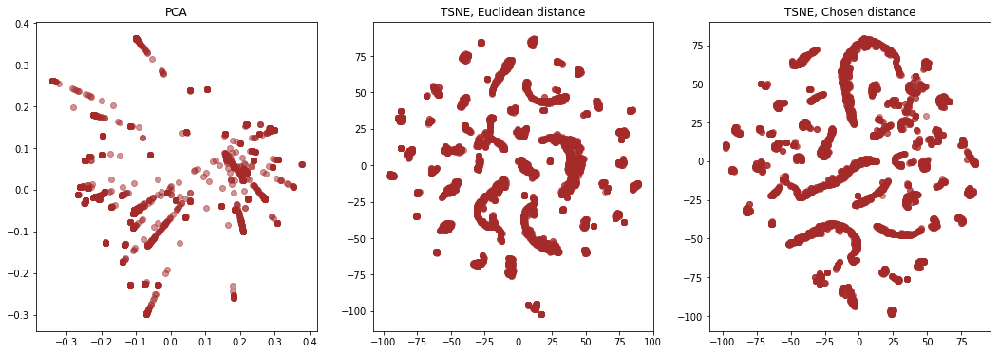

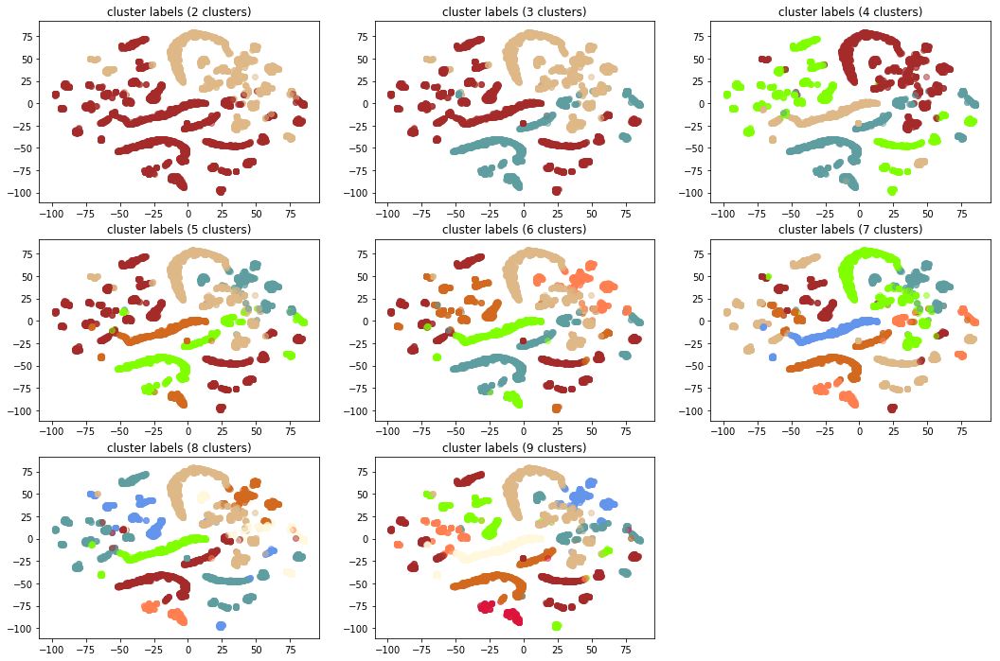

In [14]:
spectra_2D = build_images_KMeans(spectra, spectrum_columns, spectra_distances, colors, TSNE_learning_rate=500, TSNE_n_iter=1500, TSNE_learning_rate2=300)

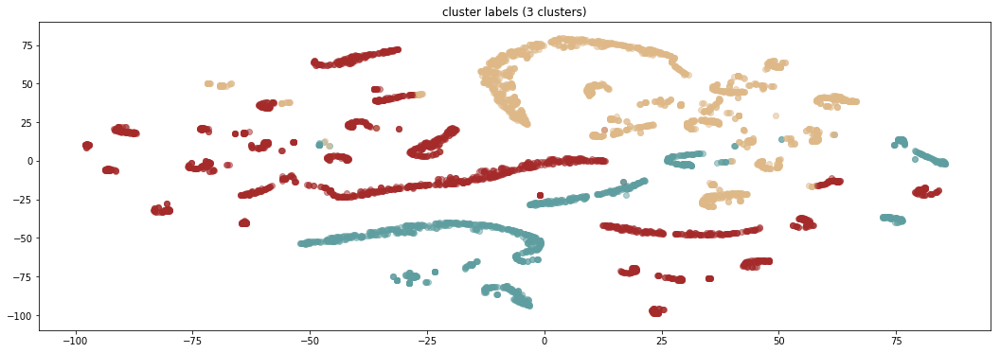

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,KMeans_clusters_3
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,0
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,0
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,1
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,0


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
13,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.3+640902',b'http://xmm-catalog.irap.omp.eu/source/200962...
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
57,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002540.0+641037',b'http://xmm-catalog.irap.omp.eu/source/204123...
77,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.3+640725',b'http://xmm-catalog.irap.omp.eu/source/200962...
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...
29,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002529.4+640631',b'http://xmm-catalog.irap.omp.eu/source/204123...
36,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002532.0+640545',b'http://xmm-catalog.irap.omp.eu/source/203105...
39,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002533.3+640629',b'http://xmm-catalog.irap.omp.eu/source/203105...
47,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640556',b'http://xmm-catalog.irap.omp.eu/source/200962...
48,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640617',b'http://xmm-catalog.irap.omp.eu/source/204123...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.044399,0.272344,0.188833,0.159045,0.289184,0.0,0.016149,0.009177,0.005666,0.002435,0.000987,0.000251,0.001050,0.002990,0.003765,0.003725
1,0.189587,0.134049,0.080336,0.155835,0.108908,0.0,0.139423,0.072590,0.041227,0.026067,0.013545,0.002215,0.005531,0.009894,0.010694,0.010099
2,0.121549,0.103383,0.301694,0.111051,0.148837,0.0,0.079134,0.021654,0.015162,0.016386,0.059765,0.000845,0.004224,0.005355,0.003865,0.007095


In [15]:
list_spectra_clusters, centers = print_clusters_structure_KMeans(spectra, spectrum_columns, other_names, spectra_distances, 3, colors,spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [16]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display((list_spectra_clusters[i])['gev_1FGL_Name'].unique())
print("centroids:")
display(centers)

0 cluster (#A52A2A)


array(["b'                  '", "b'1FGL J0205.6+6449 '",
       "b'1FGL J0240.5+6113 '", "b'1FGL J0319.7+4130 '",
       "b'1FGL J0319.7+1847 '", "b'1FGL J0416.8+0107 '",
       "b'1FGL J0534.5+2200 '", "b'1FGL J0633.9+1746 '",
       "b'1FGL J0650.7+2503 '", "b'1FGL J0956.5+6938 '",
       "b'1FGL J1000.1+6539 '", "b'1FGL J1018.6-5856 '",
       "b'1FGL J1119.4-6127c'", "b'1FGL J1221.3+3008 '",
       "b'1FGL J1230.8+1223 '", "b'1FGL J1256.2-0547 '",
       "b'1FGL J1325.6-4300 '", "b'1FGL J1418.7-6057 '",
       "b'1FGL J1459.4-6053 '", "b'1FGL J1714.5-3830c'",
       "b'1FGL J1718.2-3825 '", "b'1FGL J1745.6-2900c'",
       "b'1FGL J1747.9-2448 '", "b'1FGL J1800.5-2359c'",
       "b'1FGL J1813.3-1246 '", "b'1FGL J1848.1-0145c'",
       "b'1FGL J1910.9+0906c'", "b'1FGL J1922.9+1411 '",
       "b'1FGL J2000.0+6508 '", "b'1FGL J2015.7+3708 '",
       "b'1FGL J2021.0+3651 '", "b'1FGL J2032.2+4127 '",
       "b'1FGL J2323.4+5849 '"], dtype=object)

1 cluster (#DEB887)


array(["b'                  '", "b'1FGL J0035.9+5951 '",
       "b'1FGL J0205.6+6449 '", "b'1FGL J0222.6+4302 '",
       "b'1FGL J0319.7+4130 '", "b'1FGL J0416.8+0107 '",
       "b'1FGL J0534.5+2200 '", "b'1FGL J0650.7+2503 '",
       "b'1FGL J0721.9+7120 '", "b'1FGL J0956.5+6938 '",
       "b'1FGL J1000.1+6539 '", "b'1FGL J1103.7-2329 '",
       "b'1FGL J1104.4+3812 '", "b'1FGL J1136.6+7009 '",
       "b'1FGL J1217.7+3007 '", "b'1FGL J1221.3+3008 '",
       "b'1FGL J1230.8+1223 '", "b'1FGL J1428.7+4239 '",
       "b'1FGL J1514.7-5917 '", "b'1FGL J1513.2-5904 '",
       "b'1FGL J1617.5-5105c'", "b'1FGL J1626.0-4917c'",
       "b'1FGL J1640.8-4634c'", "b'1FGL J1653.9+3945 '",
       "b'1FGL J1711.7-3944c'", "b'1FGL J1745.6-2900c'",
       "b'1FGL J1747.9-2448 '", "b'1FGL J1800.5-2359c'",
       "b'1FGL J1826.2-1450 '", "b'1FGL J1834.3-0842c'",
       "b'1FGL J1910.9+0906c'", "b'1FGL J2000.0+6508 '",
       "b'1FGL J2001.1+4351 '", "b'1FGL J2009.5-4849 '",
       "b'1FGL J2158.8-3013 '",

2 cluster (#5F9EA0)


array(["b'                  '", "b'1FGL J0956.5+6938 '",
       "b'1FGL J1015.1+4927 '", "b'1FGL J1103.7-2329 '",
       "b'1FGL J1221.5+2814 '", "b'1FGL J1221.3+3008 '",
       "b'1FGL J1325.6-4300 '", "b'1FGL J1513.2-5904 '",
       "b'1FGL J1555.7+1111 '", "b'1FGL J1745.6-2900c'",
       "b'1FGL J1747.9-2448 '", "b'1FGL J2202.8+4216 '",
       "b'1FGL J2323.4+5849 '"], dtype=object)

centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.044399,0.272344,0.188833,0.159045,0.289184,0.0,0.016149,0.009177,0.005666,0.002435,0.000987,0.000251,0.001050,0.002990,0.003765,0.003725
1,0.189587,0.134049,0.080336,0.155835,0.108908,0.0,0.139423,0.072590,0.041227,0.026067,0.013545,0.002215,0.005531,0.009894,0.010694,0.010099
2,0.121549,0.103383,0.301694,0.111051,0.148837,0.0,0.079134,0.021654,0.015162,0.016386,0.059765,0.000845,0.004224,0.005355,0.003865,0.007095


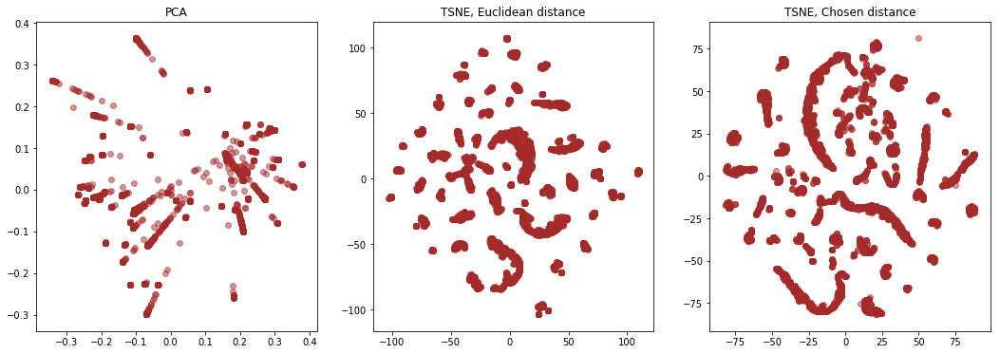

Clustering


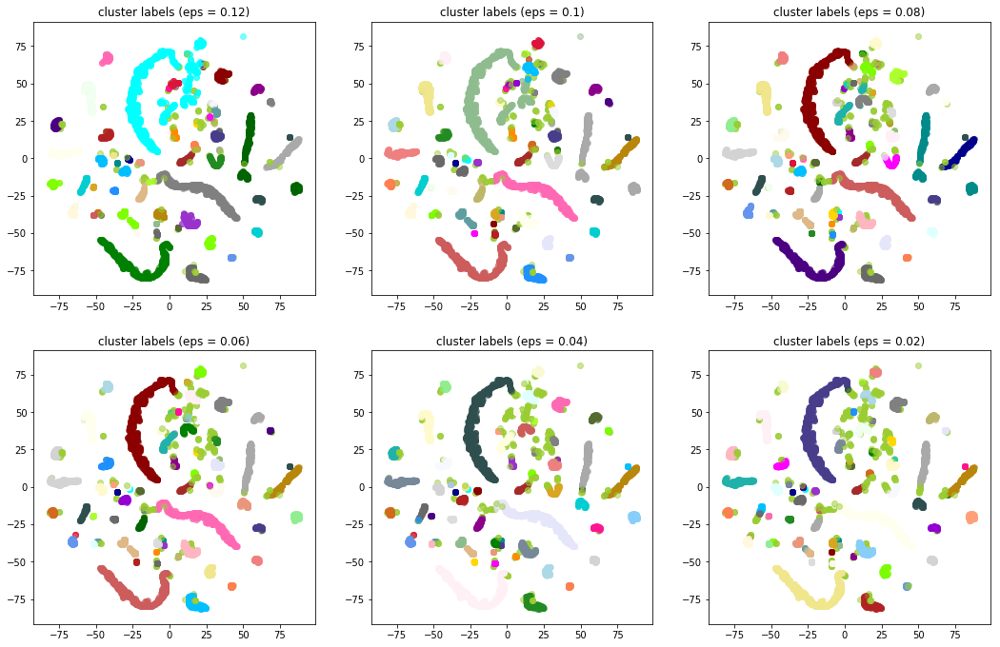

In [17]:
spectra_2D = build_images_DBSCAN(spectra, spectrum_columns, spectra_distances, colors, TSNE_learning_rate=500, TSNE_n_iter=1500, TSNE_learning_rate2=300)

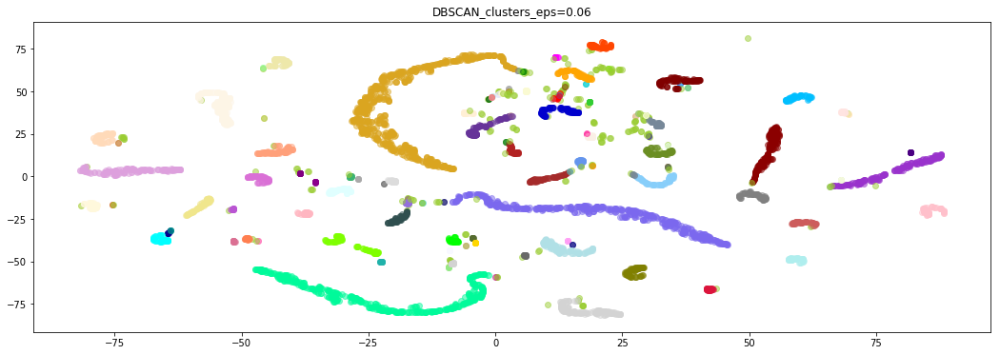

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,DBSCAN_clusters_eps=0.06
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,7
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,3
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,93
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,105


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
78,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.9+640854',b'http://xmm-catalog.irap.omp.eu/source/200962...
84,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002556.7+640733',b'http://xmm-catalog.irap.omp.eu/source/203105...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


4 cluster (#D2691E)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
102,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020526.2+645017',b'http://xmm-catalog.irap.omp.eu/source/201537...
105,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020529.3+645029',b'http://xmm-catalog.irap.omp.eu/source/201025...


5 cluster (#FF7F50)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
141,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022242.7+430405',b'http://xmm-catalog.irap.omp.eu/source/200029...


6 cluster (#6495ED)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
154,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023224.2+201413',b'http://xmm-catalog.irap.omp.eu/source/206042...
155,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.5+200908',b'http://xmm-catalog.irap.omp.eu/source/206042...
156,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.7+201053',b'http://xmm-catalog.irap.omp.eu/source/206042...
157,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023229.1+201103',b'http://xmm-catalog.irap.omp.eu/source/206042...
158,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023230.4+201703',b'http://xmm-catalog.irap.omp.eu/source/206042...
159,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023231.1+201600',b'http://xmm-catalog.irap.omp.eu/source/206042...
160,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023233.0+201352',b'http://xmm-catalog.irap.omp.eu/source/206042...
161,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023237.5+202201',b'http://xmm-catalog.irap.omp.eu/source/206042...
162,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023240.2+202304',b'http://xmm-catalog.irap.omp.eu/source/206042...
163,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023243.3+202100',b'http://xmm-catalog.irap.omp.eu/source/206042...


7 cluster (#FFF8DC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
190,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,1,b'3XMM J024005.3+611247',b'http://xmm-catalog.irap.omp.eu/source/205059...
191,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024008.8+610723',b'http://xmm-catalog.irap.omp.eu/source/202072...
192,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024010.4+611144',b'http://xmm-catalog.irap.omp.eu/source/201124...
193,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024010.8+611213',b'http://xmm-catalog.irap.omp.eu/source/205059...
194,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024011.3+610803',b'http://xmm-catalog.irap.omp.eu/source/205059...
195,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024014.6+610913',b'http://xmm-catalog.irap.omp.eu/source/205059...
196,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024025.4+611525',b'http://xmm-catalog.irap.omp.eu/source/205059...
197,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024025.5+610840',b'http://xmm-catalog.irap.omp.eu/source/205059...
198,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024026.2+611436',b'http://xmm-catalog.irap.omp.eu/source/205059...
199,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024026.7+611716',b'http://xmm-catalog.irap.omp.eu/source/205059...


8 cluster (#DC143C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
236,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031611.0+411759',b'http://xmm-catalog.irap.omp.eu/source/201515...
237,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031613.8+411422',b'http://xmm-catalog.irap.omp.eu/source/201515...
238,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031614.1+412536',b'http://xmm-catalog.irap.omp.eu/source/201515...
240,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031618.0+411507',b'http://xmm-catalog.irap.omp.eu/source/201515...
241,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.3+412446',b'http://xmm-catalog.irap.omp.eu/source/201515...
242,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.5+411757',b'http://xmm-catalog.irap.omp.eu/source/201515...
243,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.6+411646',b'http://xmm-catalog.irap.omp.eu/source/201515...
244,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031621.8+411714',b'http://xmm-catalog.irap.omp.eu/source/201515...
245,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031631.1+412610',b'http://xmm-catalog.irap.omp.eu/source/201515...
246,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031637.1+412352',b'http://xmm-catalog.irap.omp.eu/source/201515...


9 cluster (#00FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
266,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.3+412927',b'http://xmm-catalog.irap.omp.eu/source/200851...
268,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.0+412950',b'http://xmm-catalog.irap.omp.eu/source/203057...
269,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.5+413706',b'http://xmm-catalog.irap.omp.eu/source/203057...
270,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.8+412908',b'http://xmm-catalog.irap.omp.eu/source/200851...
271,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.2+412920',b'http://xmm-catalog.irap.omp.eu/source/203057...
273,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031926.8+412838',b'http://xmm-catalog.irap.omp.eu/source/203057...
274,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.3+413549',b'http://xmm-catalog.irap.omp.eu/source/200851...
275,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.4+412819',b'http://xmm-catalog.irap.omp.eu/source/200851...
278,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.0+413445',b'http://xmm-catalog.irap.omp.eu/source/203057...
284,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031934.4+412954',b'http://xmm-catalog.irap.omp.eu/source/203057...


10 cluster (#00008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
267,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.7+413129',b'http://xmm-catalog.irap.omp.eu/source/200851...
272,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.5+413300',b'http://xmm-catalog.irap.omp.eu/source/200851...
277,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031929.9+413141',b'http://xmm-catalog.irap.omp.eu/source/200851...
280,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.5+413350',b'http://xmm-catalog.irap.omp.eu/source/200851...
282,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031932.4+412931',b'http://xmm-catalog.irap.omp.eu/source/203057...
285,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031935.3+412900',b'http://xmm-catalog.irap.omp.eu/source/200851...
286,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031937.5+413128',b'http://xmm-catalog.irap.omp.eu/source/203057...


11 cluster (#008B8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
276,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.7+413323',b'http://xmm-catalog.irap.omp.eu/source/203057...
281,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031932.0+412954',b'http://xmm-catalog.irap.omp.eu/source/203057...
287,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031938.0+413050',b'http://xmm-catalog.irap.omp.eu/source/200851...
292,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031941.3+413203',b'http://xmm-catalog.irap.omp.eu/source/200851...


12 cluster (#B8860B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
279,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.2+413107',b'http://xmm-catalog.irap.omp.eu/source/203057...
291,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031940.7+413218',b'http://xmm-catalog.irap.omp.eu/source/203057...
313,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J032000.0+413130',b'http://xmm-catalog.irap.omp.eu/source/200851...


13 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
283,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031933.4+412947',b'http://xmm-catalog.irap.omp.eu/source/200851...
293,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031941.5+413017',b'http://xmm-catalog.irap.omp.eu/source/203057...
301,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031947.5+413210',b'http://xmm-catalog.irap.omp.eu/source/203057...


14 cluster (#006400)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
295,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031942.8+412940',b'http://xmm-catalog.irap.omp.eu/source/200851...
305,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031952.8+413010',b'http://xmm-catalog.irap.omp.eu/source/200851...


15 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
332,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032015.2+185052',b'http://xmm-catalog.irap.omp.eu/source/203001...
335,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032016.4+185143',b'http://xmm-catalog.irap.omp.eu/source/203001...
340,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032018.1+184914',b'http://xmm-catalog.irap.omp.eu/source/203001...
341,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.6+184826',b'http://xmm-catalog.irap.omp.eu/source/203001...
342,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.9+185315',b'http://xmm-catalog.irap.omp.eu/source/203001...


16 cluster (#BDB76B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
343,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034851.9-115713',b'http://xmm-catalog.irap.omp.eu/source/200943...
344,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034852.2-115600',b'http://xmm-catalog.irap.omp.eu/source/200943...
345,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034919.1-120548',b'http://xmm-catalog.irap.omp.eu/source/200943...


17 cluster (#8B008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
347,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010625',b'http://xmm-catalog.irap.omp.eu/source/200943...
348,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010030',b'http://xmm-catalog.irap.omp.eu/source/200943...
349,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041631.0+005746',b'http://xmm-catalog.irap.omp.eu/source/201611...
350,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041633.6+010627',b'http://xmm-catalog.irap.omp.eu/source/200943...
351,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041641.5+011100',b'http://xmm-catalog.irap.omp.eu/source/201611...
352,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041644.8+011007',b'http://xmm-catalog.irap.omp.eu/source/200943...
355,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041656.6+005801',b'http://xmm-catalog.irap.omp.eu/source/200943...
356,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041702.2+011139',b'http://xmm-catalog.irap.omp.eu/source/201611...
357,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041711.9+005913',b'http://xmm-catalog.irap.omp.eu/source/201611...
358,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041716.1+010856',b'http://xmm-catalog.irap.omp.eu/source/201611...


18 cluster (#556B2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
361,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052402.0-693136',b'http://xmm-catalog.irap.omp.eu/source/201571...
362,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052407.1-693952',b'http://xmm-catalog.irap.omp.eu/source/201293...
365,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052426.2-693613',b'http://xmm-catalog.irap.omp.eu/source/201251...
368,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052441.9-693432',b'http://xmm-catalog.irap.omp.eu/source/201293...
369,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052442.1-694142',b'http://xmm-catalog.irap.omp.eu/source/206907...
370,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052443.0-693938',b'http://xmm-catalog.irap.omp.eu/source/201375...
371,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052444.0-694058',b'http://xmm-catalog.irap.omp.eu/source/206907...
372,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052449.2-693319',b'http://xmm-catalog.irap.omp.eu/source/201251...
373,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052450.0-693455',b'http://xmm-catalog.irap.omp.eu/source/201293...


19 cluster (#FF8C00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
363,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052414.8-693121',b'http://xmm-catalog.irap.omp.eu/source/202106...
1812,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122131.6+281358',b'http://xmm-catalog.irap.omp.eu/source/201048...


20 cluster (#9932CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
384,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053403.9+215451',b'http://xmm-catalog.irap.omp.eu/source/204125...
385,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
387,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
389,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
391,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
393,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
395,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
397,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
399,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
401,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...


21 cluster (#8B0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
386,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
388,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
390,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
392,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
394,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
396,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
398,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
400,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
402,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...
404,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...


22 cluster (#E9967A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
403,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...
626,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053444.2+220521',b'http://xmm-catalog.irap.omp.eu/source/206111...


23 cluster (#8FBC8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
488,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053416.7+220515',b'http://xmm-catalog.irap.omp.eu/source/206111...
596,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053435.6+215846',b'http://xmm-catalog.irap.omp.eu/source/203127...


24 cluster (#483D8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
563,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053430.9+215457',b'http://xmm-catalog.irap.omp.eu/source/201223...
573,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053432.0+215505',b'http://xmm-catalog.irap.omp.eu/source/201375...


25 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
610,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053440.7+220258',b'http://xmm-catalog.irap.omp.eu/source/203127...
688,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053455.3+215841',b'http://xmm-catalog.irap.omp.eu/source/204125...


26 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
762,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055010.9-321225',b'http://xmm-catalog.irap.omp.eu/source/201422...
763,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.5-322308',b'http://xmm-catalog.irap.omp.eu/source/201118...
764,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.6-321534',b'http://xmm-catalog.irap.omp.eu/source/201422...
765,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055016.8-321645',b'http://xmm-catalog.irap.omp.eu/source/201422...
766,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055017.4-322200',b'http://xmm-catalog.irap.omp.eu/source/201422...
767,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.0-321242',b'http://xmm-catalog.irap.omp.eu/source/201422...
769,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.1-321441',b'http://xmm-catalog.irap.omp.eu/source/201422...
770,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.6-321114',b'http://xmm-catalog.irap.omp.eu/source/201422...
771,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055020.5-322033',b'http://xmm-catalog.irap.omp.eu/source/201422...
772,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055021.6-321648',b'http://xmm-catalog.irap.omp.eu/source/201118...


27 cluster (#00CED1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
797,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055039.8-321516',b'http://xmm-catalog.irap.omp.eu/source/201118...
799,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055041.1-321710',b'http://xmm-catalog.irap.omp.eu/source/201422...


28 cluster (#9400D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
807,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055044.6-321422',b'http://xmm-catalog.irap.omp.eu/source/201422...
810,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055046.3-321714',b'http://xmm-catalog.irap.omp.eu/source/201422...


29 cluster (#FF1493)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
812,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055047.1-321615',b'http://xmm-catalog.irap.omp.eu/source/201118...
4738,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232337.9+584956',b'http://xmm-catalog.irap.omp.eu/source/200976...


30 cluster (#00BFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
834,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175211',b'http://xmm-catalog.irap.omp.eu/source/201111...
835,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175112',b'http://xmm-catalog.irap.omp.eu/source/201111...
836,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.9+174240',b'http://xmm-catalog.irap.omp.eu/source/201111...
837,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063328.2+173953',b'http://xmm-catalog.irap.omp.eu/source/201111...
838,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.0+174839',b'http://xmm-catalog.irap.omp.eu/source/201111...
839,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.1+174916',b'http://xmm-catalog.irap.omp.eu/source/201111...
840,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.8+174134',b'http://xmm-catalog.irap.omp.eu/source/205504...
841,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.2+175301',b'http://xmm-catalog.irap.omp.eu/source/201111...
842,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.9+175034',b'http://xmm-catalog.irap.omp.eu/source/201111...
843,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063332.0+174054',b'http://xmm-catalog.irap.omp.eu/source/201111...


31 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
890,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065043.3+250334',b'http://xmm-catalog.irap.omp.eu/source/200943...
891,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065046.3+250204',b'http://xmm-catalog.irap.omp.eu/source/200943...


32 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
893,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072131.2+712625',b'http://xmm-catalog.irap.omp.eu/source/201504...
894,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.2+712516',b'http://xmm-catalog.irap.omp.eu/source/201504...
895,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.7+712725',b'http://xmm-catalog.irap.omp.eu/source/201504...
896,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.3+712105',b'http://xmm-catalog.irap.omp.eu/source/200128...
897,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.6+712248',b'http://xmm-catalog.irap.omp.eu/source/201504...
898,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.8+711800',b'http://xmm-catalog.irap.omp.eu/source/201504...
899,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072146.0+712541',b'http://xmm-catalog.irap.omp.eu/source/201504...
900,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072147.0+712211',b'http://xmm-catalog.irap.omp.eu/source/200128...
901,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072148.5+712601',b'http://xmm-catalog.irap.omp.eu/source/201504...
902,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072149.3+712144',b'http://xmm-catalog.irap.omp.eu/source/200128...


33 cluster (#1E90FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
911,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083240.5-451222',b'http://xmm-catalog.irap.omp.eu/source/206720...
912,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083241.3-451401',b'http://xmm-catalog.irap.omp.eu/source/206720...


34 cluster (#B22222)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
913,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095503.8+694329',b'http://xmm-catalog.irap.omp.eu/source/201122...
914,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.0+693600',b'http://xmm-catalog.irap.omp.eu/source/206578...
915,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.1+694442',b'http://xmm-catalog.irap.omp.eu/source/201122...
916,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.8+693720',b'http://xmm-catalog.irap.omp.eu/source/206578...
917,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095507.1+693701',b'http://xmm-catalog.irap.omp.eu/source/202060...
918,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.1+693549',b'http://xmm-catalog.irap.omp.eu/source/201122...
919,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.9+694330',b'http://xmm-catalog.irap.omp.eu/source/201122...
920,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095510.4+693954',b'http://xmm-catalog.irap.omp.eu/source/201122...
921,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095512.3+694639',b'http://xmm-catalog.irap.omp.eu/source/202060...
922,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095514.8+693613',b'http://xmm-catalog.irap.omp.eu/source/201122...


35 cluster (#FFFAF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
942,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095533.5+693425',b'http://xmm-catalog.irap.omp.eu/source/206578...
967,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.7+694233',b'http://xmm-catalog.irap.omp.eu/source/206578...


36 cluster (#228B22)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
951,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095542.9+694227',b'http://xmm-catalog.irap.omp.eu/source/205605...
957,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095547.9+694202',b'http://xmm-catalog.irap.omp.eu/source/205601...
973,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095555.6+693915',b'http://xmm-catalog.irap.omp.eu/source/206578...


37 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
960,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095549.3+694224',b'http://xmm-catalog.irap.omp.eu/source/202060...
966,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.5+693939',b'http://xmm-catalog.irap.omp.eu/source/206578...


38 cluster (#DCDCDC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
977,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095810.3+652720',b'http://xmm-catalog.irap.omp.eu/source/203025...
978,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095814.8+652801',b'http://xmm-catalog.irap.omp.eu/source/203025...
979,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095827.2+653540',b'http://xmm-catalog.irap.omp.eu/source/205024...
980,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095828.3+653424',b'http://xmm-catalog.irap.omp.eu/source/205024...
981,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095833.0+652835',b'http://xmm-catalog.irap.omp.eu/source/205024...
982,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095837.5+653505',b'http://xmm-catalog.irap.omp.eu/source/205024...
983,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095840.4+654057',b'http://xmm-catalog.irap.omp.eu/source/205024...
984,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+653449',b'http://xmm-catalog.irap.omp.eu/source/203025...
985,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+652848',b'http://xmm-catalog.irap.omp.eu/source/203025...
986,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.9+652711',b'http://xmm-catalog.irap.omp.eu/source/205024...


39 cluster (#F8F8FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1004,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101441.7+493104',b'http://xmm-catalog.irap.omp.eu/source/202063...
1005,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101451.2+492337',b'http://xmm-catalog.irap.omp.eu/source/202063...
1006,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.1+492522',b'http://xmm-catalog.irap.omp.eu/source/202063...
1007,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.4+493047',b'http://xmm-catalog.irap.omp.eu/source/202063...
1008,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101504.4+492653',b'http://xmm-catalog.irap.omp.eu/source/202063...
1009,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101508.0+493153',b'http://xmm-catalog.irap.omp.eu/source/202063...
1010,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101509.2+492738',b'http://xmm-catalog.irap.omp.eu/source/202063...
1011,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101514.5+493252',b'http://xmm-catalog.irap.omp.eu/source/202063...


40 cluster (#FFD700)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1059,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110306.4-233533',b'http://xmm-catalog.irap.omp.eu/source/202059...
1060,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.1-232754',b'http://xmm-catalog.irap.omp.eu/source/202059...
1061,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.6-233621',b'http://xmm-catalog.irap.omp.eu/source/202059...
1062,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.1-233448',b'http://xmm-catalog.irap.omp.eu/source/202059...
1063,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.4-232239',b'http://xmm-catalog.irap.omp.eu/source/202059...
1064,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110327.9-233631',b'http://xmm-catalog.irap.omp.eu/source/202059...
1066,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110337.5-232223',b'http://xmm-catalog.irap.omp.eu/source/202059...
1068,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110338.4-232257',b'http://xmm-catalog.irap.omp.eu/source/202059...
1069,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110345.0-232220',b'http://xmm-catalog.irap.omp.eu/source/202059...
1070,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110346.7-232359',b'http://xmm-catalog.irap.omp.eu/source/202059...


41 cluster (#DAA520)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1072,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+380539',b'http://xmm-catalog.irap.omp.eu/source/200992...
1073,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+381102',b'http://xmm-catalog.irap.omp.eu/source/201539...
1074,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.3+380832',b'http://xmm-catalog.irap.omp.eu/source/201589...
1075,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.6+380527',b'http://xmm-catalog.irap.omp.eu/source/201365...
1076,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.9+381512',b'http://xmm-catalog.irap.omp.eu/source/206709...
1077,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.1+380536',b'http://xmm-catalog.irap.omp.eu/source/204110...
1078,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.4+381536',b'http://xmm-catalog.irap.omp.eu/source/201589...
1079,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.6+380540',b'http://xmm-catalog.irap.omp.eu/source/201365...
1080,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+381101',b'http://xmm-catalog.irap.omp.eu/source/201539...
1081,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+380547',b'http://xmm-catalog.irap.omp.eu/source/201539...


42 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1323,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110423.4+381157',b'http://xmm-catalog.irap.omp.eu/source/201365...
1405,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110429.7+381257',b'http://xmm-catalog.irap.omp.eu/source/201589...


43 cluster (#008000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1341,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110424.7+381117',b'http://xmm-catalog.irap.omp.eu/source/200992...
1346,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110425.2+381201',b'http://xmm-catalog.irap.omp.eu/source/206563...
1432,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110431.8+381352',b'http://xmm-catalog.irap.omp.eu/source/201365...


44 cluster (#ADFF2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1350,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110425.7+381201',b'http://xmm-catalog.irap.omp.eu/source/201589...
1392,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110428.0+381140',b'http://xmm-catalog.irap.omp.eu/source/201365...


45 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1699,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111843.3-612529',b'http://xmm-catalog.irap.omp.eu/source/201507...
1700,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111843.8-612328',b'http://xmm-catalog.irap.omp.eu/source/206727...
1701,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111846.3-612429',b'http://xmm-catalog.irap.omp.eu/source/201507...
1702,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111847.6-613351',b'http://xmm-catalog.irap.omp.eu/source/206727...
1703,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111850.1-612223',b'http://xmm-catalog.irap.omp.eu/source/206727...
1704,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111850.7-612133',b'http://xmm-catalog.irap.omp.eu/source/206727...
1705,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111851.5-612450',b'http://xmm-catalog.irap.omp.eu/source/201507...
1706,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111853.1-613345',b'http://xmm-catalog.irap.omp.eu/source/201507...
1707,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111853.5-613458',b'http://xmm-catalog.irap.omp.eu/source/201507...
1708,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111855.0-612354',b'http://xmm-catalog.irap.omp.eu/source/201507...


46 cluster (#F0FFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1762,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.1+700256',b'http://xmm-catalog.irap.omp.eu/source/200941...
1763,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.9+700903',b'http://xmm-catalog.irap.omp.eu/source/200941...
1765,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113627.4+700532',b'http://xmm-catalog.irap.omp.eu/source/200941...
1766,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113628.1+700431',b'http://xmm-catalog.irap.omp.eu/source/200941...
1768,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113640.3+700542',b'http://xmm-catalog.irap.omp.eu/source/200941...


47 cluster (#FF69B4)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1769,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121755.6+300026',b'http://xmm-catalog.irap.omp.eu/source/201091...
1770,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121819.6+300010',b'http://xmm-catalog.irap.omp.eu/source/201091...


48 cluster (#CD5C5C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1771,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122102.5+281609',b'http://xmm-catalog.irap.omp.eu/source/201048...
1772,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+280805',b'http://xmm-catalog.irap.omp.eu/source/201048...
1773,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+281040',b'http://xmm-catalog.irap.omp.eu/source/201048...
1774,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.4+280846',b'http://xmm-catalog.irap.omp.eu/source/201048...
1775,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.0+281518',b'http://xmm-catalog.irap.omp.eu/source/201048...
1776,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.9+281618',b'http://xmm-catalog.irap.omp.eu/source/201048...
1777,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122108.2+281215',b'http://xmm-catalog.irap.omp.eu/source/201048...
1778,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.5+282103',b'http://xmm-catalog.irap.omp.eu/source/205022...
1779,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.6+280954',b'http://xmm-catalog.irap.omp.eu/source/205022...
1780,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.9+281118',b'http://xmm-catalog.irap.omp.eu/source/201048...


49 cluster (#4B0082)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1783,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122112.6+300637',b'http://xmm-catalog.irap.omp.eu/source/201118...
1785,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.3+300537',b'http://xmm-catalog.irap.omp.eu/source/201118...
1786,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.4+300651',b'http://xmm-catalog.irap.omp.eu/source/201118...
1787,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122115.1+300558',b'http://xmm-catalog.irap.omp.eu/source/201118...
1792,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122118.2+301543',b'http://xmm-catalog.irap.omp.eu/source/201118...
1794,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122120.2+301611',b'http://xmm-catalog.irap.omp.eu/source/201118...
1805,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122127.8+301438',b'http://xmm-catalog.irap.omp.eu/source/201118...
1806,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122128.7+301513',b'http://xmm-catalog.irap.omp.eu/source/201118...
1823,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122144.3+300547',b'http://xmm-catalog.irap.omp.eu/source/201118...
1829,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122148.8+300416',b'http://xmm-catalog.irap.omp.eu/source/201118...


50 cluster (#FFFFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1800,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122122.7+300932',b'http://xmm-catalog.irap.omp.eu/source/201118...
1801,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122124.2+301118',b'http://xmm-catalog.irap.omp.eu/source/201118...


51 cluster (#F0E68C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1836,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.7+122645',b'http://xmm-catalog.irap.omp.eu/source/201141...
1837,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.8+123115',b'http://xmm-catalog.irap.omp.eu/source/205518...
1839,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122656',b'http://xmm-catalog.irap.omp.eu/source/202009...
1840,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122819',b'http://xmm-catalog.irap.omp.eu/source/202009...
1841,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122908',b'http://xmm-catalog.irap.omp.eu/source/202009...
1842,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122218',b'http://xmm-catalog.irap.omp.eu/source/205518...
1843,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122507',b'http://xmm-catalog.irap.omp.eu/source/202009...
1844,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.5+121755',b'http://xmm-catalog.irap.omp.eu/source/206032...
1845,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.9+122914',b'http://xmm-catalog.irap.omp.eu/source/201141...
1846,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123029.0+123128',b'http://xmm-catalog.irap.omp.eu/source/206032...


52 cluster (#E6E6FA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1838,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.9+122101',b'http://xmm-catalog.irap.omp.eu/source/205518...
1895,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123053.9+122702',b'http://xmm-catalog.irap.omp.eu/source/202009...
1896,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123054.5+123000',b'http://xmm-catalog.irap.omp.eu/source/201060...


53 cluster (#FFF0F5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1851,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123031.3+122341',b'http://xmm-catalog.irap.omp.eu/source/205518...
1919,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123101.6+122335',b'http://xmm-catalog.irap.omp.eu/source/201141...


54 cluster (#7CFC00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1867,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123039.7+122448',b'http://xmm-catalog.irap.omp.eu/source/201141...
1890,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123049.3+122100',b'http://xmm-catalog.irap.omp.eu/source/202009...


55 cluster (#FFFACD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1870,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123041.3+122525',b'http://xmm-catalog.irap.omp.eu/source/202009...
1877,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123043.6+122618',b'http://xmm-catalog.irap.omp.eu/source/202009...
1883,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123046.3+122112',b'http://xmm-catalog.irap.omp.eu/source/202009...
1897,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123054.5+122131',b'http://xmm-catalog.irap.omp.eu/source/201141...
1898,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123055.0+121808',b'http://xmm-catalog.irap.omp.eu/source/202009...
1945,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123122.3+122936',b'http://xmm-catalog.irap.omp.eu/source/205518...


56 cluster (#ADD8E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1873,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123042.8+122551',b'http://xmm-catalog.irap.omp.eu/source/202009...
1887,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123047.6+122740',b'http://xmm-catalog.irap.omp.eu/source/202009...


57 cluster (#F08080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1901,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123056.1+122240',b'http://xmm-catalog.irap.omp.eu/source/201141...
1922,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123102.7+122535',b'http://xmm-catalog.irap.omp.eu/source/202009...
1943,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123122.1+121735',b'http://xmm-catalog.irap.omp.eu/source/205518...


58 cluster (#E0FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1949,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125543.1-054058',b'http://xmm-catalog.irap.omp.eu/source/205560...
1950,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125544.2-055341',b'http://xmm-catalog.irap.omp.eu/source/206516...
1951,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125545.0-055206',b'http://xmm-catalog.irap.omp.eu/source/206516...
1952,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125548.8-054447',b'http://xmm-catalog.irap.omp.eu/source/206516...
1953,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.1-054257',b'http://xmm-catalog.irap.omp.eu/source/205560...
1954,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.5-054829',b'http://xmm-catalog.irap.omp.eu/source/205560...
1955,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.2-055101',b'http://xmm-catalog.irap.omp.eu/source/205560...
1956,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-055359',b'http://xmm-catalog.irap.omp.eu/source/206516...
1957,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-054934',b'http://xmm-catalog.irap.omp.eu/source/205560...
1958,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125553.9-055230',b'http://xmm-catalog.irap.omp.eu/source/206516...


59 cluster (#FAFAD2)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2002,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130234.9-630754',b'http://xmm-catalog.irap.omp.eu/source/203023...
2003,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130242.1-631310',b'http://xmm-catalog.irap.omp.eu/source/203034...
2004,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130244.3-630716',b'http://xmm-catalog.irap.omp.eu/source/203034...
2005,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130245.6-631532',b'http://xmm-catalog.irap.omp.eu/source/203034...
2006,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130246.7-631503',b'http://xmm-catalog.irap.omp.eu/source/203034...
2007,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130247.2-630647',b'http://xmm-catalog.irap.omp.eu/source/203034...
2008,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.1-631353',b'http://xmm-catalog.irap.omp.eu/source/203034...
2009,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.4-631216',b'http://xmm-catalog.irap.omp.eu/source/203023...
2010,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.1-630715',b'http://xmm-catalog.irap.omp.eu/source/203023...
2011,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.4-630832',b'http://xmm-catalog.irap.omp.eu/source/203034...


60 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2017,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132459.9-430841',b'http://xmm-catalog.irap.omp.eu/source/207240...
2018,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132501.0-430643',b'http://xmm-catalog.irap.omp.eu/source/200936...
2019,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132502.7-430243',b'http://xmm-catalog.irap.omp.eu/source/200936...
2020,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132503.1-425623',b'http://xmm-catalog.irap.omp.eu/source/200936...
2021,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.5-430407',b'http://xmm-catalog.irap.omp.eu/source/200936...
2022,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.6-430426',b'http://xmm-catalog.irap.omp.eu/source/200936...
2023,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.8-430436',b'http://xmm-catalog.irap.omp.eu/source/200936...
2024,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.0-430133',b'http://xmm-catalog.irap.omp.eu/source/200936...
2025,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.7-430433',b'http://xmm-catalog.irap.omp.eu/source/207240...
2026,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.8-425539',b'http://xmm-catalog.irap.omp.eu/source/207240...


61 cluster (#90EE90)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2082,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.4-430202',b'http://xmm-catalog.irap.omp.eu/source/207240...
2096,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132531.2-430039',b'http://xmm-catalog.irap.omp.eu/source/207240...


62 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2148,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135611.5-642817',b'http://xmm-catalog.irap.omp.eu/source/206032...
2149,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.1-642434',b'http://xmm-catalog.irap.omp.eu/source/206032...
2150,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.5-642656',b'http://xmm-catalog.irap.omp.eu/source/206032...
2151,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135615.6-642325',b'http://xmm-catalog.irap.omp.eu/source/206032...
2152,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135619.8-642501',b'http://xmm-catalog.irap.omp.eu/source/203069...
2153,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.0-643226',b'http://xmm-catalog.irap.omp.eu/source/206032...
2154,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.6-642949',b'http://xmm-catalog.irap.omp.eu/source/206032...
2155,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135624.4-643101',b'http://xmm-catalog.irap.omp.eu/source/206032...
2156,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135628.7-642250',b'http://xmm-catalog.irap.omp.eu/source/203069...
2157,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135642.1-642400',b'http://xmm-catalog.irap.omp.eu/source/203069...


63 cluster (#FFB6C1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2165,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141813.4-610150',b'http://xmm-catalog.irap.omp.eu/source/205557...
2166,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141815.0-605943',b'http://xmm-catalog.irap.omp.eu/source/205557...
2167,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141825.9-610019',b'http://xmm-catalog.irap.omp.eu/source/205557...
2168,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141826.7-605355',b'http://xmm-catalog.irap.omp.eu/source/205557...
2169,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605924',b'http://xmm-catalog.irap.omp.eu/source/201511...
2170,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605117',b'http://xmm-catalog.irap.omp.eu/source/205557...
2171,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141829.2-605849',b'http://xmm-catalog.irap.omp.eu/source/205557...
2172,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141831.7-605824',b'http://xmm-catalog.irap.omp.eu/source/201511...
2173,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141836.8-605907',b'http://xmm-catalog.irap.omp.eu/source/205557...
2174,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141837.8-605252',b'http://xmm-catalog.irap.omp.eu/source/205557...


64 cluster (#FFA07A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2198,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142807.6+423631',b'http://xmm-catalog.irap.omp.eu/source/201118...
2199,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142808.0+424155',b'http://xmm-catalog.irap.omp.eu/source/201118...
2200,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142809.6+423329',b'http://xmm-catalog.irap.omp.eu/source/201118...
2201,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142811.5+424628',b'http://xmm-catalog.irap.omp.eu/source/201657...
2202,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142812.7+423726',b'http://xmm-catalog.irap.omp.eu/source/201118...
2203,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142813.4+423756',b'http://xmm-catalog.irap.omp.eu/source/201118...
2204,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142814.4+424055',b'http://xmm-catalog.irap.omp.eu/source/201118...
2205,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142815.4+424701',b'http://xmm-catalog.irap.omp.eu/source/203101...
2206,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142816.0+423604',b'http://xmm-catalog.irap.omp.eu/source/201118...
2207,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142818.2+424658',b'http://xmm-catalog.irap.omp.eu/source/201657...


65 cluster (#20B2AA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2270,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145903.3-605941',b'http://xmm-catalog.irap.omp.eu/source/206550...
2271,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145903.3-605401',b'http://xmm-catalog.irap.omp.eu/source/206550...
2272,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145904.4-610008',b'http://xmm-catalog.irap.omp.eu/source/206550...
2273,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145908.9-605531',b'http://xmm-catalog.irap.omp.eu/source/206550...
2274,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145919.7-605500',b'http://xmm-catalog.irap.omp.eu/source/206550...
2275,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145920.1-605350',b'http://xmm-catalog.irap.omp.eu/source/206550...
2276,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145928.0-605122',b'http://xmm-catalog.irap.omp.eu/source/206550...
2277,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145930.0-605318',b'http://xmm-catalog.irap.omp.eu/source/206550...
2278,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145933.2-605415',b'http://xmm-catalog.irap.omp.eu/source/206550...
2279,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145936.4-605115',b'http://xmm-catalog.irap.omp.eu/source/206550...


66 cluster (#87CEFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2285,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.0-590238',b'http://xmm-catalog.irap.omp.eu/source/203125...
2286,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.2-590213',b'http://xmm-catalog.irap.omp.eu/source/202070...
2287,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.3-590738',b'http://xmm-catalog.irap.omp.eu/source/202070...
2288,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.6-590230',b'http://xmm-catalog.irap.omp.eu/source/201281...
2289,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.9-590423',b'http://xmm-catalog.irap.omp.eu/source/203027...
2290,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151328.1-590747',b'http://xmm-catalog.irap.omp.eu/source/202070...
2291,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151329.2-590308',b'http://xmm-catalog.irap.omp.eu/source/203027...
2292,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.2-590358',b'http://xmm-catalog.irap.omp.eu/source/202070...
2293,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.9-590805',b'http://xmm-catalog.irap.omp.eu/source/202070...
2294,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151332.4-590123',b'http://xmm-catalog.irap.omp.eu/source/201281...


67 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2302,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151335.7-591601',b'http://xmm-catalog.irap.omp.eu/source/201281...
2304,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151336.0-591303',b'http://xmm-catalog.irap.omp.eu/source/203125...
2305,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151337.2-591550',b'http://xmm-catalog.irap.omp.eu/source/203027...
2312,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.3-590838',b'http://xmm-catalog.irap.omp.eu/source/203027...
2314,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.5-590854',b'http://xmm-catalog.irap.omp.eu/source/202070...
2317,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.0-591143',b'http://xmm-catalog.irap.omp.eu/source/202070...
2320,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.7-590917',b'http://xmm-catalog.irap.omp.eu/source/203027...
2321,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.4-591543',b'http://xmm-catalog.irap.omp.eu/source/201281...
2323,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.8-591317',b'http://xmm-catalog.irap.omp.eu/source/203125...
2325,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.9-590935',b'http://xmm-catalog.irap.omp.eu/source/203027...


68 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2336,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151346.0-590844',b'http://xmm-catalog.irap.omp.eu/source/202070...
2403,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151403.6-591007',b'http://xmm-catalog.irap.omp.eu/source/202070...
2411,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151410.6-591107',b'http://xmm-catalog.irap.omp.eu/source/202070...
2413,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151412.0-591121',b'http://xmm-catalog.irap.omp.eu/source/202070...
2415,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151412.2-591114',b'http://xmm-catalog.irap.omp.eu/source/203027...


69 cluster (#B0C4DE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2352,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151352.6-590821',b'http://xmm-catalog.irap.omp.eu/source/202070...
2362,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...


70 cluster (#FFFFE0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2414,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151412.0-591121',b'http://xmm-catalog.irap.omp.eu/source/202070...
2416,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151412.2-591114',b'http://xmm-catalog.irap.omp.eu/source/203027...


71 cluster (#00FF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2427,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.2+110501',b'http://xmm-catalog.irap.omp.eu/source/206569...
2428,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.7+110858',b'http://xmm-catalog.irap.omp.eu/source/200943...
2429,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.2+111432',b'http://xmm-catalog.irap.omp.eu/source/207277...
2430,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.4+111037',b'http://xmm-catalog.irap.omp.eu/source/200943...
2431,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.8+111609',b'http://xmm-catalog.irap.omp.eu/source/206569...
2432,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155519.1+111344',b'http://xmm-catalog.irap.omp.eu/source/200943...
2433,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155520.7+111756',b'http://xmm-catalog.irap.omp.eu/source/207277...
2434,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155521.2+111359',b'http://xmm-catalog.irap.omp.eu/source/207277...
2435,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155522.3+111804',b'http://xmm-catalog.irap.omp.eu/source/206569...
2436,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155523.4+111429',b'http://xmm-catalog.irap.omp.eu/source/207277...


72 cluster (#32CD32)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2466,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161606.4-505431',b'http://xmm-catalog.irap.omp.eu/source/201130...
2467,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161612.9-510027',b'http://xmm-catalog.irap.omp.eu/source/203023...
2468,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161617.2-505800',b'http://xmm-catalog.irap.omp.eu/source/203023...
2469,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161623.0-510045',b'http://xmm-catalog.irap.omp.eu/source/203023...
2470,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161628.1-505753',b'http://xmm-catalog.irap.omp.eu/source/203023...
2471,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161631.0-505750',b'http://xmm-catalog.irap.omp.eu/source/203023...
2472,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161634.4-510128',b'http://xmm-catalog.irap.omp.eu/source/203023...
2473,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.2-505238',b'http://xmm-catalog.irap.omp.eu/source/203023...
2474,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.4-505406',b'http://xmm-catalog.irap.omp.eu/source/201130...
2475,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161641.4-505514',b'http://xmm-catalog.irap.omp.eu/source/201130...


73 cluster (#FAF0E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2476,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162551.4-491717',b'http://xmm-catalog.irap.omp.eu/source/207419...
2477,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162553.1-490602',b'http://xmm-catalog.irap.omp.eu/source/207419...
2478,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162555.5-491256',b'http://xmm-catalog.irap.omp.eu/source/204032...
2479,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162556.8-490603',b'http://xmm-catalog.irap.omp.eu/source/204032...
2480,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162559.9-491150',b'http://xmm-catalog.irap.omp.eu/source/207419...
2481,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162601.8-491411',b'http://xmm-catalog.irap.omp.eu/source/204032...
2482,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162603.3-491034',b'http://xmm-catalog.irap.omp.eu/source/204032...
2483,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162604.1-491231',b'http://xmm-catalog.irap.omp.eu/source/207419...
2484,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162605.5-490902',b'http://xmm-catalog.irap.omp.eu/source/204032...
2485,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162608.7-491743',b'http://xmm-catalog.irap.omp.eu/source/204032...


74 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2505,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164000.3-463917',b'http://xmm-catalog.irap.omp.eu/source/203025...
2506,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164002.4-463200',b'http://xmm-catalog.irap.omp.eu/source/202063...
2507,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164004.1-463502',b'http://xmm-catalog.irap.omp.eu/source/202063...
2508,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164006.7-462914',b'http://xmm-catalog.irap.omp.eu/source/203025...
2509,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164012.7-463903',b'http://xmm-catalog.irap.omp.eu/source/202063...
2510,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164016.5-463631',b'http://xmm-catalog.irap.omp.eu/source/203025...
2511,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164017.7-464132',b'http://xmm-catalog.irap.omp.eu/source/202063...
2512,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164022.3-462838',b'http://xmm-catalog.irap.omp.eu/source/203025...
2513,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164035.9-463020',b'http://xmm-catalog.irap.omp.eu/source/203025...
2514,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164042.4-463154',b'http://xmm-catalog.irap.omp.eu/source/203025...


75 cluster (#800000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2518,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165326.3+394547',b'http://xmm-catalog.irap.omp.eu/source/206525...
2519,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.2+394531',b'http://xmm-catalog.irap.omp.eu/source/206525...
2520,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.9+394708',b'http://xmm-catalog.irap.omp.eu/source/206525...
2521,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.3+394726',b'http://xmm-catalog.irap.omp.eu/source/206525...
2522,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.4+395120',b'http://xmm-catalog.irap.omp.eu/source/206525...
2523,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165330.0+394535',b'http://xmm-catalog.irap.omp.eu/source/206525...
2524,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.8+394608',b'http://xmm-catalog.irap.omp.eu/source/201130...
2525,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.9+394654',b'http://xmm-catalog.irap.omp.eu/source/206525...
2526,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165332.0+394238',b'http://xmm-catalog.irap.omp.eu/source/201130...
2527,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165333.6+394244',b'http://xmm-catalog.irap.omp.eu/source/201130...


76 cluster (#66CDAA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2558,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165347.7+394518',b'http://xmm-catalog.irap.omp.eu/source/201130...
2576,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165354.1+394450',b'http://xmm-catalog.irap.omp.eu/source/201130...


77 cluster (#0000CD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2614,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171305.7-394319',b'http://xmm-catalog.irap.omp.eu/source/207408...
2615,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171306.8-395047',b'http://xmm-catalog.irap.omp.eu/source/207408...
2616,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171307.7-393944',b'http://xmm-catalog.irap.omp.eu/source/207221...
2617,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.1-395025',b'http://xmm-catalog.irap.omp.eu/source/200936...
2618,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394252',b'http://xmm-catalog.irap.omp.eu/source/207221...
2619,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394536',b'http://xmm-catalog.irap.omp.eu/source/207408...
2620,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.2-394826',b'http://xmm-catalog.irap.omp.eu/source/207408...
2621,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.5-394422',b'http://xmm-catalog.irap.omp.eu/source/207408...
2622,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.9-394237',b'http://xmm-catalog.irap.omp.eu/source/207221...
2623,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171311.0-394524',b'http://xmm-catalog.irap.omp.eu/source/207408...


78 cluster (#BA55D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2693,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171411.2-383255',b'http://xmm-catalog.irap.omp.eu/source/203065...
2694,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171415.2-383024',b'http://xmm-catalog.irap.omp.eu/source/203065...
2696,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171428.5-383600',b'http://xmm-catalog.irap.omp.eu/source/203065...
2697,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171430.9-382838',b'http://xmm-catalog.irap.omp.eu/source/203065...
2698,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171434.5-383311',b'http://xmm-catalog.irap.omp.eu/source/203065...
2699,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171435.5-382912',b'http://xmm-catalog.irap.omp.eu/source/203065...
2700,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171441.0-382854',b'http://xmm-catalog.irap.omp.eu/source/203065...
2701,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171443.3-383343',b'http://xmm-catalog.irap.omp.eu/source/203065...
2702,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171444.2-383147',b'http://xmm-catalog.irap.omp.eu/source/203065...
2703,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171445.4-383012',b'http://xmm-catalog.irap.omp.eu/source/203065...


79 cluster (#9370DB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2708,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171743.6-382226',b'http://xmm-catalog.irap.omp.eu/source/204019...
2709,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171750.9-383158',b'http://xmm-catalog.irap.omp.eu/source/204019...
2710,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171754.5-383132',b'http://xmm-catalog.irap.omp.eu/source/204019...
2711,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.4-382449',b'http://xmm-catalog.irap.omp.eu/source/204019...
2712,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.9-383141',b'http://xmm-catalog.irap.omp.eu/source/204019...
2713,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171807.0-382200',b'http://xmm-catalog.irap.omp.eu/source/204019...
2714,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171808.7-382604',b'http://xmm-catalog.irap.omp.eu/source/204019...
2715,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171811.9-381952',b'http://xmm-catalog.irap.omp.eu/source/204019...
2716,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171812.6-382252',b'http://xmm-catalog.irap.omp.eu/source/204019...
2717,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171813.6-382516',b'http://xmm-catalog.irap.omp.eu/source/204019...


80 cluster (#3CB371)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2728,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174443.3-301254',b'http://xmm-catalog.irap.omp.eu/source/204065...
2729,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174449.8-301758',b'http://xmm-catalog.irap.omp.eu/source/204065...
2732,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174453.9-300918',b'http://xmm-catalog.irap.omp.eu/source/204065...
2761,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.3-301744',b'http://xmm-catalog.irap.omp.eu/source/204065...
2762,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.4-300658',b'http://xmm-catalog.irap.omp.eu/source/204003...
2765,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.6-300937',b'http://xmm-catalog.irap.omp.eu/source/204065...
2768,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174459.3-300609',b'http://xmm-catalog.irap.omp.eu/source/204065...
2779,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174501.3-301157',b'http://xmm-catalog.irap.omp.eu/source/207483...
2789,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174502.4-301109',b'http://xmm-catalog.irap.omp.eu/source/204003...
2796,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174503.7-300843',b'http://xmm-catalog.irap.omp.eu/source/204065...


81 cluster (#7B68EE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2730,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.7-290659',b'http://xmm-catalog.irap.omp.eu/source/202026...
2731,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.8-290059',b'http://xmm-catalog.irap.omp.eu/source/206043...
2733,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.0-285926',b'http://xmm-catalog.irap.omp.eu/source/207242...
2734,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-285842',b'http://xmm-catalog.irap.omp.eu/source/201129...
2735,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-290112',b'http://xmm-catalog.irap.omp.eu/source/201113...
2736,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-285954',b'http://xmm-catalog.irap.omp.eu/source/205056...
2737,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-290552',b'http://xmm-catalog.irap.omp.eu/source/204024...
2738,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.1-291054',b'http://xmm-catalog.irap.omp.eu/source/204024...
2739,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-285752',b'http://xmm-catalog.irap.omp.eu/source/206946...
2740,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-290417',b'http://xmm-catalog.irap.omp.eu/source/201113...


82 cluster (#00FA9A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2849,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.1-290404',b'http://xmm-catalog.irap.omp.eu/source/202026...
2852,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285706',b'http://xmm-catalog.irap.omp.eu/source/207436...
2854,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285742',b'http://xmm-catalog.irap.omp.eu/source/202026...
2856,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-290145',b'http://xmm-catalog.irap.omp.eu/source/202026...
2858,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.0-290223',b'http://xmm-catalog.irap.omp.eu/source/202026...
2860,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.6-290347',b'http://xmm-catalog.irap.omp.eu/source/202026...
2863,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.8-285935',b'http://xmm-catalog.irap.omp.eu/source/202026...
2865,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.9-285844',b'http://xmm-catalog.irap.omp.eu/source/201113...
2868,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.0-290229',b'http://xmm-catalog.irap.omp.eu/source/201113...
2869,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.1-285623',b'http://xmm-catalog.irap.omp.eu/source/201129...


83 cluster (#48D1CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3166,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174532.4-290115',b'http://xmm-catalog.irap.omp.eu/source/207622...
3235,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174535.4-290131',b'http://xmm-catalog.irap.omp.eu/source/205056...


84 cluster (#C71585)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3167,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174532.4-290115',b'http://xmm-catalog.irap.omp.eu/source/207622...
3236,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174535.4-290131',b'http://xmm-catalog.irap.omp.eu/source/205056...


85 cluster (#191970)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3184,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.3-290103',b'http://xmm-catalog.irap.omp.eu/source/205062...
3192,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.8-290208',b'http://xmm-catalog.irap.omp.eu/source/205110...


86 cluster (#F5FFFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3185,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.3-290103',b'http://xmm-catalog.irap.omp.eu/source/205062...
3193,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.8-290208',b'http://xmm-catalog.irap.omp.eu/source/205110...


87 cluster (#FFE4E1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3620,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174734.6-244557',b'http://xmm-catalog.irap.omp.eu/source/207441...
3621,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174735.3-244822',b'http://xmm-catalog.irap.omp.eu/source/207441...
3622,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174737.6-244858',b'http://xmm-catalog.irap.omp.eu/source/207441...
3624,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174740.4-244809',b'http://xmm-catalog.irap.omp.eu/source/207441...
3625,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174744.0-244045',b'http://xmm-catalog.irap.omp.eu/source/207441...
3626,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174745.3-244114',b'http://xmm-catalog.irap.omp.eu/source/207441...
3627,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174753.3-244052',b'http://xmm-catalog.irap.omp.eu/source/207441...
3629,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174759.8-245323',b'http://xmm-catalog.irap.omp.eu/source/207441...
3630,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174800.3-244035',b'http://xmm-catalog.irap.omp.eu/source/207441...
3631,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174801.7-245357',b'http://xmm-catalog.irap.omp.eu/source/207441...


88 cluster (#FFE4B5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3632,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174802.1-244050',b'http://xmm-catalog.irap.omp.eu/source/207441...
3637,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174809.6-245303',b'http://xmm-catalog.irap.omp.eu/source/207441...


89 cluster (#FFDEAD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3633,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174802.3-244844',b'http://xmm-catalog.irap.omp.eu/source/207441...
3636,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174809.5-244420',b'http://xmm-catalog.irap.omp.eu/source/207441...


90 cluster (#000080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3634,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174804.7-244649',b'http://xmm-catalog.irap.omp.eu/source/207441...
3643,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174812.4-244636',b'http://xmm-catalog.irap.omp.eu/source/207441...


91 cluster (#FDF5E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3652,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.4-240519',b'http://xmm-catalog.irap.omp.eu/source/205038...
3653,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-235843',b'http://xmm-catalog.irap.omp.eu/source/205038...
3654,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-240651',b'http://xmm-catalog.irap.omp.eu/source/205038...
3655,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.0-240912',b'http://xmm-catalog.irap.omp.eu/source/205038...
3656,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.2-240808',b'http://xmm-catalog.irap.omp.eu/source/205038...
3657,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.3-240514',b'http://xmm-catalog.irap.omp.eu/source/205038...
3658,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.5-240622',b'http://xmm-catalog.irap.omp.eu/source/205038...
3659,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.0-240734',b'http://xmm-catalog.irap.omp.eu/source/205038...
3660,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240903',b'http://xmm-catalog.irap.omp.eu/source/205038...
3661,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240839',b'http://xmm-catalog.irap.omp.eu/source/205038...


92 cluster (#808000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3805,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.5-124807',b'http://xmm-catalog.irap.omp.eu/source/206939...
3806,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.6-124559',b'http://xmm-catalog.irap.omp.eu/source/206939...
3807,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.8-124907',b'http://xmm-catalog.irap.omp.eu/source/206939...
3808,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181258.6-124910',b'http://xmm-catalog.irap.omp.eu/source/206939...
3809,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181259.0-124627',b'http://xmm-catalog.irap.omp.eu/source/206939...
3810,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181300.3-125008',b'http://xmm-catalog.irap.omp.eu/source/206939...
3811,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181300.6-124950',b'http://xmm-catalog.irap.omp.eu/source/206939...
3812,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181301.4-124754',b'http://xmm-catalog.irap.omp.eu/source/206939...
3813,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181301.7-124718',b'http://xmm-catalog.irap.omp.eu/source/206939...
3814,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181302.1-124618',b'http://xmm-catalog.irap.omp.eu/source/206939...


93 cluster (#6B8E23)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3869,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,1,b'3XMM J182549.2-145024',b'http://xmm-catalog.irap.omp.eu/source/202029...
3870,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182550.5-145022',b'http://xmm-catalog.irap.omp.eu/source/201511...
3871,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.1-145125',b'http://xmm-catalog.irap.omp.eu/source/207429...
3872,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.3-145318',b'http://xmm-catalog.irap.omp.eu/source/202029...
3873,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182553.4-144946',b'http://xmm-catalog.irap.omp.eu/source/207429...
3874,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182555.9-144701',b'http://xmm-catalog.irap.omp.eu/source/205055...
3875,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.4-144544',b'http://xmm-catalog.irap.omp.eu/source/207429...
3876,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.7-144912',b'http://xmm-catalog.irap.omp.eu/source/205055...
3877,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.5-145410',b'http://xmm-catalog.irap.omp.eu/source/207429...
3878,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.8-145253',b'http://xmm-catalog.irap.omp.eu/source/207429...


94 cluster (#FFA500)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3931,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084810',b'http://xmm-catalog.irap.omp.eu/source/207232...
3932,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084639',b'http://xmm-catalog.irap.omp.eu/source/207232...
3933,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084609',b'http://xmm-catalog.irap.omp.eu/source/207232...
3934,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.2-084725',b'http://xmm-catalog.irap.omp.eu/source/207232...
3935,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183403.8-084700',b'http://xmm-catalog.irap.omp.eu/source/207430...
3936,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183405.9-084159',b'http://xmm-catalog.irap.omp.eu/source/207232...
3937,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183411.1-084530',b'http://xmm-catalog.irap.omp.eu/source/207232...
3938,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183412.0-083704',b'http://xmm-catalog.irap.omp.eu/source/207430...
3939,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183414.6-083501',b'http://xmm-catalog.irap.omp.eu/source/203025...
3940,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183416.0-084737',b'http://xmm-catalog.irap.omp.eu/source/207430...


95 cluster (#FF4500)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4002,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184026.7-053800',b'http://xmm-catalog.irap.omp.eu/source/206048...
4003,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184027.3-053631',b'http://xmm-catalog.irap.omp.eu/source/206048...
4004,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053938',b'http://xmm-catalog.irap.omp.eu/source/206048...
4005,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053016',b'http://xmm-catalog.irap.omp.eu/source/206048...
4006,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.4-053831',b'http://xmm-catalog.irap.omp.eu/source/206900...
4007,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.9-052946',b'http://xmm-catalog.irap.omp.eu/source/206048...
4008,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.0-053833',b'http://xmm-catalog.irap.omp.eu/source/206048...
4009,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.2-053959',b'http://xmm-catalog.irap.omp.eu/source/206900...
4010,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.5-053918',b'http://xmm-catalog.irap.omp.eu/source/206048...
4011,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184032.5-053453',b'http://xmm-catalog.irap.omp.eu/source/206048...


96 cluster (#DA70D6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4054,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184801.9-014626',b'http://xmm-catalog.irap.omp.eu/source/206929...
4055,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184803.2-014330',b'http://xmm-catalog.irap.omp.eu/source/206929...
4056,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184805.2-013727',b'http://xmm-catalog.irap.omp.eu/source/202070...
4057,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184807.0-013454',b'http://xmm-catalog.irap.omp.eu/source/206929...
4058,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184808.5-014306',b'http://xmm-catalog.irap.omp.eu/source/206929...
4059,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.3-014616',b'http://xmm-catalog.irap.omp.eu/source/206929...
4060,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.6-013801',b'http://xmm-catalog.irap.omp.eu/source/206929...
4061,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184810.1-014708',b'http://xmm-catalog.irap.omp.eu/source/206929...
4062,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-013456',b'http://xmm-catalog.irap.omp.eu/source/202039...
4063,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-014424',b'http://xmm-catalog.irap.omp.eu/source/202038...


97 cluster (#EEE8AA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4109,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191029.9+090246',b'http://xmm-catalog.irap.omp.eu/source/207242...
4110,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.4+090237',b'http://xmm-catalog.irap.omp.eu/source/207242...
4111,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090029',b'http://xmm-catalog.irap.omp.eu/source/207242...
4112,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090832',b'http://xmm-catalog.irap.omp.eu/source/207242...
4113,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090434',b'http://xmm-catalog.irap.omp.eu/source/200841...
4114,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191031.9+090039',b'http://xmm-catalog.irap.omp.eu/source/207242...
4115,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.0+090518',b'http://xmm-catalog.irap.omp.eu/source/207242...
4116,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.1+090143',b'http://xmm-catalog.irap.omp.eu/source/207242...
4117,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.4+090427',b'http://xmm-catalog.irap.omp.eu/source/207242...
4118,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191033.0+090309',b'http://xmm-catalog.irap.omp.eu/source/207242...


98 cluster (#98FB98)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4142,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191103.2+090658',b'http://xmm-catalog.irap.omp.eu/source/200841...
4156,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191112.1+090607',b'http://xmm-catalog.irap.omp.eu/source/200841...


99 cluster (#AFEEEE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4170,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192249.3+140821',b'http://xmm-catalog.irap.omp.eu/source/205546...
4171,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192250.8+141126',b'http://xmm-catalog.irap.omp.eu/source/205546...
4172,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.5+140155',b'http://xmm-catalog.irap.omp.eu/source/205546...
4173,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.7+140901',b'http://xmm-catalog.irap.omp.eu/source/205546...
4174,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192259.8+141346',b'http://xmm-catalog.irap.omp.eu/source/205546...
4175,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.0+140154',b'http://xmm-catalog.irap.omp.eu/source/205546...
4176,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.7+141147',b'http://xmm-catalog.irap.omp.eu/source/205546...
4177,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192303.6+140900',b'http://xmm-catalog.irap.omp.eu/source/205546...
4178,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192304.7+140807',b'http://xmm-catalog.irap.omp.eu/source/205546...
4179,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192305.3+141401',b'http://xmm-catalog.irap.omp.eu/source/205546...


100 cluster (#DB7093)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4214,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200045.9+435435',b'http://xmm-catalog.irap.omp.eu/source/206531...
4215,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200051.8+435349',b'http://xmm-catalog.irap.omp.eu/source/206531...
4216,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200102.3+434729',b'http://xmm-catalog.irap.omp.eu/source/206531...
4217,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200103.7+434835',b'http://xmm-catalog.irap.omp.eu/source/206531...
4218,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200106.7+434726',b'http://xmm-catalog.irap.omp.eu/source/206531...
4220,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.0+434922',b'http://xmm-catalog.irap.omp.eu/source/206531...
4221,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.5+435333',b'http://xmm-catalog.irap.omp.eu/source/206531...
4222,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200115.2+435206',b'http://xmm-catalog.irap.omp.eu/source/206531...
4223,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+435525',b'http://xmm-catalog.irap.omp.eu/source/206531...
4224,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+434928',b'http://xmm-catalog.irap.omp.eu/source/206531...


101 cluster (#FFEFD5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4230,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200859.1-484309',b'http://xmm-catalog.irap.omp.eu/source/202059...
4231,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200905.7-484326',b'http://xmm-catalog.irap.omp.eu/source/203040...
4232,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200911.3-484439',b'http://xmm-catalog.irap.omp.eu/source/203040...
4233,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200914.6-484359',b'http://xmm-catalog.irap.omp.eu/source/202059...
4234,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200915.8-485007',b'http://xmm-catalog.irap.omp.eu/source/203040...
4235,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.6-485002',b'http://xmm-catalog.irap.omp.eu/source/203040...
4236,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.7-485142',b'http://xmm-catalog.irap.omp.eu/source/203040...
4237,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200919.8-484738',b'http://xmm-catalog.irap.omp.eu/source/203040...
4238,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-485007',b'http://xmm-catalog.irap.omp.eu/source/202059...
4239,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-484754',b'http://xmm-catalog.irap.omp.eu/source/203040...


102 cluster (#FFDAB9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4253,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.5+371244',b'http://xmm-catalog.irap.omp.eu/source/207446...
4254,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.6+370353',b'http://xmm-catalog.irap.omp.eu/source/207446...
4255,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201510.4+370832',b'http://xmm-catalog.irap.omp.eu/source/207446...
4256,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201511.3+371202',b'http://xmm-catalog.irap.omp.eu/source/207446...
4257,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201512.2+370328',b'http://xmm-catalog.irap.omp.eu/source/207446...
4258,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.4+371400',b'http://xmm-catalog.irap.omp.eu/source/207446...
4259,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.7+371146',b'http://xmm-catalog.irap.omp.eu/source/207446...
4260,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201517.9+370916',b'http://xmm-catalog.irap.omp.eu/source/207446...
4261,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201518.3+371246',b'http://xmm-catalog.irap.omp.eu/source/207446...
4262,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201520.6+370308',b'http://xmm-catalog.irap.omp.eu/source/207446...


103 cluster (#CD853F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4269,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201528.7+371059',b'http://xmm-catalog.irap.omp.eu/source/207446...
4283,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201536.9+371122',b'http://xmm-catalog.irap.omp.eu/source/207446...


104 cluster (#FFC0CB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4319,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202038.6+365036',b'http://xmm-catalog.irap.omp.eu/source/204045...
4320,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202042.5+365021',b'http://xmm-catalog.irap.omp.eu/source/204045...
4321,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.0+364932',b'http://xmm-catalog.irap.omp.eu/source/204045...
4322,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.5+364727',b'http://xmm-catalog.irap.omp.eu/source/206740...
4323,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.1+365708',b'http://xmm-catalog.irap.omp.eu/source/204045...
4324,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.4+365154',b'http://xmm-catalog.irap.omp.eu/source/206740...
4325,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.7+365734',b'http://xmm-catalog.irap.omp.eu/source/204045...
4326,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.9+365204',b'http://xmm-catalog.irap.omp.eu/source/204045...
4327,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202048.6+365603',b'http://xmm-catalog.irap.omp.eu/source/206740...
4328,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202049.1+365750',b'http://xmm-catalog.irap.omp.eu/source/206740...


105 cluster (#DDA0DD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4378,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,1,b'3XMM J203145.8+412815',b'http://xmm-catalog.irap.omp.eu/source/203055...
4379,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.1+413121',b'http://xmm-catalog.irap.omp.eu/source/203055...
4380,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4381,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.0+412930',b'http://xmm-catalog.irap.omp.eu/source/203055...
4382,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.1+412510',b'http://xmm-catalog.irap.omp.eu/source/203055...
4383,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4384,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.7+412747',b'http://xmm-catalog.irap.omp.eu/source/203055...
4385,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.1+412422',b'http://xmm-catalog.irap.omp.eu/source/203055...
4386,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.5+412515',b'http://xmm-catalog.irap.omp.eu/source/207403...
4387,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203149.0+412825',b'http://xmm-catalog.irap.omp.eu/source/203055...


106 cluster (#B0E0E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4518,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.0-301651',b'http://xmm-catalog.irap.omp.eu/source/201249...
4519,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.2-300725',b'http://xmm-catalog.irap.omp.eu/source/204117...
4520,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.3-301614',b'http://xmm-catalog.irap.omp.eu/source/204117...
4521,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.7-301523',b'http://xmm-catalog.irap.omp.eu/source/200809...
4522,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.2-301357',b'http://xmm-catalog.irap.omp.eu/source/201589...
4523,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.3-300725',b'http://xmm-catalog.irap.omp.eu/source/200809...
4524,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.9-300626',b'http://xmm-catalog.irap.omp.eu/source/201249...
4525,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215827.0-300814',b'http://xmm-catalog.irap.omp.eu/source/201249...
4526,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.2-301635',b'http://xmm-catalog.irap.omp.eu/source/200809...
4527,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.3-301447',b'http://xmm-catalog.irap.omp.eu/source/201249...


107 cluster (#800080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4622,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.5+422150',b'http://xmm-catalog.irap.omp.eu/source/205043...
4623,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.8+422227',b'http://xmm-catalog.irap.omp.eu/source/205016...
4624,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220226.4+421105',b'http://xmm-catalog.irap.omp.eu/source/205016...
4625,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220233.2+422218',b'http://xmm-catalog.irap.omp.eu/source/205043...
4626,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220236.4+422217',b'http://xmm-catalog.irap.omp.eu/source/205043...
4627,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220238.3+422408',b'http://xmm-catalog.irap.omp.eu/source/205016...
4630,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.0+421103',b'http://xmm-catalog.irap.omp.eu/source/205016...
4631,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.9+422259',b'http://xmm-catalog.irap.omp.eu/source/205043...
4632,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220310.0+421327',b'http://xmm-catalog.irap.omp.eu/source/205016...
4633,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220310.0+421339',b'http://xmm-catalog.irap.omp.eu/source/205016...


108 cluster (#663399)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4638,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232300.9+584624',b'http://xmm-catalog.irap.omp.eu/source/200976...
4639,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.1+585544',b'http://xmm-catalog.irap.omp.eu/source/206504...
4640,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.6+585526',b'http://xmm-catalog.irap.omp.eu/source/201100...
4641,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232302.3+585319',b'http://xmm-catalog.irap.omp.eu/source/206504...
4642,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232303.1+584210',b'http://xmm-catalog.irap.omp.eu/source/204121...
4643,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232304.3+585345',b'http://xmm-catalog.irap.omp.eu/source/206504...
4644,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.2+584740',b'http://xmm-catalog.irap.omp.eu/source/200976...
4645,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.3+585257',b'http://xmm-catalog.irap.omp.eu/source/201100...
4646,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.7+584625',b'http://xmm-catalog.irap.omp.eu/source/200976...
4647,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232307.0+585506',b'http://xmm-catalog.irap.omp.eu/source/201100...


109 cluster (#FF0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4649,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232308.0+584844',b'http://xmm-catalog.irap.omp.eu/source/204121...
4652,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232309.4+584852',b'http://xmm-catalog.irap.omp.eu/source/204121...
4656,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232312.1+584849',b'http://xmm-catalog.irap.omp.eu/source/201655...
4662,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232313.1+584808',b'http://xmm-catalog.irap.omp.eu/source/200976...
4670,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232314.8+584949',b'http://xmm-catalog.irap.omp.eu/source/200976...
4676,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232316.4+585008',b'http://xmm-catalog.irap.omp.eu/source/200976...
4682,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232317.7+584732',b'http://xmm-catalog.irap.omp.eu/source/200976...
4689,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232320.2+584722',b'http://xmm-catalog.irap.omp.eu/source/200976...
4694,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232322.0+585022',b'http://xmm-catalog.irap.omp.eu/source/200976...
4707,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232326.2+584802',b'http://xmm-catalog.irap.omp.eu/source/200976...


110 cluster (#BC8F8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4658,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232312.3+584930',b'http://xmm-catalog.irap.omp.eu/source/200976...
4720,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232330.4+584358',b'http://xmm-catalog.irap.omp.eu/source/200976...
4732,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232335.9+584824',b'http://xmm-catalog.irap.omp.eu/source/206504...
4735,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232336.9+584741',b'http://xmm-catalog.irap.omp.eu/source/200976...


111 cluster (#4169E1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4691,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232320.5+585026',b'http://xmm-catalog.irap.omp.eu/source/200976...
4759,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232347.0+585010',b'http://xmm-catalog.irap.omp.eu/source/201100...


112 cluster (#8B4513)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4714,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232329.1+585027',b'http://xmm-catalog.irap.omp.eu/source/200976...
4740,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232339.3+584839',b'http://xmm-catalog.irap.omp.eu/source/201100...


113 cluster (#FA8072)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
13,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.3+640902',b'http://xmm-catalog.irap.omp.eu/source/200962...
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
29,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002529.4+640631',b'http://xmm-catalog.irap.omp.eu/source/204123...
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
35,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.3+640634',b'http://xmm-catalog.irap.omp.eu/source/205111...
36,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002532.0+640545',b'http://xmm-catalog.irap.omp.eu/source/203105...
39,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002533.3+640629',b'http://xmm-catalog.irap.omp.eu/source/203105...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.067686,0.071654,0.003336,0.037530,0.142596,0.0,0.131291,0.020006,0.006318,0.058148,0.440696,2.169460e-04,0.003552,0.008049,0.006797,0.002125
1,0.040423,0.042793,0.001992,0.022413,0.085160,0.0,0.078409,0.011948,0.003773,0.034727,0.263189,6.404134e-03,0.078056,0.186096,0.130319,0.014298
2,0.062149,0.065793,0.003063,0.034460,0.130931,0.0,0.120551,0.018369,0.005801,0.053391,0.404645,6.228368e-04,0.008520,0.030131,0.040312,0.021262
3,0.006551,0.229779,0.328693,0.087879,0.337562,0.0,0.001786,0.001102,0.000861,0.001145,0.002289,3.771125e-05,0.000556,0.000757,0.000642,0.000360
4,0.006237,0.221679,0.331836,0.081884,0.298975,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.028915e-03,0.011476,0.020337,0.018526,0.008019
5,0.193147,0.210673,0.145272,0.229977,0.192797,0.0,0.021028,0.005000,0.001348,0.000320,0.000086,2.036382e-05,0.000064,0.000090,0.000092,0.000085
6,0.071980,0.057552,0.054154,0.030370,0.116598,0.0,0.423394,0.090084,0.082726,0.028213,0.039412,1.642692e-04,0.000562,0.000869,0.001145,0.002775
7,0.014492,0.216087,0.330907,0.099136,0.322128,0.0,0.010675,0.002271,0.002086,0.000711,0.000994,3.824292e-06,0.000018,0.000066,0.000118,0.000307
8,0.201241,0.453033,0.000346,0.338229,0.000175,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.867817e-04,0.000807,0.001524,0.001926,0.002532
9,0.090766,0.231832,0.239770,0.192817,0.243373,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.884293e-05,0.000123,0.000519,0.000257,0.000525


In [18]:
list_spectra_clusters, centers = print_clusters_structure_DBSCAN(spectra, spectrum_columns, other_names, spectra_distances, 0.06, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

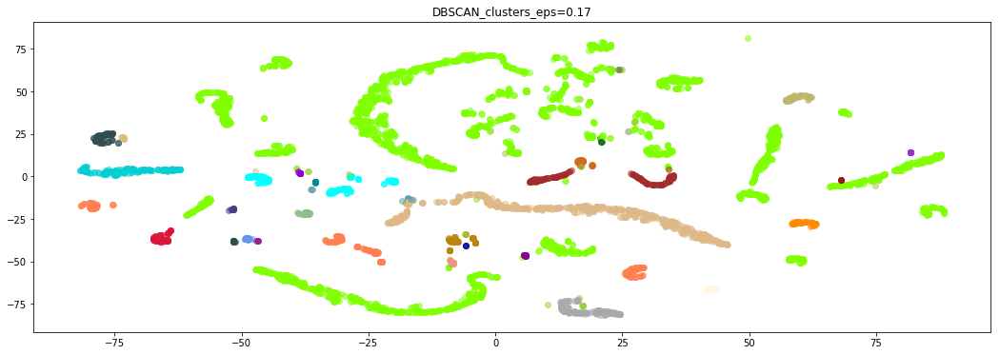

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,DBSCAN_clusters_eps=0.17
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,5
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,5
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,3
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,27


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
248,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031638.3+411637',b'http://xmm-catalog.irap.omp.eu/source/201515...
762,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055010.9-321225',b'http://xmm-catalog.irap.omp.eu/source/201422...
763,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.5-322308',b'http://xmm-catalog.irap.omp.eu/source/201118...
764,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.6-321534',b'http://xmm-catalog.irap.omp.eu/source/201422...
765,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055016.8-321645',b'http://xmm-catalog.irap.omp.eu/source/201422...
766,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055017.4-322200',b'http://xmm-catalog.irap.omp.eu/source/201422...
767,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.0-321242',b'http://xmm-catalog.irap.omp.eu/source/201422...
768,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.4-321550',b'http://xmm-catalog.irap.omp.eu/source/201118...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
13,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.3+640902',b'http://xmm-catalog.irap.omp.eu/source/200962...
57,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002540.0+641037',b'http://xmm-catalog.irap.omp.eu/source/204123...
77,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.3+640725',b'http://xmm-catalog.irap.omp.eu/source/200962...
807,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055044.6-321422',b'http://xmm-catalog.irap.omp.eu/source/201422...
808,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055044.9-321708',b'http://xmm-catalog.irap.omp.eu/source/201118...
810,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055046.3-321714',b'http://xmm-catalog.irap.omp.eu/source/201422...
815,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055050.0-321539',b'http://xmm-catalog.irap.omp.eu/source/201422...
1967,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125611.1-054721',b'http://xmm-catalog.irap.omp.eu/source/205560...
3241,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174535.6-290133',b'http://xmm-catalog.irap.omp.eu/source/207436...
4743,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232339.4+584814',b'http://xmm-catalog.irap.omp.eu/source/201100...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...
29,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002529.4+640631',b'http://xmm-catalog.irap.omp.eu/source/204123...
36,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002532.0+640545',b'http://xmm-catalog.irap.omp.eu/source/203105...
39,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002533.3+640629',b'http://xmm-catalog.irap.omp.eu/source/203105...
47,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640556',b'http://xmm-catalog.irap.omp.eu/source/200962...
50,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002536.3+641106',b'http://xmm-catalog.irap.omp.eu/source/203105...


4 cluster (#D2691E)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
35,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.3+640634',b'http://xmm-catalog.irap.omp.eu/source/205111...
154,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023224.2+201413',b'http://xmm-catalog.irap.omp.eu/source/206042...
155,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.5+200908',b'http://xmm-catalog.irap.omp.eu/source/206042...
156,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.7+201053',b'http://xmm-catalog.irap.omp.eu/source/206042...
157,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023229.1+201103',b'http://xmm-catalog.irap.omp.eu/source/206042...
158,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023230.4+201703',b'http://xmm-catalog.irap.omp.eu/source/206042...
159,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023231.1+201600',b'http://xmm-catalog.irap.omp.eu/source/206042...
160,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023233.0+201352',b'http://xmm-catalog.irap.omp.eu/source/206042...
161,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023237.5+202201',b'http://xmm-catalog.irap.omp.eu/source/206042...
162,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023240.2+202304',b'http://xmm-catalog.irap.omp.eu/source/206042...


5 cluster (#FF7F50)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


6 cluster (#6495ED)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
140,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022239.6+430207',b'http://xmm-catalog.irap.omp.eu/source/200029...


7 cluster (#FFF8DC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
236,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031611.0+411759',b'http://xmm-catalog.irap.omp.eu/source/201515...
237,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031613.8+411422',b'http://xmm-catalog.irap.omp.eu/source/201515...
238,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031614.1+412536',b'http://xmm-catalog.irap.omp.eu/source/201515...
239,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031617.9+411915',b'http://xmm-catalog.irap.omp.eu/source/201515...
240,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031618.0+411507',b'http://xmm-catalog.irap.omp.eu/source/201515...
241,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.3+412446',b'http://xmm-catalog.irap.omp.eu/source/201515...
242,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.5+411757',b'http://xmm-catalog.irap.omp.eu/source/201515...
243,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.6+411646',b'http://xmm-catalog.irap.omp.eu/source/201515...
244,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031621.8+411714',b'http://xmm-catalog.irap.omp.eu/source/201515...
245,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031631.1+412610',b'http://xmm-catalog.irap.omp.eu/source/201515...


8 cluster (#DC143C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
266,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.3+412927',b'http://xmm-catalog.irap.omp.eu/source/200851...
267,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.7+413129',b'http://xmm-catalog.irap.omp.eu/source/200851...
268,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.0+412950',b'http://xmm-catalog.irap.omp.eu/source/203057...
269,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.5+413706',b'http://xmm-catalog.irap.omp.eu/source/203057...
270,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.8+412908',b'http://xmm-catalog.irap.omp.eu/source/200851...
271,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.2+412920',b'http://xmm-catalog.irap.omp.eu/source/203057...
272,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.5+413300',b'http://xmm-catalog.irap.omp.eu/source/200851...
273,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031926.8+412838',b'http://xmm-catalog.irap.omp.eu/source/203057...
274,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.3+413549',b'http://xmm-catalog.irap.omp.eu/source/200851...
275,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.4+412819',b'http://xmm-catalog.irap.omp.eu/source/200851...


9 cluster (#00FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
332,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032015.2+185052',b'http://xmm-catalog.irap.omp.eu/source/203001...
335,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032016.4+185143',b'http://xmm-catalog.irap.omp.eu/source/203001...
340,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032018.1+184914',b'http://xmm-catalog.irap.omp.eu/source/203001...
341,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.6+184826',b'http://xmm-catalog.irap.omp.eu/source/203001...
342,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.9+185315',b'http://xmm-catalog.irap.omp.eu/source/203001...
890,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065043.3+250334',b'http://xmm-catalog.irap.omp.eu/source/200943...
891,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065046.3+250204',b'http://xmm-catalog.irap.omp.eu/source/200943...
977,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095810.3+652720',b'http://xmm-catalog.irap.omp.eu/source/203025...
978,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095814.8+652801',b'http://xmm-catalog.irap.omp.eu/source/203025...
979,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095827.2+653540',b'http://xmm-catalog.irap.omp.eu/source/205024...


10 cluster (#00008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
343,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034851.9-115713',b'http://xmm-catalog.irap.omp.eu/source/200943...
344,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034852.2-115600',b'http://xmm-catalog.irap.omp.eu/source/200943...
345,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034919.1-120548',b'http://xmm-catalog.irap.omp.eu/source/200943...


11 cluster (#008B8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
347,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010625',b'http://xmm-catalog.irap.omp.eu/source/200943...
348,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010030',b'http://xmm-catalog.irap.omp.eu/source/200943...
349,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041631.0+005746',b'http://xmm-catalog.irap.omp.eu/source/201611...
350,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041633.6+010627',b'http://xmm-catalog.irap.omp.eu/source/200943...
351,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041641.5+011100',b'http://xmm-catalog.irap.omp.eu/source/201611...
352,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041644.8+011007',b'http://xmm-catalog.irap.omp.eu/source/200943...
355,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041656.6+005801',b'http://xmm-catalog.irap.omp.eu/source/200943...
356,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041702.2+011139',b'http://xmm-catalog.irap.omp.eu/source/201611...
357,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041711.9+005913',b'http://xmm-catalog.irap.omp.eu/source/201611...
358,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041716.1+010856',b'http://xmm-catalog.irap.omp.eu/source/201611...


12 cluster (#B8860B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
361,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052402.0-693136',b'http://xmm-catalog.irap.omp.eu/source/201571...
362,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052407.1-693952',b'http://xmm-catalog.irap.omp.eu/source/201293...
364,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052419.2-693256',b'http://xmm-catalog.irap.omp.eu/source/202106...
365,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052426.2-693613',b'http://xmm-catalog.irap.omp.eu/source/201251...
367,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052437.8-694249',b'http://xmm-catalog.irap.omp.eu/source/206907...
368,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052441.9-693432',b'http://xmm-catalog.irap.omp.eu/source/201293...
369,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052442.1-694142',b'http://xmm-catalog.irap.omp.eu/source/206907...
370,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052443.0-693938',b'http://xmm-catalog.irap.omp.eu/source/201375...
371,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052444.0-694058',b'http://xmm-catalog.irap.omp.eu/source/206907...
372,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052449.2-693319',b'http://xmm-catalog.irap.omp.eu/source/201251...


13 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
376,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.5-693824',b'http://xmm-catalog.irap.omp.eu/source/201251...
383,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052459.1-693911',b'http://xmm-catalog.irap.omp.eu/source/201251...


14 cluster (#006400)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
377,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.5-693902',b'http://xmm-catalog.irap.omp.eu/source/201573...
380,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052458.0-693909',b'http://xmm-catalog.irap.omp.eu/source/201293...
790,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055036.6-321732',b'http://xmm-catalog.irap.omp.eu/source/201118...
4723,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232332.2+585011',b'http://xmm-catalog.irap.omp.eu/source/201100...


15 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
382,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052458.3-693831',b'http://xmm-catalog.irap.omp.eu/source/201571...
2017,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132459.9-430841',b'http://xmm-catalog.irap.omp.eu/source/207240...
2018,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132501.0-430643',b'http://xmm-catalog.irap.omp.eu/source/200936...
2019,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132502.7-430243',b'http://xmm-catalog.irap.omp.eu/source/200936...
2020,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132503.1-425623',b'http://xmm-catalog.irap.omp.eu/source/200936...
2021,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.5-430407',b'http://xmm-catalog.irap.omp.eu/source/200936...
2022,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.6-430426',b'http://xmm-catalog.irap.omp.eu/source/200936...
2023,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.8-430436',b'http://xmm-catalog.irap.omp.eu/source/200936...
2024,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.0-430133',b'http://xmm-catalog.irap.omp.eu/source/200936...
2025,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.7-430433',b'http://xmm-catalog.irap.omp.eu/source/207240...


16 cluster (#BDB76B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
834,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175211',b'http://xmm-catalog.irap.omp.eu/source/201111...
835,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175112',b'http://xmm-catalog.irap.omp.eu/source/201111...
836,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.9+174240',b'http://xmm-catalog.irap.omp.eu/source/201111...
837,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063328.2+173953',b'http://xmm-catalog.irap.omp.eu/source/201111...
838,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.0+174839',b'http://xmm-catalog.irap.omp.eu/source/201111...
839,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.1+174916',b'http://xmm-catalog.irap.omp.eu/source/201111...
840,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.8+174134',b'http://xmm-catalog.irap.omp.eu/source/205504...
841,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.2+175301',b'http://xmm-catalog.irap.omp.eu/source/201111...
842,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.9+175034',b'http://xmm-catalog.irap.omp.eu/source/201111...
843,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063332.0+174054',b'http://xmm-catalog.irap.omp.eu/source/201111...


17 cluster (#8B008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
893,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072131.2+712625',b'http://xmm-catalog.irap.omp.eu/source/201504...
894,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.2+712516',b'http://xmm-catalog.irap.omp.eu/source/201504...
895,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.7+712725',b'http://xmm-catalog.irap.omp.eu/source/201504...
896,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.3+712105',b'http://xmm-catalog.irap.omp.eu/source/200128...
897,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.6+712248',b'http://xmm-catalog.irap.omp.eu/source/201504...
898,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.8+711800',b'http://xmm-catalog.irap.omp.eu/source/201504...
899,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072146.0+712541',b'http://xmm-catalog.irap.omp.eu/source/201504...
900,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072147.0+712211',b'http://xmm-catalog.irap.omp.eu/source/200128...
901,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072148.5+712601',b'http://xmm-catalog.irap.omp.eu/source/201504...
902,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072149.3+712144',b'http://xmm-catalog.irap.omp.eu/source/200128...


18 cluster (#556B2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1362,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110426.6+381232',b'http://xmm-catalog.irap.omp.eu/source/201504...
4568,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215852.0-301331',b'http://xmm-catalog.irap.omp.eu/source/201249...


19 cluster (#FF8C00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1771,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122102.5+281609',b'http://xmm-catalog.irap.omp.eu/source/201048...
1772,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+280805',b'http://xmm-catalog.irap.omp.eu/source/201048...
1773,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+281040',b'http://xmm-catalog.irap.omp.eu/source/201048...
1774,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.4+280846',b'http://xmm-catalog.irap.omp.eu/source/201048...
1775,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.0+281518',b'http://xmm-catalog.irap.omp.eu/source/201048...
1776,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.9+281618',b'http://xmm-catalog.irap.omp.eu/source/201048...
1777,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122108.2+281215',b'http://xmm-catalog.irap.omp.eu/source/201048...
1778,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.5+282103',b'http://xmm-catalog.irap.omp.eu/source/205022...
1779,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.6+280954',b'http://xmm-catalog.irap.omp.eu/source/205022...
1780,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.9+281118',b'http://xmm-catalog.irap.omp.eu/source/201048...


20 cluster (#9932CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1783,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122112.6+300637',b'http://xmm-catalog.irap.omp.eu/source/201118...
1785,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.3+300537',b'http://xmm-catalog.irap.omp.eu/source/201118...
1786,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.4+300651',b'http://xmm-catalog.irap.omp.eu/source/201118...
1787,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122115.1+300558',b'http://xmm-catalog.irap.omp.eu/source/201118...
1792,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122118.2+301543',b'http://xmm-catalog.irap.omp.eu/source/201118...
1794,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122120.2+301611',b'http://xmm-catalog.irap.omp.eu/source/201118...
1805,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122127.8+301438',b'http://xmm-catalog.irap.omp.eu/source/201118...
1806,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122128.7+301513',b'http://xmm-catalog.irap.omp.eu/source/201118...
1823,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122144.3+300547',b'http://xmm-catalog.irap.omp.eu/source/201118...
1829,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122148.8+300416',b'http://xmm-catalog.irap.omp.eu/source/201118...


21 cluster (#8B0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1791,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122117.1+300951',b'http://xmm-catalog.irap.omp.eu/source/201118...
1800,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122122.7+300932',b'http://xmm-catalog.irap.omp.eu/source/201118...
1801,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122124.2+301118',b'http://xmm-catalog.irap.omp.eu/source/201118...


22 cluster (#E9967A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2074,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132524.4-430047',b'http://xmm-catalog.irap.omp.eu/source/200936...
2075,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132524.8-425948',b'http://xmm-catalog.irap.omp.eu/source/207240...
2079,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.2-430146',b'http://xmm-catalog.irap.omp.eu/source/200936...
2103,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.4-430025',b'http://xmm-catalog.irap.omp.eu/source/207240...
2104,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.7-430021',b'http://xmm-catalog.irap.omp.eu/source/207240...
2148,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135611.5-642817',b'http://xmm-catalog.irap.omp.eu/source/206032...
2149,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.1-642434',b'http://xmm-catalog.irap.omp.eu/source/206032...
2150,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.5-642656',b'http://xmm-catalog.irap.omp.eu/source/206032...
2151,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135615.6-642325',b'http://xmm-catalog.irap.omp.eu/source/206032...
2152,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135619.8-642501',b'http://xmm-catalog.irap.omp.eu/source/203069...


23 cluster (#8FBC8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2165,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141813.4-610150',b'http://xmm-catalog.irap.omp.eu/source/205557...
2166,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141815.0-605943',b'http://xmm-catalog.irap.omp.eu/source/205557...
2167,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141825.9-610019',b'http://xmm-catalog.irap.omp.eu/source/205557...
2168,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141826.7-605355',b'http://xmm-catalog.irap.omp.eu/source/205557...
2169,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605924',b'http://xmm-catalog.irap.omp.eu/source/201511...
2170,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605117',b'http://xmm-catalog.irap.omp.eu/source/205557...
2171,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141829.2-605849',b'http://xmm-catalog.irap.omp.eu/source/205557...
2172,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141831.7-605824',b'http://xmm-catalog.irap.omp.eu/source/201511...
2173,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141836.8-605907',b'http://xmm-catalog.irap.omp.eu/source/205557...
2174,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141837.8-605252',b'http://xmm-catalog.irap.omp.eu/source/205557...


24 cluster (#483D8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2693,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171411.2-383255',b'http://xmm-catalog.irap.omp.eu/source/203065...
2694,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171415.2-383024',b'http://xmm-catalog.irap.omp.eu/source/203065...
2695,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171420.3-383023',b'http://xmm-catalog.irap.omp.eu/source/203065...
2696,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171428.5-383600',b'http://xmm-catalog.irap.omp.eu/source/203065...
2697,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171430.9-382838',b'http://xmm-catalog.irap.omp.eu/source/203065...
2698,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171434.5-383311',b'http://xmm-catalog.irap.omp.eu/source/203065...
2699,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171435.5-382912',b'http://xmm-catalog.irap.omp.eu/source/203065...
2700,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171441.0-382854',b'http://xmm-catalog.irap.omp.eu/source/203065...
2701,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171443.3-383343',b'http://xmm-catalog.irap.omp.eu/source/203065...
2702,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171444.2-383147',b'http://xmm-catalog.irap.omp.eu/source/203065...


25 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4214,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200045.9+435435',b'http://xmm-catalog.irap.omp.eu/source/206531...
4215,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200051.8+435349',b'http://xmm-catalog.irap.omp.eu/source/206531...
4216,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200102.3+434729',b'http://xmm-catalog.irap.omp.eu/source/206531...
4217,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200103.7+434835',b'http://xmm-catalog.irap.omp.eu/source/206531...
4218,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200106.7+434726',b'http://xmm-catalog.irap.omp.eu/source/206531...
4220,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.0+434922',b'http://xmm-catalog.irap.omp.eu/source/206531...
4221,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.5+435333',b'http://xmm-catalog.irap.omp.eu/source/206531...
4222,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200115.2+435206',b'http://xmm-catalog.irap.omp.eu/source/206531...
4223,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+435525',b'http://xmm-catalog.irap.omp.eu/source/206531...
4224,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+434928',b'http://xmm-catalog.irap.omp.eu/source/206531...


26 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4253,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.5+371244',b'http://xmm-catalog.irap.omp.eu/source/207446...
4254,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.6+370353',b'http://xmm-catalog.irap.omp.eu/source/207446...
4255,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201510.4+370832',b'http://xmm-catalog.irap.omp.eu/source/207446...
4256,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201511.3+371202',b'http://xmm-catalog.irap.omp.eu/source/207446...
4257,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201512.2+370328',b'http://xmm-catalog.irap.omp.eu/source/207446...
4258,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.4+371400',b'http://xmm-catalog.irap.omp.eu/source/207446...
4259,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.7+371146',b'http://xmm-catalog.irap.omp.eu/source/207446...
4260,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201517.9+370916',b'http://xmm-catalog.irap.omp.eu/source/207446...
4261,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201518.3+371246',b'http://xmm-catalog.irap.omp.eu/source/207446...
4262,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201520.6+370308',b'http://xmm-catalog.irap.omp.eu/source/207446...


27 cluster (#00CED1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4378,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,1,b'3XMM J203145.8+412815',b'http://xmm-catalog.irap.omp.eu/source/203055...
4379,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.1+413121',b'http://xmm-catalog.irap.omp.eu/source/203055...
4380,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4381,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.0+412930',b'http://xmm-catalog.irap.omp.eu/source/203055...
4382,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.1+412510',b'http://xmm-catalog.irap.omp.eu/source/203055...
4383,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4384,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.7+412747',b'http://xmm-catalog.irap.omp.eu/source/203055...
4385,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.1+412422',b'http://xmm-catalog.irap.omp.eu/source/203055...
4386,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.5+412515',b'http://xmm-catalog.irap.omp.eu/source/207403...
4387,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203149.0+412825',b'http://xmm-catalog.irap.omp.eu/source/203055...


28 cluster (#9400D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4622,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.5+422150',b'http://xmm-catalog.irap.omp.eu/source/205043...
4623,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.8+422227',b'http://xmm-catalog.irap.omp.eu/source/205016...
4624,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220226.4+421105',b'http://xmm-catalog.irap.omp.eu/source/205016...
4625,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220233.2+422218',b'http://xmm-catalog.irap.omp.eu/source/205043...
4626,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220236.4+422217',b'http://xmm-catalog.irap.omp.eu/source/205043...
4627,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220238.3+422408',b'http://xmm-catalog.irap.omp.eu/source/205016...
4628,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220242.8+421700',b'http://xmm-catalog.irap.omp.eu/source/205016...
4629,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220243.2+421640',b'http://xmm-catalog.irap.omp.eu/source/205016...
4630,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.0+421103',b'http://xmm-catalog.irap.omp.eu/source/205016...
4631,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.9+422259',b'http://xmm-catalog.irap.omp.eu/source/205043...


29 cluster (#FF1493)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
48,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640617',b'http://xmm-catalog.irap.omp.eu/source/204123...
114,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020537.8+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
167,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023248.6+201717',b'http://xmm-catalog.irap.omp.eu/source/206042...
302,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031948.2+413037',b'http://xmm-catalog.irap.omp.eu/source/200851...
379,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052457.1-693856',b'http://xmm-catalog.irap.omp.eu/source/206907...
925,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095517.6+694441',b'http://xmm-catalog.irap.omp.eu/source/206578...
949,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095541.3+694705',b'http://xmm-catalog.irap.omp.eu/source/206578...
1065,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110336.5-233005',b'http://xmm-catalog.irap.omp.eu/source/202059...
1764,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113626.5+700927',b'http://xmm-catalog.irap.omp.eu/source/200941...
2085,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132527.6-430108',b'http://xmm-catalog.irap.omp.eu/source/200936...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.037400,0.040277,0.241659,0.023502,0.106393,0.0,0.172389,0.056680,0.040529,0.050847,0.204689,0.000131,2.239297e-03,0.006225,0.008201,0.008838
1,0.053003,0.334287,0.036508,0.176972,0.318855,0.0,0.023582,0.017646,0.011835,0.005413,0.000656,0.000175,1.237610e-03,0.005621,0.007618,0.006593
2,0.133965,0.065763,0.111195,0.149823,0.068151,0.0,0.018864,0.004809,0.002041,0.004169,0.028747,0.009526,5.827928e-02,0.138313,0.128620,0.077733
3,0.150335,0.158674,0.173600,0.156375,0.161301,0.0,0.082363,0.044025,0.025472,0.015660,0.007857,0.001289,3.577828e-03,0.005960,0.006434,0.007078
4,0.104850,0.062407,0.048672,0.037783,0.112211,0.0,0.375291,0.081279,0.074428,0.027100,0.043124,0.002526,1.166614e-02,0.008393,0.003668,0.006602
5,0.007198,0.230771,0.331181,0.087249,0.334917,0.0,0.003006,0.000932,0.000794,0.000616,0.001139,0.000032,4.033620e-04,0.000648,0.000645,0.000471
6,0.192980,0.210491,0.145147,0.229778,0.192631,0.0,0.021010,0.004995,0.001347,0.000320,0.000086,0.000126,2.356105e-04,0.000253,0.000253,0.000346
7,0.200995,0.452480,0.000346,0.337816,0.000175,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000231,9.271317e-04,0.001741,0.002272,0.003018
8,0.090146,0.230250,0.238133,0.191500,0.241711,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000123,7.382741e-04,0.002218,0.002073,0.003107
9,0.035935,0.169992,0.314887,0.089123,0.285309,0.0,0.052140,0.034486,0.015604,0.001196,0.000690,0.000032,8.428354e-05,0.000108,0.000160,0.000253


In [19]:
list_spectra_clusters, centers = print_clusters_structure_DBSCAN(spectra, spectrum_columns, other_names, spectra_distances, 0.17, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [20]:
spectra_distances.min(), spectra_distances.max()

(0.0, 0.07965970544349604)

* ### euclidean distance

In [21]:
# euclidean distance
from scipy.spatial.distance import euclidean
metric_function = "euclidean"
spectra_distances = pairwise_distances(spectra[spectrum_columns], metric=metric_function)

In [22]:
spectra_distances.min(), spectra_distances.max()

(0.0, 1.0167441681980438)

Clustering


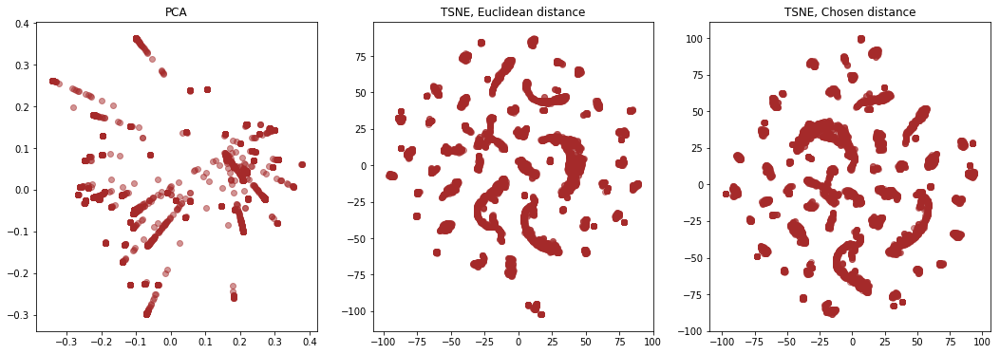

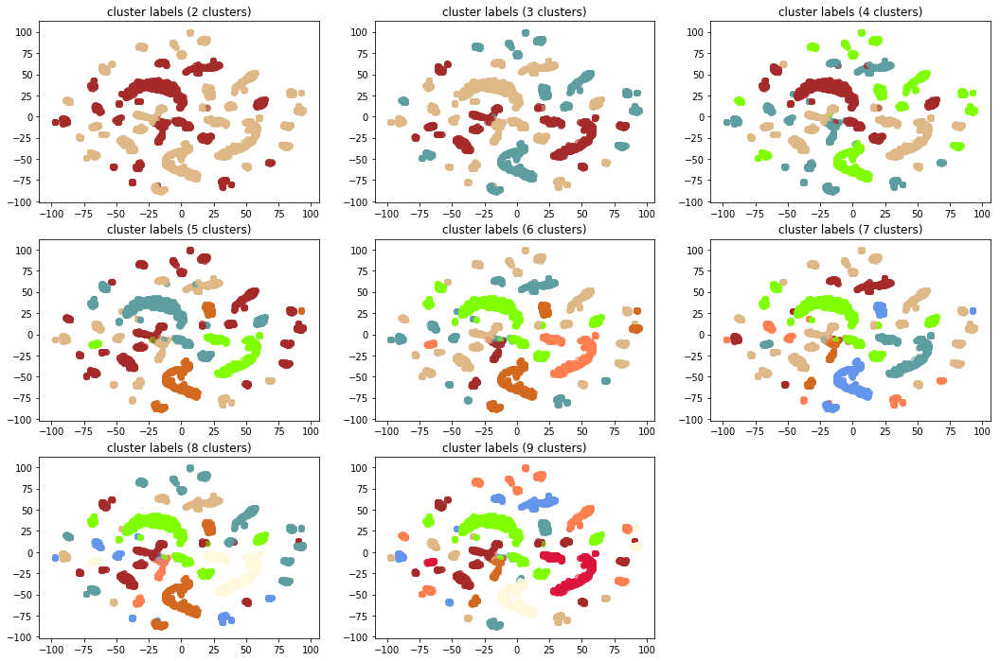

In [23]:
spectra_2D = build_images_KMeans(spectra, spectrum_columns, spectra_distances, colors, TSNE_learning_rate=500, TSNE_n_iter=1500, TSNE_learning_rate2=300)


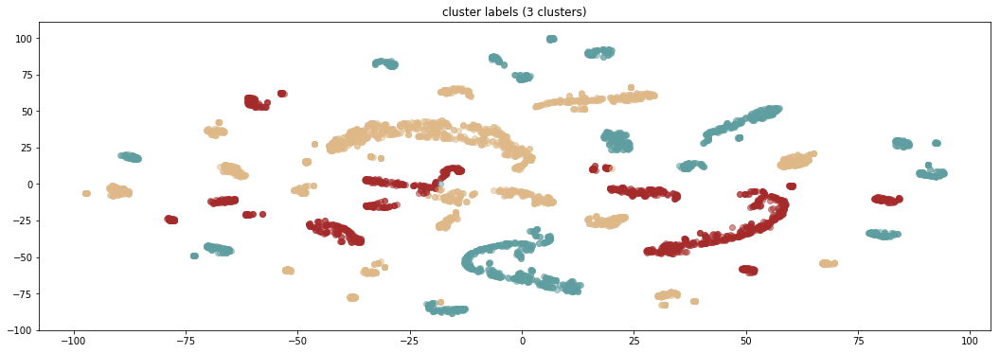

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,KMeans_clusters_3
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,2
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,2
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,2
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,0


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
140,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022239.6+430207',b'http://xmm-catalog.irap.omp.eu/source/200029...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.041883,0.305737,0.119444,0.179134,0.290411,0.0,0.020769,0.012475,0.008597,0.005053,0.002266,0.000940,0.002383,0.003251,0.003402,0.004253
1,0.222754,0.120773,0.057361,0.161007,0.088418,0.0,0.142965,0.061158,0.034379,0.026033,0.042877,0.001913,0.006253,0.011718,0.011659,0.010730
2,0.031249,0.161963,0.387262,0.099158,0.246915,0.0,0.029250,0.017563,0.011836,0.005730,0.002774,0.000071,0.000368,0.000728,0.001492,0.003642


In [24]:
list_spectra_clusters, centers = print_clusters_structure_KMeans(spectra, spectrum_columns, other_names, spectra_distances, 3, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [25]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display((list_spectra_clusters[i])['gev_1FGL_Name'].unique())

0 cluster (#A52A2A)


array(["b'1FGL J0222.6+4302 '", "b'1FGL J0319.7+4130 '",
       "b'1FGL J0633.9+1746 '", "b'1FGL J0721.9+7120 '",
       "b'1FGL J0956.5+6938 '", "b'1FGL J1217.7+3007 '",
       "b'1FGL J1230.8+1223 '", "b'1FGL J1418.7-6057 '",
       "b'1FGL J1718.2-3825 '", "b'                  '",
       "b'1FGL J1747.9-2448 '", "b'1FGL J1800.5-2359c'",
       "b'1FGL J1834.3-0842c'", "b'1FGL J1910.9+0906c'",
       "b'1FGL J1922.9+1411 '", "b'1FGL J2001.1+4351 '",
       "b'1FGL J2021.0+3651 '", "b'1FGL J2032.2+4127 '"], dtype=object)

1 cluster (#DEB887)


array(["b'                  '", "b'1FGL J0035.9+5951 '",
       "b'1FGL J0319.7+4130 '", "b'1FGL J0319.7+1847 '",
       "b'1FGL J0416.8+0107 '", "b'1FGL J0650.7+2503 '",
       "b'1FGL J0956.5+6938 '", "b'1FGL J1015.1+4927 '",
       "b'1FGL J1103.7-2329 '", "b'1FGL J1104.4+3812 '",
       "b'1FGL J1136.6+7009 '", "b'1FGL J1221.5+2814 '",
       "b'1FGL J1221.3+3008 '", "b'1FGL J1230.8+1223 '",
       "b'1FGL J1325.6-4300 '", "b'1FGL J1428.7+4239 '",
       "b'1FGL J1514.7-5917 '", "b'1FGL J1513.2-5904 '",
       "b'1FGL J1555.7+1111 '", "b'1FGL J1626.0-4917c'",
       "b'1FGL J1640.8-4634c'", "b'1FGL J1653.9+3945 '",
       "b'1FGL J1711.7-3944c'", "b'1FGL J1747.9-2448 '",
       "b'1FGL J2000.0+6508 '", "b'1FGL J2009.5-4849 '",
       "b'1FGL J2158.8-3013 '", "b'1FGL J2202.8+4216 '",
       "b'1FGL J2323.4+5849 '"], dtype=object)

2 cluster (#5F9EA0)


array(["b'1FGL J0205.6+6449 '", "b'1FGL J0240.5+6113 '",
       "b'1FGL J0534.5+2200 '", "b'                  '",
       "b'1FGL J1000.1+6539 '", "b'1FGL J1018.6-5856 '",
       "b'1FGL J1119.4-6127c'", "b'1FGL J1256.2-0547 '",
       "b'1FGL J1325.6-4300 '", "b'1FGL J1459.4-6053 '",
       "b'1FGL J1513.2-5904 '", "b'1FGL J1617.5-5105c'",
       "b'1FGL J1714.5-3830c'", "b'1FGL J1745.6-2900c'",
       "b'1FGL J1813.3-1246 '", "b'1FGL J1826.2-1450 '",
       "b'1FGL J1848.1-0145c'", "b'1FGL J1910.9+0906c'",
       "b'1FGL J2015.7+3708 '"], dtype=object)

In [26]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display((list_spectra_clusters[i])['s_MAIN_ID'].unique())

0 cluster (#A52A2A)


array(['[]',
       '["b\'[CHP2004] J095549.8+693934\'" "b\'[MTK2001b] 8\'"\r\r\n "b\'[CHP2004] J095637.5+694137\'" "b\'CXOU J095601.7+694308\'"\r\r\n "b\'CXOU J095548.9+694010\'" "b\'CXOU J095527.1+693923\'"\r\r\n "b\'CXOU J095552.8+694020\'" "b\'CXOU J095552.4+694024\'"\r\r\n "b\'CXOU J095550.7+694039\'" "b\'CXOU J095547.5+694120\'"\r\r\n "b\'CXOU J095527.2+694050\'" "b\'CXOU J095600.7+694107\'"\r\r\n "b\'CXOU J095549.1+694036\'" "b\'CXOU J095546.5+694040\'"\r\r\n "b\'CXOU J095552.7+694045\'" "b\'CXOU J095622.7+694134\'"\r\r\n "b\'CXOU J095551.4+694035\'" "b\'CXOU J095553.0+694048\'"\r\r\n "b\'CXOU J095614.7+694249\'" "b\'CXOU J095550.5+694056\'"\r\r\n "b\'CXOU J095544.8+694100\'" "b\'CXOU J095550.2+694039\'"\r\r\n "b\'[RVZ2004] 40.49+57.4\'" "b\'CXOU J095615.1+693951\'"\r\r\n "b\'[SST2011] J095554.56+694100.4\'" "b\'CXOU J095550.9+694044\'"\r\r\n "b\'CXOU J095552.2+694042\'" "b\'CXOU J095621.2+694224\'"\r\r\n "b\'CXOU J095554.1+694039\'" "b\'SN 2004am\'"\r\r\n "b\'[SST2011] J095552.

1 cluster (#DEB887)


array(['[]',
       '["b\'[CHP2004] J095549.8+693934\'" "b\'[MTK2001b] 8\'"\r\r\n "b\'[CHP2004] J095637.5+694137\'" "b\'CXOU J095601.7+694308\'"\r\r\n "b\'CXOU J095548.9+694010\'" "b\'CXOU J095527.1+693923\'"\r\r\n "b\'CXOU J095552.8+694020\'" "b\'CXOU J095552.4+694024\'"\r\r\n "b\'CXOU J095550.7+694039\'" "b\'CXOU J095547.5+694120\'"\r\r\n "b\'CXOU J095527.2+694050\'" "b\'CXOU J095600.7+694107\'"\r\r\n "b\'CXOU J095549.1+694036\'" "b\'CXOU J095546.5+694040\'"\r\r\n "b\'CXOU J095552.7+694045\'" "b\'CXOU J095622.7+694134\'"\r\r\n "b\'CXOU J095551.4+694035\'" "b\'CXOU J095553.0+694048\'"\r\r\n "b\'CXOU J095614.7+694249\'" "b\'CXOU J095550.5+694056\'"\r\r\n "b\'CXOU J095544.8+694100\'" "b\'CXOU J095550.2+694039\'"\r\r\n "b\'[RVZ2004] 40.49+57.4\'" "b\'CXOU J095615.1+693951\'"\r\r\n "b\'[SST2011] J095554.56+694100.4\'" "b\'CXOU J095550.9+694044\'"\r\r\n "b\'CXOU J095552.2+694042\'" "b\'CXOU J095621.2+694224\'"\r\r\n "b\'CXOU J095554.1+694039\'" "b\'SN 2004am\'"\r\r\n "b\'[SST2011] J095552.

2 cluster (#5F9EA0)


array(['[]', '["b\'LS   I +61  303\'" "b\'LS   I +61  303\'"]',
       '["b\'2FGL J1019.0-5856\'"]',
       '["b\'SSTGC 519103\'" "b\'SSTGC 519103\'" "b\'GCIRS  1W\'" "b\'GCIRS  8\'"]',
       '["b\'V* V479 Sct\'"]'], dtype=object)

[1.0, 0.8, 0.6000000000000001, 0.4, 0.2, 0.1, 0.01]


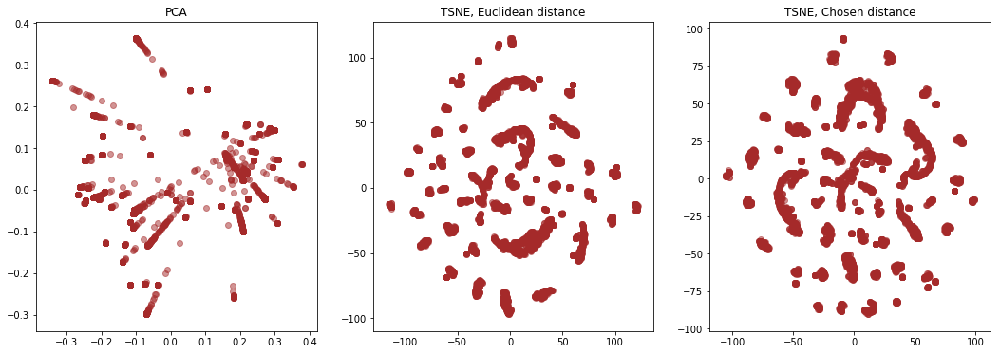

Clustering


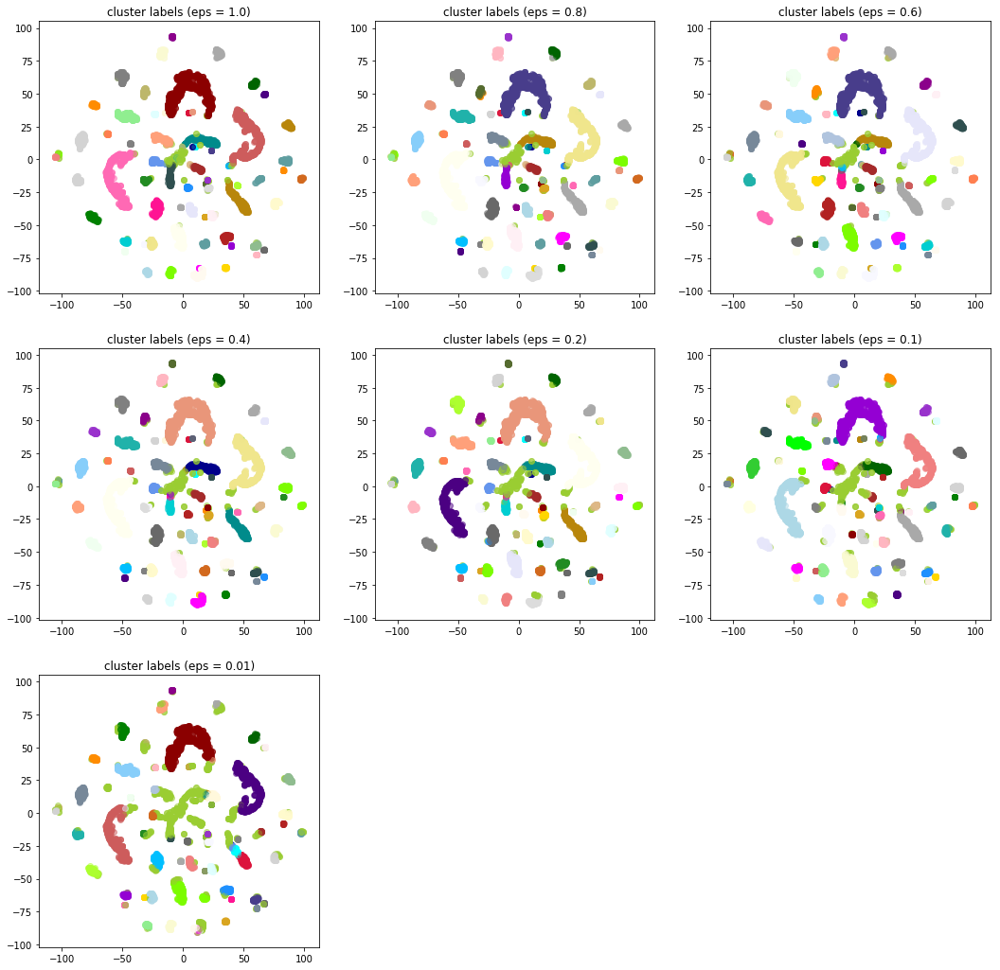

In [27]:
eps_l = [0.1 * i for i in range(10, 0, -2)] + [0.1] + [0.01]
print(eps_l)
spectra_2D = build_images_DBSCAN(spectra, spectrum_columns, spectra_distances, colors, eps_l=eps_l, TSNE_learning_rate=1000, TSNE_n_iter=1500, TSNE_learning_rate2=900)


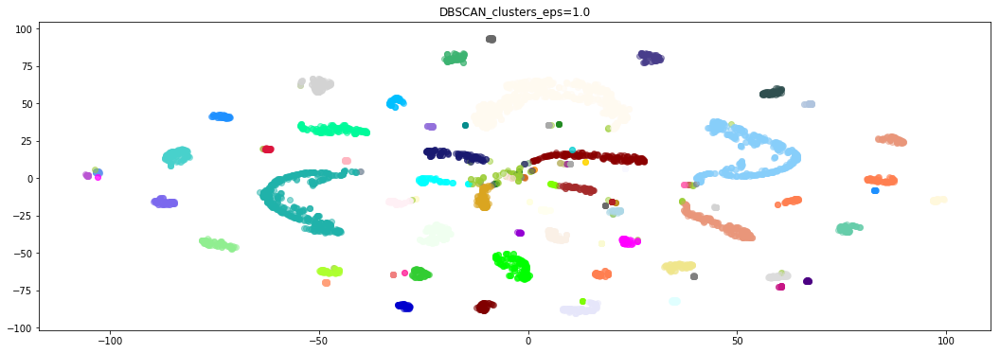

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,DBSCAN_clusters_eps=1.0
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,5
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,33
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,72
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,82


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
4737,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232337.6+584943',b'http://xmm-catalog.irap.omp.eu/source/201375...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
13,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.3+640902',b'http://xmm-catalog.irap.omp.eu/source/200962...
77,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.3+640725',b'http://xmm-catalog.irap.omp.eu/source/200962...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...
29,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002529.4+640631',b'http://xmm-catalog.irap.omp.eu/source/204123...
35,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.3+640634',b'http://xmm-catalog.irap.omp.eu/source/205111...
39,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002533.3+640629',b'http://xmm-catalog.irap.omp.eu/source/203105...
48,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640617',b'http://xmm-catalog.irap.omp.eu/source/204123...
74,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002551.2+640622',b'http://xmm-catalog.irap.omp.eu/source/200962...


4 cluster (#D2691E)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
47,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640556',b'http://xmm-catalog.irap.omp.eu/source/200962...
50,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002536.3+641106',b'http://xmm-catalog.irap.omp.eu/source/203105...
63,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002541.7+641029',b'http://xmm-catalog.irap.omp.eu/source/200962...
69,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002548.4+640922',b'http://xmm-catalog.irap.omp.eu/source/200962...


5 cluster (#FF7F50)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


6 cluster (#6495ED)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
140,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022239.6+430207',b'http://xmm-catalog.irap.omp.eu/source/200029...


7 cluster (#FFF8DC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
154,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023224.2+201413',b'http://xmm-catalog.irap.omp.eu/source/206042...
155,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.5+200908',b'http://xmm-catalog.irap.omp.eu/source/206042...
156,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.7+201053',b'http://xmm-catalog.irap.omp.eu/source/206042...
157,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023229.1+201103',b'http://xmm-catalog.irap.omp.eu/source/206042...
158,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023230.4+201703',b'http://xmm-catalog.irap.omp.eu/source/206042...
159,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023231.1+201600',b'http://xmm-catalog.irap.omp.eu/source/206042...
160,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023233.0+201352',b'http://xmm-catalog.irap.omp.eu/source/206042...
161,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023237.5+202201',b'http://xmm-catalog.irap.omp.eu/source/206042...
162,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023240.2+202304',b'http://xmm-catalog.irap.omp.eu/source/206042...
163,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023243.3+202100',b'http://xmm-catalog.irap.omp.eu/source/206042...


8 cluster (#DC143C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
236,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031611.0+411759',b'http://xmm-catalog.irap.omp.eu/source/201515...
237,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031613.8+411422',b'http://xmm-catalog.irap.omp.eu/source/201515...
238,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031614.1+412536',b'http://xmm-catalog.irap.omp.eu/source/201515...
239,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031617.9+411915',b'http://xmm-catalog.irap.omp.eu/source/201515...
240,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031618.0+411507',b'http://xmm-catalog.irap.omp.eu/source/201515...
241,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.3+412446',b'http://xmm-catalog.irap.omp.eu/source/201515...
242,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.5+411757',b'http://xmm-catalog.irap.omp.eu/source/201515...
243,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.6+411646',b'http://xmm-catalog.irap.omp.eu/source/201515...
244,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031621.8+411714',b'http://xmm-catalog.irap.omp.eu/source/201515...
245,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031631.1+412610',b'http://xmm-catalog.irap.omp.eu/source/201515...


9 cluster (#00FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
266,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.3+412927',b'http://xmm-catalog.irap.omp.eu/source/200851...
267,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.7+413129',b'http://xmm-catalog.irap.omp.eu/source/200851...
268,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.0+412950',b'http://xmm-catalog.irap.omp.eu/source/203057...
269,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.5+413706',b'http://xmm-catalog.irap.omp.eu/source/203057...
270,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.8+412908',b'http://xmm-catalog.irap.omp.eu/source/200851...
271,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.2+412920',b'http://xmm-catalog.irap.omp.eu/source/203057...
272,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.5+413300',b'http://xmm-catalog.irap.omp.eu/source/200851...
273,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031926.8+412838',b'http://xmm-catalog.irap.omp.eu/source/203057...
274,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.3+413549',b'http://xmm-catalog.irap.omp.eu/source/200851...
275,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.4+412819',b'http://xmm-catalog.irap.omp.eu/source/200851...


10 cluster (#00008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
302,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031948.2+413037',b'http://xmm-catalog.irap.omp.eu/source/200851...
965,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.2+694039',b'http://xmm-catalog.irap.omp.eu/source/201122...


11 cluster (#008B8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
332,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032015.2+185052',b'http://xmm-catalog.irap.omp.eu/source/203001...
335,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032016.4+185143',b'http://xmm-catalog.irap.omp.eu/source/203001...
340,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032018.1+184914',b'http://xmm-catalog.irap.omp.eu/source/203001...
341,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.6+184826',b'http://xmm-catalog.irap.omp.eu/source/203001...
342,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.9+185315',b'http://xmm-catalog.irap.omp.eu/source/203001...


12 cluster (#B8860B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
343,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034851.9-115713',b'http://xmm-catalog.irap.omp.eu/source/200943...
344,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034852.2-115600',b'http://xmm-catalog.irap.omp.eu/source/200943...
345,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034919.1-120548',b'http://xmm-catalog.irap.omp.eu/source/200943...


13 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
347,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010625',b'http://xmm-catalog.irap.omp.eu/source/200943...
348,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010030',b'http://xmm-catalog.irap.omp.eu/source/200943...
349,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041631.0+005746',b'http://xmm-catalog.irap.omp.eu/source/201611...
350,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041633.6+010627',b'http://xmm-catalog.irap.omp.eu/source/200943...
351,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041641.5+011100',b'http://xmm-catalog.irap.omp.eu/source/201611...
352,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041644.8+011007',b'http://xmm-catalog.irap.omp.eu/source/200943...
355,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041656.6+005801',b'http://xmm-catalog.irap.omp.eu/source/200943...
356,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041702.2+011139',b'http://xmm-catalog.irap.omp.eu/source/201611...
357,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041711.9+005913',b'http://xmm-catalog.irap.omp.eu/source/201611...
358,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041716.1+010856',b'http://xmm-catalog.irap.omp.eu/source/201611...


14 cluster (#006400)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
354,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041652.4+010523',b'http://xmm-catalog.irap.omp.eu/source/200943...
1764,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113626.5+700927',b'http://xmm-catalog.irap.omp.eu/source/200941...


15 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
361,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052402.0-693136',b'http://xmm-catalog.irap.omp.eu/source/201571...
362,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052407.1-693952',b'http://xmm-catalog.irap.omp.eu/source/201293...
365,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052426.2-693613',b'http://xmm-catalog.irap.omp.eu/source/201251...
368,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052441.9-693432',b'http://xmm-catalog.irap.omp.eu/source/201293...
369,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052442.1-694142',b'http://xmm-catalog.irap.omp.eu/source/206907...
370,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052443.0-693938',b'http://xmm-catalog.irap.omp.eu/source/201375...
371,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052444.0-694058',b'http://xmm-catalog.irap.omp.eu/source/206907...
372,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052449.2-693319',b'http://xmm-catalog.irap.omp.eu/source/201251...
373,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052450.0-693455',b'http://xmm-catalog.irap.omp.eu/source/201293...


16 cluster (#BDB76B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
363,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052414.8-693121',b'http://xmm-catalog.irap.omp.eu/source/202106...
366,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052436.9-694059',b'http://xmm-catalog.irap.omp.eu/source/201375...
374,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052450.8-693633',b'http://xmm-catalog.irap.omp.eu/source/206907...
375,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052454.7-693835',b'http://xmm-catalog.irap.omp.eu/source/204141...


17 cluster (#8B008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
364,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052419.2-693256',b'http://xmm-catalog.irap.omp.eu/source/202106...
367,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052437.8-694249',b'http://xmm-catalog.irap.omp.eu/source/206907...


18 cluster (#556B2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
376,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.5-693824',b'http://xmm-catalog.irap.omp.eu/source/201251...
383,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052459.1-693911',b'http://xmm-catalog.irap.omp.eu/source/201251...


19 cluster (#FF8C00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
377,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.5-693902',b'http://xmm-catalog.irap.omp.eu/source/201573...
380,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052458.0-693909',b'http://xmm-catalog.irap.omp.eu/source/201293...


20 cluster (#9932CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
378,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.7-693846',b'http://xmm-catalog.irap.omp.eu/source/201573...
381,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052458.0-693809',b'http://xmm-catalog.irap.omp.eu/source/201293...


21 cluster (#8B0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
384,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053403.9+215451',b'http://xmm-catalog.irap.omp.eu/source/204125...
385,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
387,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
389,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
391,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
393,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
395,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
397,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
399,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
401,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...


22 cluster (#E9967A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
386,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
388,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
390,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
392,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
394,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
396,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
398,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
400,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
402,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...
404,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...


23 cluster (#8FBC8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
581,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053433.1+220520',b'http://xmm-catalog.irap.omp.eu/source/206111...
591,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053434.8+220238',b'http://xmm-catalog.irap.omp.eu/source/203127...


24 cluster (#483D8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
762,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055010.9-321225',b'http://xmm-catalog.irap.omp.eu/source/201422...
763,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.5-322308',b'http://xmm-catalog.irap.omp.eu/source/201118...
764,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.6-321534',b'http://xmm-catalog.irap.omp.eu/source/201422...
765,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055016.8-321645',b'http://xmm-catalog.irap.omp.eu/source/201422...
766,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055017.4-322200',b'http://xmm-catalog.irap.omp.eu/source/201422...
767,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.0-321242',b'http://xmm-catalog.irap.omp.eu/source/201422...
768,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.4-321550',b'http://xmm-catalog.irap.omp.eu/source/201118...
769,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.1-321441',b'http://xmm-catalog.irap.omp.eu/source/201422...
770,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.6-321114',b'http://xmm-catalog.irap.omp.eu/source/201422...
771,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055020.5-322033',b'http://xmm-catalog.irap.omp.eu/source/201422...


25 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
797,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055039.8-321516',b'http://xmm-catalog.irap.omp.eu/source/201118...
799,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055041.1-321710',b'http://xmm-catalog.irap.omp.eu/source/201422...
805,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055042.9-321640',b'http://xmm-catalog.irap.omp.eu/source/202059...


26 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
834,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175211',b'http://xmm-catalog.irap.omp.eu/source/201111...
835,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175112',b'http://xmm-catalog.irap.omp.eu/source/201111...
836,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.9+174240',b'http://xmm-catalog.irap.omp.eu/source/201111...
837,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063328.2+173953',b'http://xmm-catalog.irap.omp.eu/source/201111...
838,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.0+174839',b'http://xmm-catalog.irap.omp.eu/source/201111...
839,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.1+174916',b'http://xmm-catalog.irap.omp.eu/source/201111...
840,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.8+174134',b'http://xmm-catalog.irap.omp.eu/source/205504...
841,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.2+175301',b'http://xmm-catalog.irap.omp.eu/source/201111...
842,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.9+175034',b'http://xmm-catalog.irap.omp.eu/source/201111...
843,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063332.0+174054',b'http://xmm-catalog.irap.omp.eu/source/201111...


27 cluster (#00CED1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
890,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065043.3+250334',b'http://xmm-catalog.irap.omp.eu/source/200943...
891,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065046.3+250204',b'http://xmm-catalog.irap.omp.eu/source/200943...


28 cluster (#9400D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
893,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072131.2+712625',b'http://xmm-catalog.irap.omp.eu/source/201504...
894,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.2+712516',b'http://xmm-catalog.irap.omp.eu/source/201504...
895,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.7+712725',b'http://xmm-catalog.irap.omp.eu/source/201504...
896,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.3+712105',b'http://xmm-catalog.irap.omp.eu/source/200128...
897,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.6+712248',b'http://xmm-catalog.irap.omp.eu/source/201504...
898,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.8+711800',b'http://xmm-catalog.irap.omp.eu/source/201504...
899,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072146.0+712541',b'http://xmm-catalog.irap.omp.eu/source/201504...
900,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072147.0+712211',b'http://xmm-catalog.irap.omp.eu/source/200128...
901,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072148.5+712601',b'http://xmm-catalog.irap.omp.eu/source/201504...
902,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072149.3+712144',b'http://xmm-catalog.irap.omp.eu/source/200128...


29 cluster (#FF1493)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
911,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083240.5-451222',b'http://xmm-catalog.irap.omp.eu/source/206720...
912,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083241.3-451401',b'http://xmm-catalog.irap.omp.eu/source/206720...


30 cluster (#00BFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
913,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095503.8+694329',b'http://xmm-catalog.irap.omp.eu/source/201122...
914,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.0+693600',b'http://xmm-catalog.irap.omp.eu/source/206578...
915,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.1+694442',b'http://xmm-catalog.irap.omp.eu/source/201122...
916,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.8+693720',b'http://xmm-catalog.irap.omp.eu/source/206578...
917,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095507.1+693701',b'http://xmm-catalog.irap.omp.eu/source/202060...
918,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.1+693549',b'http://xmm-catalog.irap.omp.eu/source/201122...
919,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.9+694330',b'http://xmm-catalog.irap.omp.eu/source/201122...
920,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095510.4+693954',b'http://xmm-catalog.irap.omp.eu/source/201122...
921,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095512.3+694639',b'http://xmm-catalog.irap.omp.eu/source/202060...
922,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095514.8+693613',b'http://xmm-catalog.irap.omp.eu/source/201122...


31 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
977,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095810.3+652720',b'http://xmm-catalog.irap.omp.eu/source/203025...
978,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095814.8+652801',b'http://xmm-catalog.irap.omp.eu/source/203025...
979,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095827.2+653540',b'http://xmm-catalog.irap.omp.eu/source/205024...
980,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095828.3+653424',b'http://xmm-catalog.irap.omp.eu/source/205024...
981,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095833.0+652835',b'http://xmm-catalog.irap.omp.eu/source/205024...
982,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095837.5+653505',b'http://xmm-catalog.irap.omp.eu/source/205024...
983,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095840.4+654057',b'http://xmm-catalog.irap.omp.eu/source/205024...
984,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+653449',b'http://xmm-catalog.irap.omp.eu/source/203025...
985,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+652848',b'http://xmm-catalog.irap.omp.eu/source/203025...
986,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.9+652711',b'http://xmm-catalog.irap.omp.eu/source/205024...


32 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1004,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101441.7+493104',b'http://xmm-catalog.irap.omp.eu/source/202063...
1005,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101451.2+492337',b'http://xmm-catalog.irap.omp.eu/source/202063...
1006,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.1+492522',b'http://xmm-catalog.irap.omp.eu/source/202063...
1007,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.4+493047',b'http://xmm-catalog.irap.omp.eu/source/202063...
1008,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101504.4+492653',b'http://xmm-catalog.irap.omp.eu/source/202063...
1009,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101508.0+493153',b'http://xmm-catalog.irap.omp.eu/source/202063...
1010,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101509.2+492738',b'http://xmm-catalog.irap.omp.eu/source/202063...
1011,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101514.5+493252',b'http://xmm-catalog.irap.omp.eu/source/202063...


33 cluster (#1E90FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1012,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,1,b'3XMM J101826.8-585838',b'http://xmm-catalog.irap.omp.eu/source/206943...
1013,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101827.7-585348',b'http://xmm-catalog.irap.omp.eu/source/206943...
1014,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101828.5-585518',b'http://xmm-catalog.irap.omp.eu/source/206047...
1015,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101831.8-585524',b'http://xmm-catalog.irap.omp.eu/source/206943...
1016,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101832.7-585829',b'http://xmm-catalog.irap.omp.eu/source/206047...
1017,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101835.1-585013',b'http://xmm-catalog.irap.omp.eu/source/206047...
1018,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101835.4-585618',b'http://xmm-catalog.irap.omp.eu/source/206047...
1019,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101835.4-585722',b'http://xmm-catalog.irap.omp.eu/source/206943...
1020,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101836.1-585144',b'http://xmm-catalog.irap.omp.eu/source/206047...
1021,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101837.5-590239',b'http://xmm-catalog.irap.omp.eu/source/206943...


34 cluster (#B22222)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1059,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110306.4-233533',b'http://xmm-catalog.irap.omp.eu/source/202059...
1060,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.1-232754',b'http://xmm-catalog.irap.omp.eu/source/202059...
1061,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.6-233621',b'http://xmm-catalog.irap.omp.eu/source/202059...
1062,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.1-233448',b'http://xmm-catalog.irap.omp.eu/source/202059...
1063,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.4-232239',b'http://xmm-catalog.irap.omp.eu/source/202059...
1064,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110327.9-233631',b'http://xmm-catalog.irap.omp.eu/source/202059...
1066,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110337.5-232223',b'http://xmm-catalog.irap.omp.eu/source/202059...
1068,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110338.4-232257',b'http://xmm-catalog.irap.omp.eu/source/202059...
1069,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110345.0-232220',b'http://xmm-catalog.irap.omp.eu/source/202059...
1070,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110346.7-232359',b'http://xmm-catalog.irap.omp.eu/source/202059...


35 cluster (#FFFAF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1072,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+380539',b'http://xmm-catalog.irap.omp.eu/source/200992...
1073,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+381102',b'http://xmm-catalog.irap.omp.eu/source/201539...
1074,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.3+380832',b'http://xmm-catalog.irap.omp.eu/source/201589...
1075,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.6+380527',b'http://xmm-catalog.irap.omp.eu/source/201365...
1076,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.9+381512',b'http://xmm-catalog.irap.omp.eu/source/206709...
1077,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.1+380536',b'http://xmm-catalog.irap.omp.eu/source/204110...
1078,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.4+381536',b'http://xmm-catalog.irap.omp.eu/source/201589...
1079,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.6+380540',b'http://xmm-catalog.irap.omp.eu/source/201365...
1080,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+381101',b'http://xmm-catalog.irap.omp.eu/source/201539...
1081,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+380547',b'http://xmm-catalog.irap.omp.eu/source/201539...


36 cluster (#228B22)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1762,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.1+700256',b'http://xmm-catalog.irap.omp.eu/source/200941...
1763,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.9+700903',b'http://xmm-catalog.irap.omp.eu/source/200941...
1765,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113627.4+700532',b'http://xmm-catalog.irap.omp.eu/source/200941...
1766,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113628.1+700431',b'http://xmm-catalog.irap.omp.eu/source/200941...
1767,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113631.4+700957',b'http://xmm-catalog.irap.omp.eu/source/200941...
1768,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113640.3+700542',b'http://xmm-catalog.irap.omp.eu/source/200941...


37 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1769,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121755.6+300026',b'http://xmm-catalog.irap.omp.eu/source/201091...
1770,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121819.6+300010',b'http://xmm-catalog.irap.omp.eu/source/201091...


38 cluster (#DCDCDC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1771,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122102.5+281609',b'http://xmm-catalog.irap.omp.eu/source/201048...
1772,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+280805',b'http://xmm-catalog.irap.omp.eu/source/201048...
1773,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+281040',b'http://xmm-catalog.irap.omp.eu/source/201048...
1774,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.4+280846',b'http://xmm-catalog.irap.omp.eu/source/201048...
1775,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.0+281518',b'http://xmm-catalog.irap.omp.eu/source/201048...
1776,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.9+281618',b'http://xmm-catalog.irap.omp.eu/source/201048...
1777,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122108.2+281215',b'http://xmm-catalog.irap.omp.eu/source/201048...
1778,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.5+282103',b'http://xmm-catalog.irap.omp.eu/source/205022...
1779,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.6+280954',b'http://xmm-catalog.irap.omp.eu/source/205022...
1780,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.9+281118',b'http://xmm-catalog.irap.omp.eu/source/201048...


39 cluster (#F8F8FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1783,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122112.6+300637',b'http://xmm-catalog.irap.omp.eu/source/201118...
1785,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.3+300537',b'http://xmm-catalog.irap.omp.eu/source/201118...
1786,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.4+300651',b'http://xmm-catalog.irap.omp.eu/source/201118...
1787,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122115.1+300558',b'http://xmm-catalog.irap.omp.eu/source/201118...
1792,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122118.2+301543',b'http://xmm-catalog.irap.omp.eu/source/201118...
1794,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122120.2+301611',b'http://xmm-catalog.irap.omp.eu/source/201118...
1805,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122127.8+301438',b'http://xmm-catalog.irap.omp.eu/source/201118...
1806,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122128.7+301513',b'http://xmm-catalog.irap.omp.eu/source/201118...
1823,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122144.3+300547',b'http://xmm-catalog.irap.omp.eu/source/201118...
1829,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122148.8+300416',b'http://xmm-catalog.irap.omp.eu/source/201118...


40 cluster (#FFD700)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1791,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122117.1+300951',b'http://xmm-catalog.irap.omp.eu/source/201118...
1800,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122122.7+300932',b'http://xmm-catalog.irap.omp.eu/source/201118...
1801,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122124.2+301118',b'http://xmm-catalog.irap.omp.eu/source/201118...


41 cluster (#DAA520)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1836,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.7+122645',b'http://xmm-catalog.irap.omp.eu/source/201141...
1837,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.8+123115',b'http://xmm-catalog.irap.omp.eu/source/205518...
1838,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.9+122101',b'http://xmm-catalog.irap.omp.eu/source/205518...
1839,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122656',b'http://xmm-catalog.irap.omp.eu/source/202009...
1840,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122819',b'http://xmm-catalog.irap.omp.eu/source/202009...
1841,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122908',b'http://xmm-catalog.irap.omp.eu/source/202009...
1842,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122218',b'http://xmm-catalog.irap.omp.eu/source/205518...
1843,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122507',b'http://xmm-catalog.irap.omp.eu/source/202009...
1844,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.5+121755',b'http://xmm-catalog.irap.omp.eu/source/206032...
1845,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.9+122914',b'http://xmm-catalog.irap.omp.eu/source/201141...


42 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1867,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123039.7+122448',b'http://xmm-catalog.irap.omp.eu/source/201141...
1875,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123043.1+122236',b'http://xmm-catalog.irap.omp.eu/source/202009...
1878,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123044.3+122052',b'http://xmm-catalog.irap.omp.eu/source/201141...
1890,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123049.3+122100',b'http://xmm-catalog.irap.omp.eu/source/202009...
1909,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123059.6+122049',b'http://xmm-catalog.irap.omp.eu/source/202009...
1923,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123104.2+122851',b'http://xmm-catalog.irap.omp.eu/source/201060...


43 cluster (#008000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1893,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123053.1+122413',b'http://xmm-catalog.irap.omp.eu/source/201141...
1894,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123053.7+122034',b'http://xmm-catalog.irap.omp.eu/source/202009...


44 cluster (#ADFF2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1949,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125543.1-054058',b'http://xmm-catalog.irap.omp.eu/source/205560...
1950,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125544.2-055341',b'http://xmm-catalog.irap.omp.eu/source/206516...
1951,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125545.0-055206',b'http://xmm-catalog.irap.omp.eu/source/206516...
1952,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125548.8-054447',b'http://xmm-catalog.irap.omp.eu/source/206516...
1953,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.1-054257',b'http://xmm-catalog.irap.omp.eu/source/205560...
1954,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.5-054829',b'http://xmm-catalog.irap.omp.eu/source/205560...
1955,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.2-055101',b'http://xmm-catalog.irap.omp.eu/source/205560...
1956,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-055359',b'http://xmm-catalog.irap.omp.eu/source/206516...
1957,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-054934',b'http://xmm-catalog.irap.omp.eu/source/205560...
1958,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125553.9-055230',b'http://xmm-catalog.irap.omp.eu/source/206516...


45 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2002,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130234.9-630754',b'http://xmm-catalog.irap.omp.eu/source/203023...
2003,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130242.1-631310',b'http://xmm-catalog.irap.omp.eu/source/203034...
2004,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130244.3-630716',b'http://xmm-catalog.irap.omp.eu/source/203034...
2005,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130245.6-631532',b'http://xmm-catalog.irap.omp.eu/source/203034...
2006,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130246.7-631503',b'http://xmm-catalog.irap.omp.eu/source/203034...
2007,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130247.2-630647',b'http://xmm-catalog.irap.omp.eu/source/203034...
2008,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.1-631353',b'http://xmm-catalog.irap.omp.eu/source/203034...
2009,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.4-631216',b'http://xmm-catalog.irap.omp.eu/source/203023...
2010,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.1-630715',b'http://xmm-catalog.irap.omp.eu/source/203023...
2011,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.4-630832',b'http://xmm-catalog.irap.omp.eu/source/203034...


46 cluster (#F0FFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2017,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132459.9-430841',b'http://xmm-catalog.irap.omp.eu/source/207240...
2018,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132501.0-430643',b'http://xmm-catalog.irap.omp.eu/source/200936...
2019,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132502.7-430243',b'http://xmm-catalog.irap.omp.eu/source/200936...
2020,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132503.1-425623',b'http://xmm-catalog.irap.omp.eu/source/200936...
2021,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.5-430407',b'http://xmm-catalog.irap.omp.eu/source/200936...
2022,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.6-430426',b'http://xmm-catalog.irap.omp.eu/source/200936...
2023,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.8-430436',b'http://xmm-catalog.irap.omp.eu/source/200936...
2024,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.0-430133',b'http://xmm-catalog.irap.omp.eu/source/200936...
2025,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.7-430433',b'http://xmm-catalog.irap.omp.eu/source/207240...
2026,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.8-425539',b'http://xmm-catalog.irap.omp.eu/source/207240...


47 cluster (#FF69B4)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2074,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132524.4-430047',b'http://xmm-catalog.irap.omp.eu/source/200936...
2075,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132524.8-425948',b'http://xmm-catalog.irap.omp.eu/source/207240...
2079,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.2-430146',b'http://xmm-catalog.irap.omp.eu/source/200936...
2103,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.4-430025',b'http://xmm-catalog.irap.omp.eu/source/207240...
2104,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.7-430021',b'http://xmm-catalog.irap.omp.eu/source/207240...


48 cluster (#CD5C5C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2077,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132525.9-430129',b'http://xmm-catalog.irap.omp.eu/source/200936...
2081,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.4-430005',b'http://xmm-catalog.irap.omp.eu/source/207240...
2082,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.4-430202',b'http://xmm-catalog.irap.omp.eu/source/207240...
2096,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132531.2-430039',b'http://xmm-catalog.irap.omp.eu/source/207240...


49 cluster (#4B0082)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2148,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135611.5-642817',b'http://xmm-catalog.irap.omp.eu/source/206032...
2149,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.1-642434',b'http://xmm-catalog.irap.omp.eu/source/206032...
2150,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.5-642656',b'http://xmm-catalog.irap.omp.eu/source/206032...
2151,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135615.6-642325',b'http://xmm-catalog.irap.omp.eu/source/206032...
2152,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135619.8-642501',b'http://xmm-catalog.irap.omp.eu/source/203069...
2153,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.0-643226',b'http://xmm-catalog.irap.omp.eu/source/206032...
2154,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.6-642949',b'http://xmm-catalog.irap.omp.eu/source/206032...
2155,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135624.4-643101',b'http://xmm-catalog.irap.omp.eu/source/206032...
2156,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135628.7-642250',b'http://xmm-catalog.irap.omp.eu/source/203069...
2157,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135642.1-642400',b'http://xmm-catalog.irap.omp.eu/source/203069...


50 cluster (#FFFFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2165,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141813.4-610150',b'http://xmm-catalog.irap.omp.eu/source/205557...
2166,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141815.0-605943',b'http://xmm-catalog.irap.omp.eu/source/205557...
2167,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141825.9-610019',b'http://xmm-catalog.irap.omp.eu/source/205557...
2168,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141826.7-605355',b'http://xmm-catalog.irap.omp.eu/source/205557...
2169,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605924',b'http://xmm-catalog.irap.omp.eu/source/201511...
2170,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605117',b'http://xmm-catalog.irap.omp.eu/source/205557...
2171,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141829.2-605849',b'http://xmm-catalog.irap.omp.eu/source/205557...
2172,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141831.7-605824',b'http://xmm-catalog.irap.omp.eu/source/201511...
2173,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141836.8-605907',b'http://xmm-catalog.irap.omp.eu/source/205557...
2174,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141837.8-605252',b'http://xmm-catalog.irap.omp.eu/source/205557...


51 cluster (#F0E68C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2198,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142807.6+423631',b'http://xmm-catalog.irap.omp.eu/source/201118...
2199,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142808.0+424155',b'http://xmm-catalog.irap.omp.eu/source/201118...
2200,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142809.6+423329',b'http://xmm-catalog.irap.omp.eu/source/201118...
2201,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142811.5+424628',b'http://xmm-catalog.irap.omp.eu/source/201657...
2202,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142812.7+423726',b'http://xmm-catalog.irap.omp.eu/source/201118...
2203,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142813.4+423756',b'http://xmm-catalog.irap.omp.eu/source/201118...
2204,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142814.4+424055',b'http://xmm-catalog.irap.omp.eu/source/201118...
2205,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142815.4+424701',b'http://xmm-catalog.irap.omp.eu/source/203101...
2206,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142816.0+423604',b'http://xmm-catalog.irap.omp.eu/source/201118...
2207,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142818.2+424658',b'http://xmm-catalog.irap.omp.eu/source/201657...


52 cluster (#E6E6FA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2285,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.0-590238',b'http://xmm-catalog.irap.omp.eu/source/203125...
2286,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.2-590213',b'http://xmm-catalog.irap.omp.eu/source/202070...
2287,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.3-590738',b'http://xmm-catalog.irap.omp.eu/source/202070...
2288,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.6-590230',b'http://xmm-catalog.irap.omp.eu/source/201281...
2289,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.9-590423',b'http://xmm-catalog.irap.omp.eu/source/203027...
2290,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151328.1-590747',b'http://xmm-catalog.irap.omp.eu/source/202070...
2291,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151329.2-590308',b'http://xmm-catalog.irap.omp.eu/source/203027...
2292,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.2-590358',b'http://xmm-catalog.irap.omp.eu/source/202070...
2293,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.9-590805',b'http://xmm-catalog.irap.omp.eu/source/202070...
2294,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151332.4-590123',b'http://xmm-catalog.irap.omp.eu/source/201281...


53 cluster (#FFF0F5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2302,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151335.7-591601',b'http://xmm-catalog.irap.omp.eu/source/201281...
2304,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151336.0-591303',b'http://xmm-catalog.irap.omp.eu/source/203125...
2305,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151337.2-591550',b'http://xmm-catalog.irap.omp.eu/source/203027...
2312,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.3-590838',b'http://xmm-catalog.irap.omp.eu/source/203027...
2314,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.5-590854',b'http://xmm-catalog.irap.omp.eu/source/202070...
2317,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.0-591143',b'http://xmm-catalog.irap.omp.eu/source/202070...
2320,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.7-590917',b'http://xmm-catalog.irap.omp.eu/source/203027...
2321,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.4-591543',b'http://xmm-catalog.irap.omp.eu/source/201281...
2323,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.8-591317',b'http://xmm-catalog.irap.omp.eu/source/203125...
2325,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.9-590935',b'http://xmm-catalog.irap.omp.eu/source/203027...


54 cluster (#7CFC00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2351,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151352.6-590821',b'http://xmm-catalog.irap.omp.eu/source/202070...
2360,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151355.6-590808',b'http://xmm-catalog.irap.omp.eu/source/202070...
2361,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...
2369,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151357.2-590735',b'http://xmm-catalog.irap.omp.eu/source/203027...
2394,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151401.6-590950',b'http://xmm-catalog.irap.omp.eu/source/202070...


55 cluster (#FFFACD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2352,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151352.6-590821',b'http://xmm-catalog.irap.omp.eu/source/202070...
2362,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...
2395,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151401.6-590950',b'http://xmm-catalog.irap.omp.eu/source/202070...


56 cluster (#ADD8E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2427,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.2+110501',b'http://xmm-catalog.irap.omp.eu/source/206569...
2428,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.7+110858',b'http://xmm-catalog.irap.omp.eu/source/200943...
2429,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.2+111432',b'http://xmm-catalog.irap.omp.eu/source/207277...
2430,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.4+111037',b'http://xmm-catalog.irap.omp.eu/source/200943...
2431,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.8+111609',b'http://xmm-catalog.irap.omp.eu/source/206569...
2432,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155519.1+111344',b'http://xmm-catalog.irap.omp.eu/source/200943...
2433,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155520.7+111756',b'http://xmm-catalog.irap.omp.eu/source/207277...
2434,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155521.2+111359',b'http://xmm-catalog.irap.omp.eu/source/207277...
2435,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155522.3+111804',b'http://xmm-catalog.irap.omp.eu/source/206569...
2436,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155523.4+111429',b'http://xmm-catalog.irap.omp.eu/source/207277...


57 cluster (#F08080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2466,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161606.4-505431',b'http://xmm-catalog.irap.omp.eu/source/201130...
2467,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161612.9-510027',b'http://xmm-catalog.irap.omp.eu/source/203023...
2468,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161617.2-505800',b'http://xmm-catalog.irap.omp.eu/source/203023...
2469,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161623.0-510045',b'http://xmm-catalog.irap.omp.eu/source/203023...
2470,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161628.1-505753',b'http://xmm-catalog.irap.omp.eu/source/203023...
2471,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161631.0-505750',b'http://xmm-catalog.irap.omp.eu/source/203023...
2472,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161634.4-510128',b'http://xmm-catalog.irap.omp.eu/source/203023...
2473,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.2-505238',b'http://xmm-catalog.irap.omp.eu/source/203023...
2474,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.4-505406',b'http://xmm-catalog.irap.omp.eu/source/201130...
2475,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161641.4-505514',b'http://xmm-catalog.irap.omp.eu/source/201130...


58 cluster (#E0FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2476,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162551.4-491717',b'http://xmm-catalog.irap.omp.eu/source/207419...
2477,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162553.1-490602',b'http://xmm-catalog.irap.omp.eu/source/207419...
2478,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162555.5-491256',b'http://xmm-catalog.irap.omp.eu/source/204032...
2479,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162556.8-490603',b'http://xmm-catalog.irap.omp.eu/source/204032...
2480,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162559.9-491150',b'http://xmm-catalog.irap.omp.eu/source/207419...
2481,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162601.8-491411',b'http://xmm-catalog.irap.omp.eu/source/204032...
2482,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162603.3-491034',b'http://xmm-catalog.irap.omp.eu/source/204032...
2483,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162604.1-491231',b'http://xmm-catalog.irap.omp.eu/source/207419...
2484,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162605.5-490902',b'http://xmm-catalog.irap.omp.eu/source/204032...
2485,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162608.7-491743',b'http://xmm-catalog.irap.omp.eu/source/204032...


59 cluster (#FAFAD2)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2505,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164000.3-463917',b'http://xmm-catalog.irap.omp.eu/source/203025...
2506,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164002.4-463200',b'http://xmm-catalog.irap.omp.eu/source/202063...
2507,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164004.1-463502',b'http://xmm-catalog.irap.omp.eu/source/202063...
2508,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164006.7-462914',b'http://xmm-catalog.irap.omp.eu/source/203025...
2509,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164012.7-463903',b'http://xmm-catalog.irap.omp.eu/source/202063...
2510,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164016.5-463631',b'http://xmm-catalog.irap.omp.eu/source/203025...
2511,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164017.7-464132',b'http://xmm-catalog.irap.omp.eu/source/202063...
2512,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164022.3-462838',b'http://xmm-catalog.irap.omp.eu/source/203025...
2513,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164035.9-463020',b'http://xmm-catalog.irap.omp.eu/source/203025...
2514,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164042.4-463154',b'http://xmm-catalog.irap.omp.eu/source/203025...


60 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2518,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165326.3+394547',b'http://xmm-catalog.irap.omp.eu/source/206525...
2519,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.2+394531',b'http://xmm-catalog.irap.omp.eu/source/206525...
2520,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.9+394708',b'http://xmm-catalog.irap.omp.eu/source/206525...
2521,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.3+394726',b'http://xmm-catalog.irap.omp.eu/source/206525...
2522,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.4+395120',b'http://xmm-catalog.irap.omp.eu/source/206525...
2523,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165330.0+394535',b'http://xmm-catalog.irap.omp.eu/source/206525...
2524,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.8+394608',b'http://xmm-catalog.irap.omp.eu/source/201130...
2525,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.9+394654',b'http://xmm-catalog.irap.omp.eu/source/206525...
2526,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165332.0+394238',b'http://xmm-catalog.irap.omp.eu/source/201130...
2527,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165333.6+394244',b'http://xmm-catalog.irap.omp.eu/source/201130...


61 cluster (#90EE90)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2614,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171305.7-394319',b'http://xmm-catalog.irap.omp.eu/source/207408...
2615,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171306.8-395047',b'http://xmm-catalog.irap.omp.eu/source/207408...
2616,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171307.7-393944',b'http://xmm-catalog.irap.omp.eu/source/207221...
2617,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.1-395025',b'http://xmm-catalog.irap.omp.eu/source/200936...
2618,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394252',b'http://xmm-catalog.irap.omp.eu/source/207221...
2619,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394536',b'http://xmm-catalog.irap.omp.eu/source/207408...
2620,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.2-394826',b'http://xmm-catalog.irap.omp.eu/source/207408...
2621,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.5-394422',b'http://xmm-catalog.irap.omp.eu/source/207408...
2622,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.9-394237',b'http://xmm-catalog.irap.omp.eu/source/207221...
2623,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171311.0-394524',b'http://xmm-catalog.irap.omp.eu/source/207408...


62 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2693,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171411.2-383255',b'http://xmm-catalog.irap.omp.eu/source/203065...
2694,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171415.2-383024',b'http://xmm-catalog.irap.omp.eu/source/203065...
2695,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171420.3-383023',b'http://xmm-catalog.irap.omp.eu/source/203065...
2696,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171428.5-383600',b'http://xmm-catalog.irap.omp.eu/source/203065...
2697,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171430.9-382838',b'http://xmm-catalog.irap.omp.eu/source/203065...
2698,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171434.5-383311',b'http://xmm-catalog.irap.omp.eu/source/203065...
2699,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171435.5-382912',b'http://xmm-catalog.irap.omp.eu/source/203065...
2700,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171441.0-382854',b'http://xmm-catalog.irap.omp.eu/source/203065...
2701,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171443.3-383343',b'http://xmm-catalog.irap.omp.eu/source/203065...
2702,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171444.2-383147',b'http://xmm-catalog.irap.omp.eu/source/203065...


63 cluster (#FFB6C1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2708,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171743.6-382226',b'http://xmm-catalog.irap.omp.eu/source/204019...
2709,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171750.9-383158',b'http://xmm-catalog.irap.omp.eu/source/204019...
2710,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171754.5-383132',b'http://xmm-catalog.irap.omp.eu/source/204019...
2711,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.4-382449',b'http://xmm-catalog.irap.omp.eu/source/204019...
2712,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.9-383141',b'http://xmm-catalog.irap.omp.eu/source/204019...
2713,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171807.0-382200',b'http://xmm-catalog.irap.omp.eu/source/204019...
2714,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171808.7-382604',b'http://xmm-catalog.irap.omp.eu/source/204019...
2715,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171811.9-381952',b'http://xmm-catalog.irap.omp.eu/source/204019...
2716,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171812.6-382252',b'http://xmm-catalog.irap.omp.eu/source/204019...
2717,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171813.6-382516',b'http://xmm-catalog.irap.omp.eu/source/204019...


64 cluster (#FFA07A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2728,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174443.3-301254',b'http://xmm-catalog.irap.omp.eu/source/204065...
2729,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174449.8-301758',b'http://xmm-catalog.irap.omp.eu/source/204065...
2732,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174453.9-300918',b'http://xmm-catalog.irap.omp.eu/source/204065...
2761,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.3-301744',b'http://xmm-catalog.irap.omp.eu/source/204065...
2762,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.4-300658',b'http://xmm-catalog.irap.omp.eu/source/204003...
2765,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.6-300937',b'http://xmm-catalog.irap.omp.eu/source/204065...
2768,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174459.3-300609',b'http://xmm-catalog.irap.omp.eu/source/204065...
2779,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174501.3-301157',b'http://xmm-catalog.irap.omp.eu/source/207483...
2789,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174502.4-301109',b'http://xmm-catalog.irap.omp.eu/source/204003...
2796,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174503.7-300843',b'http://xmm-catalog.irap.omp.eu/source/204065...


65 cluster (#20B2AA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2730,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.7-290659',b'http://xmm-catalog.irap.omp.eu/source/202026...
2731,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.8-290059',b'http://xmm-catalog.irap.omp.eu/source/206043...
2733,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.0-285926',b'http://xmm-catalog.irap.omp.eu/source/207242...
2734,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-285842',b'http://xmm-catalog.irap.omp.eu/source/201129...
2735,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-290112',b'http://xmm-catalog.irap.omp.eu/source/201113...
2736,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-285954',b'http://xmm-catalog.irap.omp.eu/source/205056...
2737,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-290552',b'http://xmm-catalog.irap.omp.eu/source/204024...
2738,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.1-291054',b'http://xmm-catalog.irap.omp.eu/source/204024...
2739,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-285752',b'http://xmm-catalog.irap.omp.eu/source/206946...
2740,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-290417',b'http://xmm-catalog.irap.omp.eu/source/201113...


66 cluster (#87CEFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2849,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.1-290404',b'http://xmm-catalog.irap.omp.eu/source/202026...
2852,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285706',b'http://xmm-catalog.irap.omp.eu/source/207436...
2854,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285742',b'http://xmm-catalog.irap.omp.eu/source/202026...
2856,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-290145',b'http://xmm-catalog.irap.omp.eu/source/202026...
2858,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.0-290223',b'http://xmm-catalog.irap.omp.eu/source/202026...
2860,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.6-290347',b'http://xmm-catalog.irap.omp.eu/source/202026...
2863,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.8-285935',b'http://xmm-catalog.irap.omp.eu/source/202026...
2865,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.9-285844',b'http://xmm-catalog.irap.omp.eu/source/201113...
2868,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.0-290229',b'http://xmm-catalog.irap.omp.eu/source/201113...
2869,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.1-285623',b'http://xmm-catalog.irap.omp.eu/source/201129...


67 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3303,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174540.0-290033',b'http://xmm-catalog.irap.omp.eu/source/204024...
3308,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174540.3-290101',b'http://xmm-catalog.irap.omp.eu/source/207901...


68 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3304,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174540.0-290033',b'http://xmm-catalog.irap.omp.eu/source/204024...
3309,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174540.3-290101',b'http://xmm-catalog.irap.omp.eu/source/207901...


69 cluster (#B0C4DE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3620,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174734.6-244557',b'http://xmm-catalog.irap.omp.eu/source/207441...
3621,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174735.3-244822',b'http://xmm-catalog.irap.omp.eu/source/207441...
3622,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174737.6-244858',b'http://xmm-catalog.irap.omp.eu/source/207441...
3623,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174740.0-245118',b'http://xmm-catalog.irap.omp.eu/source/207441...
3624,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174740.4-244809',b'http://xmm-catalog.irap.omp.eu/source/207441...
3625,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174744.0-244045',b'http://xmm-catalog.irap.omp.eu/source/207441...
3626,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174745.3-244114',b'http://xmm-catalog.irap.omp.eu/source/207441...
3627,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174753.3-244052',b'http://xmm-catalog.irap.omp.eu/source/207441...
3629,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174759.8-245323',b'http://xmm-catalog.irap.omp.eu/source/207441...
3630,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174800.3-244035',b'http://xmm-catalog.irap.omp.eu/source/207441...


70 cluster (#FFFFE0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3633,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174802.3-244844',b'http://xmm-catalog.irap.omp.eu/source/207441...
3636,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174809.5-244420',b'http://xmm-catalog.irap.omp.eu/source/207441...
3640,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174810.4-244758',b'http://xmm-catalog.irap.omp.eu/source/207441...


71 cluster (#00FF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3652,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.4-240519',b'http://xmm-catalog.irap.omp.eu/source/205038...
3653,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-235843',b'http://xmm-catalog.irap.omp.eu/source/205038...
3654,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-240651',b'http://xmm-catalog.irap.omp.eu/source/205038...
3655,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.0-240912',b'http://xmm-catalog.irap.omp.eu/source/205038...
3656,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.2-240808',b'http://xmm-catalog.irap.omp.eu/source/205038...
3657,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.3-240514',b'http://xmm-catalog.irap.omp.eu/source/205038...
3658,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.5-240622',b'http://xmm-catalog.irap.omp.eu/source/205038...
3659,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.0-240734',b'http://xmm-catalog.irap.omp.eu/source/205038...
3660,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240903',b'http://xmm-catalog.irap.omp.eu/source/205038...
3661,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240839',b'http://xmm-catalog.irap.omp.eu/source/205038...


72 cluster (#32CD32)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3869,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,1,b'3XMM J182549.2-145024',b'http://xmm-catalog.irap.omp.eu/source/202029...
3870,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182550.5-145022',b'http://xmm-catalog.irap.omp.eu/source/201511...
3871,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.1-145125',b'http://xmm-catalog.irap.omp.eu/source/207429...
3872,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.3-145318',b'http://xmm-catalog.irap.omp.eu/source/202029...
3873,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182553.4-144946',b'http://xmm-catalog.irap.omp.eu/source/207429...
3874,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182555.9-144701',b'http://xmm-catalog.irap.omp.eu/source/205055...
3875,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.4-144544',b'http://xmm-catalog.irap.omp.eu/source/207429...
3876,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.7-144912',b'http://xmm-catalog.irap.omp.eu/source/205055...
3877,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.5-145410',b'http://xmm-catalog.irap.omp.eu/source/207429...
3878,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.8-145253',b'http://xmm-catalog.irap.omp.eu/source/207429...


73 cluster (#FAF0E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3931,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084810',b'http://xmm-catalog.irap.omp.eu/source/207232...
3932,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084639',b'http://xmm-catalog.irap.omp.eu/source/207232...
3933,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084609',b'http://xmm-catalog.irap.omp.eu/source/207232...
3934,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.2-084725',b'http://xmm-catalog.irap.omp.eu/source/207232...
3935,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183403.8-084700',b'http://xmm-catalog.irap.omp.eu/source/207430...
3936,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183405.9-084159',b'http://xmm-catalog.irap.omp.eu/source/207232...
3937,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183411.1-084530',b'http://xmm-catalog.irap.omp.eu/source/207232...
3938,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183412.0-083704',b'http://xmm-catalog.irap.omp.eu/source/207430...
3939,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183414.6-083501',b'http://xmm-catalog.irap.omp.eu/source/203025...
3940,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183416.0-084737',b'http://xmm-catalog.irap.omp.eu/source/207430...


74 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4002,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184026.7-053800',b'http://xmm-catalog.irap.omp.eu/source/206048...
4003,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184027.3-053631',b'http://xmm-catalog.irap.omp.eu/source/206048...
4004,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053938',b'http://xmm-catalog.irap.omp.eu/source/206048...
4005,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053016',b'http://xmm-catalog.irap.omp.eu/source/206048...
4006,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.4-053831',b'http://xmm-catalog.irap.omp.eu/source/206900...
4007,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.9-052946',b'http://xmm-catalog.irap.omp.eu/source/206048...
4008,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.0-053833',b'http://xmm-catalog.irap.omp.eu/source/206048...
4009,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.2-053959',b'http://xmm-catalog.irap.omp.eu/source/206900...
4010,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.5-053918',b'http://xmm-catalog.irap.omp.eu/source/206048...
4011,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184032.5-053453',b'http://xmm-catalog.irap.omp.eu/source/206048...


75 cluster (#800000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4054,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184801.9-014626',b'http://xmm-catalog.irap.omp.eu/source/206929...
4055,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184803.2-014330',b'http://xmm-catalog.irap.omp.eu/source/206929...
4056,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184805.2-013727',b'http://xmm-catalog.irap.omp.eu/source/202070...
4057,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184807.0-013454',b'http://xmm-catalog.irap.omp.eu/source/206929...
4058,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184808.5-014306',b'http://xmm-catalog.irap.omp.eu/source/206929...
4059,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.3-014616',b'http://xmm-catalog.irap.omp.eu/source/206929...
4060,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.6-013801',b'http://xmm-catalog.irap.omp.eu/source/206929...
4061,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184810.1-014708',b'http://xmm-catalog.irap.omp.eu/source/206929...
4062,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-013456',b'http://xmm-catalog.irap.omp.eu/source/202039...
4063,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-014424',b'http://xmm-catalog.irap.omp.eu/source/202038...


76 cluster (#66CDAA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4109,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191029.9+090246',b'http://xmm-catalog.irap.omp.eu/source/207242...
4110,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.4+090237',b'http://xmm-catalog.irap.omp.eu/source/207242...
4111,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090029',b'http://xmm-catalog.irap.omp.eu/source/207242...
4112,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090832',b'http://xmm-catalog.irap.omp.eu/source/207242...
4113,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090434',b'http://xmm-catalog.irap.omp.eu/source/200841...
4114,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191031.9+090039',b'http://xmm-catalog.irap.omp.eu/source/207242...
4115,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.0+090518',b'http://xmm-catalog.irap.omp.eu/source/207242...
4116,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.1+090143',b'http://xmm-catalog.irap.omp.eu/source/207242...
4117,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.4+090427',b'http://xmm-catalog.irap.omp.eu/source/207242...
4118,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191033.0+090309',b'http://xmm-catalog.irap.omp.eu/source/207242...


77 cluster (#0000CD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4170,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192249.3+140821',b'http://xmm-catalog.irap.omp.eu/source/205546...
4171,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192250.8+141126',b'http://xmm-catalog.irap.omp.eu/source/205546...
4172,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.5+140155',b'http://xmm-catalog.irap.omp.eu/source/205546...
4173,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.7+140901',b'http://xmm-catalog.irap.omp.eu/source/205546...
4174,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192259.8+141346',b'http://xmm-catalog.irap.omp.eu/source/205546...
4175,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.0+140154',b'http://xmm-catalog.irap.omp.eu/source/205546...
4176,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.7+141147',b'http://xmm-catalog.irap.omp.eu/source/205546...
4177,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192303.6+140900',b'http://xmm-catalog.irap.omp.eu/source/205546...
4178,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192304.7+140807',b'http://xmm-catalog.irap.omp.eu/source/205546...
4179,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192305.3+141401',b'http://xmm-catalog.irap.omp.eu/source/205546...


78 cluster (#BA55D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4214,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200045.9+435435',b'http://xmm-catalog.irap.omp.eu/source/206531...
4215,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200051.8+435349',b'http://xmm-catalog.irap.omp.eu/source/206531...
4216,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200102.3+434729',b'http://xmm-catalog.irap.omp.eu/source/206531...
4217,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200103.7+434835',b'http://xmm-catalog.irap.omp.eu/source/206531...
4218,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200106.7+434726',b'http://xmm-catalog.irap.omp.eu/source/206531...
4219,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200112.8+435253',b'http://xmm-catalog.irap.omp.eu/source/206531...
4220,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.0+434922',b'http://xmm-catalog.irap.omp.eu/source/206531...
4221,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.5+435333',b'http://xmm-catalog.irap.omp.eu/source/206531...
4222,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200115.2+435206',b'http://xmm-catalog.irap.omp.eu/source/206531...
4223,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+435525',b'http://xmm-catalog.irap.omp.eu/source/206531...


79 cluster (#9370DB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4230,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200859.1-484309',b'http://xmm-catalog.irap.omp.eu/source/202059...
4231,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200905.7-484326',b'http://xmm-catalog.irap.omp.eu/source/203040...
4232,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200911.3-484439',b'http://xmm-catalog.irap.omp.eu/source/203040...
4233,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200914.6-484359',b'http://xmm-catalog.irap.omp.eu/source/202059...
4234,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200915.8-485007',b'http://xmm-catalog.irap.omp.eu/source/203040...
4235,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.6-485002',b'http://xmm-catalog.irap.omp.eu/source/203040...
4236,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.7-485142',b'http://xmm-catalog.irap.omp.eu/source/203040...
4237,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200919.8-484738',b'http://xmm-catalog.irap.omp.eu/source/203040...
4238,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-485007',b'http://xmm-catalog.irap.omp.eu/source/202059...
4239,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-484754',b'http://xmm-catalog.irap.omp.eu/source/203040...


80 cluster (#3CB371)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4253,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.5+371244',b'http://xmm-catalog.irap.omp.eu/source/207446...
4254,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.6+370353',b'http://xmm-catalog.irap.omp.eu/source/207446...
4255,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201510.4+370832',b'http://xmm-catalog.irap.omp.eu/source/207446...
4256,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201511.3+371202',b'http://xmm-catalog.irap.omp.eu/source/207446...
4257,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201512.2+370328',b'http://xmm-catalog.irap.omp.eu/source/207446...
4258,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.4+371400',b'http://xmm-catalog.irap.omp.eu/source/207446...
4259,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.7+371146',b'http://xmm-catalog.irap.omp.eu/source/207446...
4260,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201517.9+370916',b'http://xmm-catalog.irap.omp.eu/source/207446...
4261,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201518.3+371246',b'http://xmm-catalog.irap.omp.eu/source/207446...
4262,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201520.6+370308',b'http://xmm-catalog.irap.omp.eu/source/207446...


81 cluster (#7B68EE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4319,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202038.6+365036',b'http://xmm-catalog.irap.omp.eu/source/204045...
4320,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202042.5+365021',b'http://xmm-catalog.irap.omp.eu/source/204045...
4321,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.0+364932',b'http://xmm-catalog.irap.omp.eu/source/204045...
4322,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.5+364727',b'http://xmm-catalog.irap.omp.eu/source/206740...
4323,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.1+365708',b'http://xmm-catalog.irap.omp.eu/source/204045...
4324,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.4+365154',b'http://xmm-catalog.irap.omp.eu/source/206740...
4325,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.7+365734',b'http://xmm-catalog.irap.omp.eu/source/204045...
4326,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.9+365204',b'http://xmm-catalog.irap.omp.eu/source/204045...
4327,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202048.6+365603',b'http://xmm-catalog.irap.omp.eu/source/206740...
4328,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202049.1+365750',b'http://xmm-catalog.irap.omp.eu/source/206740...


82 cluster (#00FA9A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4378,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,1,b'3XMM J203145.8+412815',b'http://xmm-catalog.irap.omp.eu/source/203055...
4379,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.1+413121',b'http://xmm-catalog.irap.omp.eu/source/203055...
4380,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4381,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.0+412930',b'http://xmm-catalog.irap.omp.eu/source/203055...
4382,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.1+412510',b'http://xmm-catalog.irap.omp.eu/source/203055...
4383,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4384,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.7+412747',b'http://xmm-catalog.irap.omp.eu/source/203055...
4385,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.1+412422',b'http://xmm-catalog.irap.omp.eu/source/203055...
4386,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.5+412515',b'http://xmm-catalog.irap.omp.eu/source/207403...
4387,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203149.0+412825',b'http://xmm-catalog.irap.omp.eu/source/203055...


83 cluster (#48D1CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4518,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.0-301651',b'http://xmm-catalog.irap.omp.eu/source/201249...
4519,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.2-300725',b'http://xmm-catalog.irap.omp.eu/source/204117...
4520,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.3-301614',b'http://xmm-catalog.irap.omp.eu/source/204117...
4521,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.7-301523',b'http://xmm-catalog.irap.omp.eu/source/200809...
4522,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.2-301357',b'http://xmm-catalog.irap.omp.eu/source/201589...
4523,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.3-300725',b'http://xmm-catalog.irap.omp.eu/source/200809...
4524,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.9-300626',b'http://xmm-catalog.irap.omp.eu/source/201249...
4525,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215827.0-300814',b'http://xmm-catalog.irap.omp.eu/source/201249...
4526,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.2-301635',b'http://xmm-catalog.irap.omp.eu/source/200809...
4527,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.3-301447',b'http://xmm-catalog.irap.omp.eu/source/201249...


84 cluster (#C71585)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4622,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.5+422150',b'http://xmm-catalog.irap.omp.eu/source/205043...
4623,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.8+422227',b'http://xmm-catalog.irap.omp.eu/source/205016...
4624,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220226.4+421105',b'http://xmm-catalog.irap.omp.eu/source/205016...
4625,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220233.2+422218',b'http://xmm-catalog.irap.omp.eu/source/205043...
4626,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220236.4+422217',b'http://xmm-catalog.irap.omp.eu/source/205043...
4627,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220238.3+422408',b'http://xmm-catalog.irap.omp.eu/source/205016...
4628,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220242.8+421700',b'http://xmm-catalog.irap.omp.eu/source/205016...
4629,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220243.2+421640',b'http://xmm-catalog.irap.omp.eu/source/205016...
4630,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.0+421103',b'http://xmm-catalog.irap.omp.eu/source/205016...
4631,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.9+422259',b'http://xmm-catalog.irap.omp.eu/source/205043...


85 cluster (#191970)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4638,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232300.9+584624',b'http://xmm-catalog.irap.omp.eu/source/200976...
4639,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.1+585544',b'http://xmm-catalog.irap.omp.eu/source/206504...
4640,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.6+585526',b'http://xmm-catalog.irap.omp.eu/source/201100...
4641,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232302.3+585319',b'http://xmm-catalog.irap.omp.eu/source/206504...
4642,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232303.1+584210',b'http://xmm-catalog.irap.omp.eu/source/204121...
4643,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232304.3+585345',b'http://xmm-catalog.irap.omp.eu/source/206504...
4644,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.2+584740',b'http://xmm-catalog.irap.omp.eu/source/200976...
4645,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.3+585257',b'http://xmm-catalog.irap.omp.eu/source/201100...
4646,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.7+584625',b'http://xmm-catalog.irap.omp.eu/source/200976...
4647,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232307.0+585506',b'http://xmm-catalog.irap.omp.eu/source/201100...


86 cluster (#F5FFFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4657,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232312.2+584906',b'http://xmm-catalog.irap.omp.eu/source/201100...
4668,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232314.5+584938',b'http://xmm-catalog.irap.omp.eu/source/201100...
4674,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232315.6+584941',b'http://xmm-catalog.irap.omp.eu/source/200976...


87 cluster (#FFE4E1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4660,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232312.8+584828',b'http://xmm-catalog.irap.omp.eu/source/200976...
4675,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232315.9+584923',b'http://xmm-catalog.irap.omp.eu/source/201100...
4692,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232321.7+584757',b'http://xmm-catalog.irap.omp.eu/source/206504...
4697,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232323.2+585014',b'http://xmm-catalog.irap.omp.eu/source/201100...
4700,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232324.1+584952',b'http://xmm-catalog.irap.omp.eu/source/206504...
4701,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232324.2+585017',b'http://xmm-catalog.irap.omp.eu/source/201100...
4729,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232334.8+584822',b'http://xmm-catalog.irap.omp.eu/source/206504...
4748,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232341.0+584854',b'http://xmm-catalog.irap.omp.eu/source/201100...


88 cluster (#FFE4B5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
36,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002532.0+640545',b'http://xmm-catalog.irap.omp.eu/source/203105...
57,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002540.0+641037',b'http://xmm-catalog.irap.omp.eu/source/204123...
86,b'1FGL J0035.9+5951 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J003552.4+595002',b'http://xmm-catalog.irap.omp.eu/source/200943...
114,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020537.8+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
167,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023248.6+201717',b'http://xmm-catalog.irap.omp.eu/source/206042...
248,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031638.3+411637',b'http://xmm-catalog.irap.omp.eu/source/201515...
251,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031642.9+411929',b'http://xmm-catalog.irap.omp.eu/source/201515...
300,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031946.9+413226',b'http://xmm-catalog.irap.omp.eu/source/200851...
311,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031958.6+413126',b'http://xmm-catalog.irap.omp.eu/source/203057...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.067392,0.071344,3.321458e-03,0.037367,0.141978,0.0,0.130722,0.019919,0.006290,0.057896,0.438786,2.682750e-04,4.247683e-03,0.009834,0.007957,0.002677
1,0.014539,0.017916,2.136812e-04,0.018850,0.015372,0.0,0.017249,0.004295,0.002046,0.003903,0.028239,6.061862e-03,9.444101e-02,0.328175,0.327402,0.121297
2,0.015649,0.016566,7.712522e-04,0.008677,0.032968,0.0,0.030354,0.004625,0.001461,0.013444,0.101887,9.144196e-03,1.629937e-01,0.322978,0.231373,0.047110
3,0.047006,0.049762,2.316721e-03,0.026064,0.099030,0.0,0.091179,0.013894,0.004388,0.040382,0.306054,4.691528e-03,6.461825e-02,0.141131,0.088615,0.020870
4,0.026245,0.027784,1.293507e-03,0.014552,0.055292,0.0,0.050908,0.007757,0.002450,0.022547,0.170881,5.891035e-03,8.916864e-02,0.250197,0.214440,0.060594
5,0.007658,0.229868,3.390271e-01,0.086296,0.329151,0.0,0.003208,0.000683,0.000627,0.000214,0.000299,4.339289e-05,5.543596e-04,0.000886,0.000878,0.000608
6,0.192980,0.210491,1.451468e-01,0.229778,0.192631,0.0,0.021010,0.004995,0.001347,0.000320,0.000086,1.264486e-04,2.356105e-04,0.000253,0.000253,0.000346
7,0.071846,0.057445,5.405265e-02,0.030314,0.116381,0.0,0.422603,0.089915,0.082572,0.028160,0.039339,1.965209e-04,7.097162e-04,0.001146,0.001567,0.003753
8,0.200995,0.452480,3.456922e-04,0.337816,0.000175,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.311650e-04,9.271317e-04,0.001741,0.002272,0.003018
9,0.088327,0.225603,2.333275e-01,0.187636,0.236834,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,5.485535e-04,3.014771e-03,0.007727,0.008039,0.008943


In [28]:
list_spectra_clusters, centers = print_clusters_structure_DBSCAN(spectra, spectrum_columns, other_names, spectra_distances, 1.0, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [29]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    gev_1FGL_Name = (list_spectra_clusters[i])['gev_1FGL_Name'].unique()
    s_MAIN_ID = (list_spectra_clusters[i])['s_MAIN_ID'].unique()
    print(gev_1FGL_Name)
    print(s_MAIN_ID)

0 cluster (#A52A2A)
["b'                  '"]
['[]']
1 cluster (#DEB887)
["b'                  '" "b'1FGL J2323.4+5849 '"]
['[]']
2 cluster (#5F9EA0)
["b'                  '"]
['[]']
3 cluster (#7FFF00)
["b'                  '"]
['[]']
4 cluster (#D2691E)
["b'                  '"]
['[]']
5 cluster (#FF7F50)
["b'1FGL J0205.6+6449 '" "b'1FGL J0240.5+6113 '" "b'1FGL J1813.3-1246 '"]
['[]' '["b\'LS   I +61  303\'" "b\'LS   I +61  303\'"]']
6 cluster (#6495ED)
["b'1FGL J0222.6+4302 '"]
['[]']
7 cluster (#FFF8DC)
["b'                  '"]
['[]']
8 cluster (#DC143C)
["b'                  '"]
['[]']
9 cluster (#00FFFF)
["b'1FGL J0319.7+4130 '"]
['[]']
10 cluster (#00008B)
["b'1FGL J0319.7+4130 '" "b'1FGL J0956.5+6938 '"]
['[]'
 '["b\'[CHP2004] J095549.8+693934\'" "b\'[MTK2001b] 8\'"\r\r\n "b\'[CHP2004] J095637.5+694137\'" "b\'CXOU J095601.7+694308\'"\r\r\n "b\'CXOU J095548.9+694010\'" "b\'CXOU J095527.1+693923\'"\r\r\n "b\'CXOU J095552.8+694020\'" "b\'CXOU J095552.4+694024\'"\r\r\n "b\'CXOU J0

* ### cosine distance

In [30]:
# cosine distance
# from scipy.spatial.distance import cosine
metric_function = "cosine"
spectra_distances = pairwise_distances(spectra[spectrum_columns], metric=metric_function)

Clustering


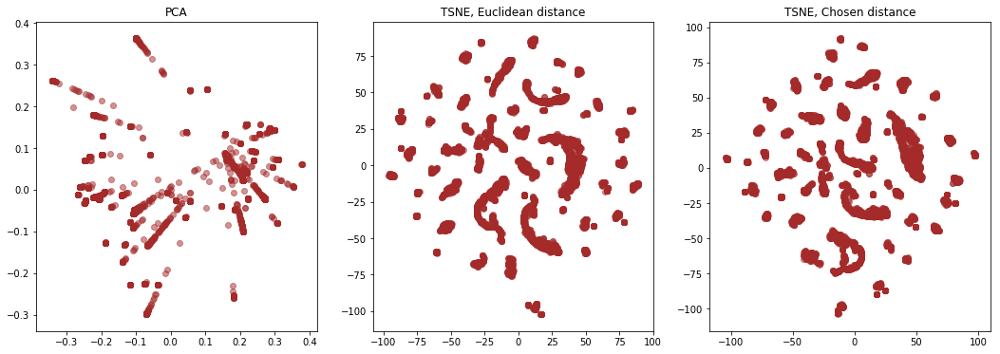

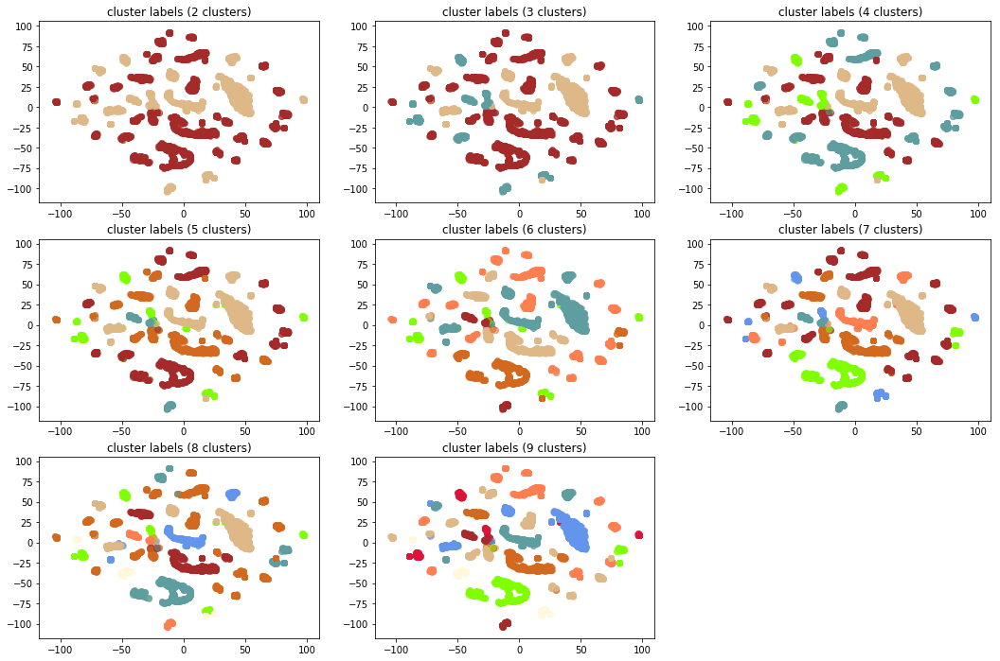

In [31]:
spectra_2D = build_images_KMeans(spectra, spectrum_columns, spectra_distances, colors, TSNE_learning_rate=500, TSNE_n_iter=1500, TSNE_learning_rate2=300)

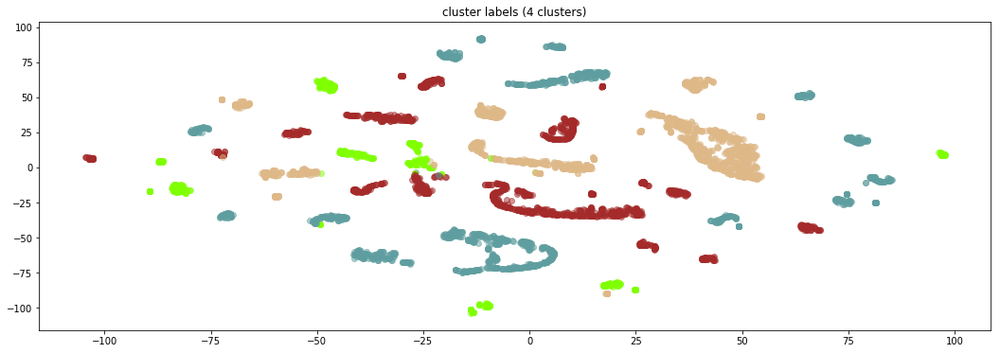

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,KMeans_clusters_4
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,2
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,2
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,2
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,0


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
140,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022239.6+430207',b'http://xmm-catalog.irap.omp.eu/source/200029...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
86,b'1FGL J0035.9+5951 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J003552.4+595002',b'http://xmm-catalog.irap.omp.eu/source/200943...
236,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031611.0+411759',b'http://xmm-catalog.irap.omp.eu/source/201515...
237,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031613.8+411422',b'http://xmm-catalog.irap.omp.eu/source/201515...
238,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031614.1+412536',b'http://xmm-catalog.irap.omp.eu/source/201515...
239,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031617.9+411915',b'http://xmm-catalog.irap.omp.eu/source/201515...
240,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031618.0+411507',b'http://xmm-catalog.irap.omp.eu/source/201515...
241,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.3+412446',b'http://xmm-catalog.irap.omp.eu/source/201515...
242,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.5+411757',b'http://xmm-catalog.irap.omp.eu/source/201515...
243,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.6+411646',b'http://xmm-catalog.irap.omp.eu/source/201515...
244,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031621.8+411714',b'http://xmm-catalog.irap.omp.eu/source/201515...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.042534,0.300448,0.127514,0.178925,0.288852,0.0,0.020195,0.012076,0.008265,0.004852,0.002198,0.000946,0.002386,0.003362,0.003400,0.004047
1,0.265388,0.145661,0.063254,0.203054,0.095154,0.0,0.124397,0.054734,0.019685,0.009112,0.002481,0.001000,0.002144,0.004072,0.004743,0.005121
2,0.030059,0.159478,0.392968,0.095103,0.245881,0.0,0.030214,0.018195,0.012314,0.005953,0.002863,0.000094,0.000541,0.000840,0.001593,0.003905
3,0.117247,0.058512,0.042431,0.056284,0.071392,0.0,0.190106,0.077529,0.071260,0.068431,0.143990,0.004014,0.015826,0.029961,0.028472,0.024547


In [32]:
list_spectra_clusters, centers = print_clusters_structure_KMeans(spectra, spectrum_columns, other_names, spectra_distances, 4, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [33]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display((list_spectra_clusters[i])['gev_1FGL_Name'].unique())
print("centroids:")
display(centers)

0 cluster (#A52A2A)


array(["b'1FGL J0222.6+4302 '", "b'1FGL J0319.7+4130 '",
       "b'1FGL J0633.9+1746 '", "b'1FGL J0721.9+7120 '",
       "b'1FGL J0956.5+6938 '", "b'1FGL J1217.7+3007 '",
       "b'1FGL J1230.8+1223 '", "b'1FGL J1418.7-6057 '",
       "b'1FGL J1714.5-3830c'", "b'1FGL J1718.2-3825 '",
       "b'                  '", "b'1FGL J1747.9-2448 '",
       "b'1FGL J1800.5-2359c'", "b'1FGL J1834.3-0842c'",
       "b'1FGL J1910.9+0906c'", "b'1FGL J1922.9+1411 '",
       "b'1FGL J2001.1+4351 '", "b'1FGL J2021.0+3651 '",
       "b'1FGL J2032.2+4127 '"], dtype=object)

1 cluster (#DEB887)


array(["b'1FGL J0035.9+5951 '", "b'                  '",
       "b'1FGL J0319.7+1847 '", "b'1FGL J0416.8+0107 '",
       "b'1FGL J0650.7+2503 '", "b'1FGL J1104.4+3812 '",
       "b'1FGL J1136.6+7009 '", "b'1FGL J1221.3+3008 '",
       "b'1FGL J1640.8-4634c'", "b'1FGL J1653.9+3945 '",
       "b'1FGL J2000.0+6508 '", "b'1FGL J2009.5-4849 '",
       "b'1FGL J2158.8-3013 '", "b'1FGL J2202.8+4216 '",
       "b'1FGL J2323.4+5849 '"], dtype=object)

2 cluster (#5F9EA0)


array(["b'1FGL J0205.6+6449 '", "b'1FGL J0240.5+6113 '",
       "b'1FGL J0534.5+2200 '", "b'                  '",
       "b'1FGL J0956.5+6938 '", "b'1FGL J1000.1+6539 '",
       "b'1FGL J1018.6-5856 '", "b'1FGL J1119.4-6127c'",
       "b'1FGL J1256.2-0547 '", "b'1FGL J1325.6-4300 '",
       "b'1FGL J1459.4-6053 '", "b'1FGL J1513.2-5904 '",
       "b'1FGL J1617.5-5105c'", "b'1FGL J1745.6-2900c'",
       "b'1FGL J1813.3-1246 '", "b'1FGL J1826.2-1450 '",
       "b'1FGL J1848.1-0145c'", "b'1FGL J1910.9+0906c'",
       "b'1FGL J2015.7+3708 '"], dtype=object)

3 cluster (#7FFF00)


array(["b'                  '", "b'1FGL J0319.7+4130 '",
       "b'1FGL J0416.8+0107 '", "b'1FGL J0956.5+6938 '",
       "b'1FGL J1015.1+4927 '", "b'1FGL J1103.7-2329 '",
       "b'1FGL J1104.4+3812 '", "b'1FGL J1136.6+7009 '",
       "b'1FGL J1221.5+2814 '", "b'1FGL J1221.3+3008 '",
       "b'1FGL J1230.8+1223 '", "b'1FGL J1325.6-4300 '",
       "b'1FGL J1428.7+4239 '", "b'1FGL J1514.7-5917 '",
       "b'1FGL J1513.2-5904 '", "b'1FGL J1555.7+1111 '",
       "b'1FGL J1626.0-4917c'", "b'1FGL J1711.7-3944c'",
       "b'1FGL J1747.9-2448 '", "b'1FGL J2000.0+6508 '",
       "b'1FGL J2323.4+5849 '"], dtype=object)

centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.042534,0.300448,0.127514,0.178925,0.288852,0.0,0.020195,0.012076,0.008265,0.004852,0.002198,0.000946,0.002386,0.003362,0.003400,0.004047
1,0.265388,0.145661,0.063254,0.203054,0.095154,0.0,0.124397,0.054734,0.019685,0.009112,0.002481,0.001000,0.002144,0.004072,0.004743,0.005121
2,0.030059,0.159478,0.392968,0.095103,0.245881,0.0,0.030214,0.018195,0.012314,0.005953,0.002863,0.000094,0.000541,0.000840,0.001593,0.003905
3,0.117247,0.058512,0.042431,0.056284,0.071392,0.0,0.190106,0.077529,0.071260,0.068431,0.143990,0.004014,0.015826,0.029961,0.028472,0.024547


In [34]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    gev_1FGL_Name = (list_spectra_clusters[i])['gev_1FGL_Name'].unique()
    s_MAIN_ID = (list_spectra_clusters[i])['s_MAIN_ID'].unique()
    print(gev_1FGL_Name)
    print(s_MAIN_ID)

0 cluster (#A52A2A)
["b'1FGL J0222.6+4302 '" "b'1FGL J0319.7+4130 '" "b'1FGL J0633.9+1746 '"
 "b'1FGL J0721.9+7120 '" "b'1FGL J0956.5+6938 '" "b'1FGL J1217.7+3007 '"
 "b'1FGL J1230.8+1223 '" "b'1FGL J1418.7-6057 '" "b'1FGL J1714.5-3830c'"
 "b'1FGL J1718.2-3825 '" "b'                  '" "b'1FGL J1747.9-2448 '"
 "b'1FGL J1800.5-2359c'" "b'1FGL J1834.3-0842c'" "b'1FGL J1910.9+0906c'"
 "b'1FGL J1922.9+1411 '" "b'1FGL J2001.1+4351 '" "b'1FGL J2021.0+3651 '"
 "b'1FGL J2032.2+4127 '"]
['[]'
 '["b\'[CHP2004] J095549.8+693934\'" "b\'[MTK2001b] 8\'"\r\r\n "b\'[CHP2004] J095637.5+694137\'" "b\'CXOU J095601.7+694308\'"\r\r\n "b\'CXOU J095548.9+694010\'" "b\'CXOU J095527.1+693923\'"\r\r\n "b\'CXOU J095552.8+694020\'" "b\'CXOU J095552.4+694024\'"\r\r\n "b\'CXOU J095550.7+694039\'" "b\'CXOU J095547.5+694120\'"\r\r\n "b\'CXOU J095527.2+694050\'" "b\'CXOU J095600.7+694107\'"\r\r\n "b\'CXOU J095549.1+694036\'" "b\'CXOU J095546.5+694040\'"\r\r\n "b\'CXOU J095552.7+694045\'" "b\'CXOU J095622.7+694134\'"\

[1.0, 0.8, 0.6000000000000001, 0.4, 0.2, 0.1]


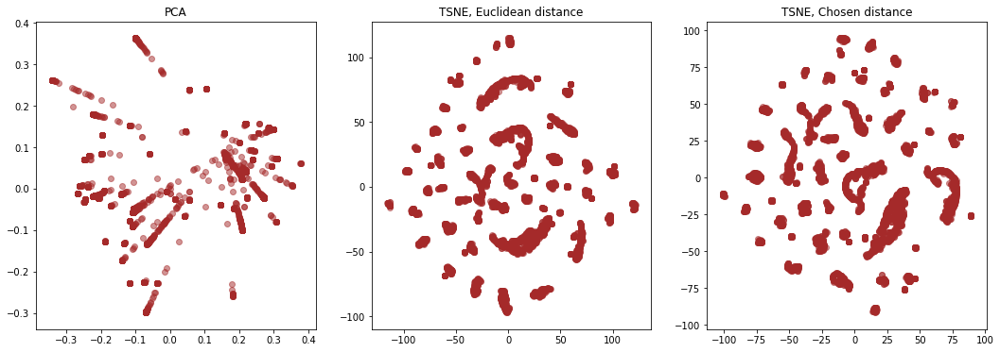

Clustering


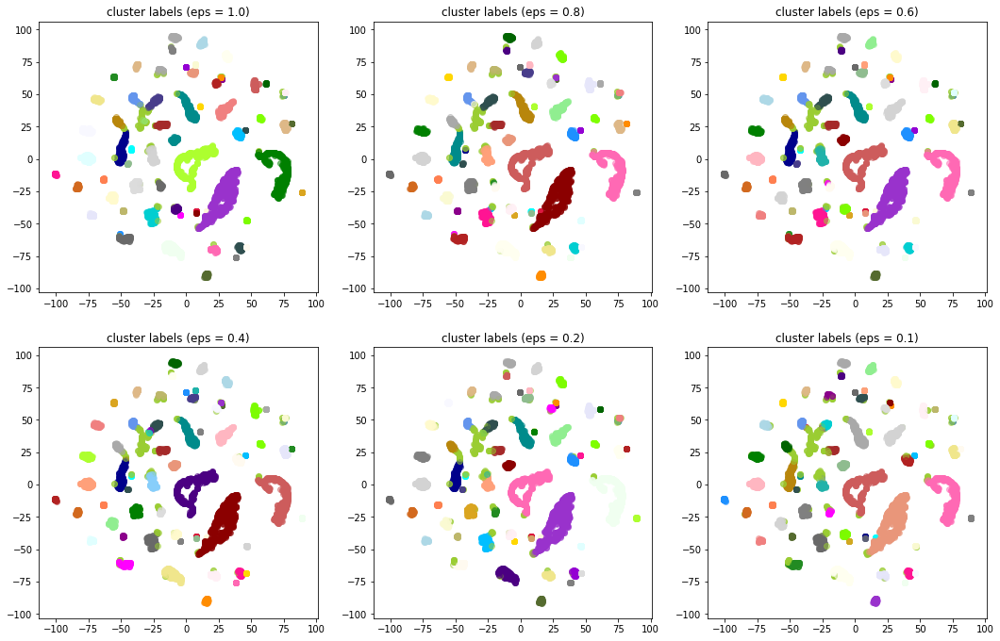

In [35]:
eps_l = [0.1 * i for i in range(10, 0, -2)] + [0.1]
print(eps_l)
spectra_2D = build_images_DBSCAN(spectra, spectrum_columns, spectra_distances, colors, eps_l=eps_l, TSNE_learning_rate=1000, TSNE_n_iter=1500, TSNE_learning_rate2=900)


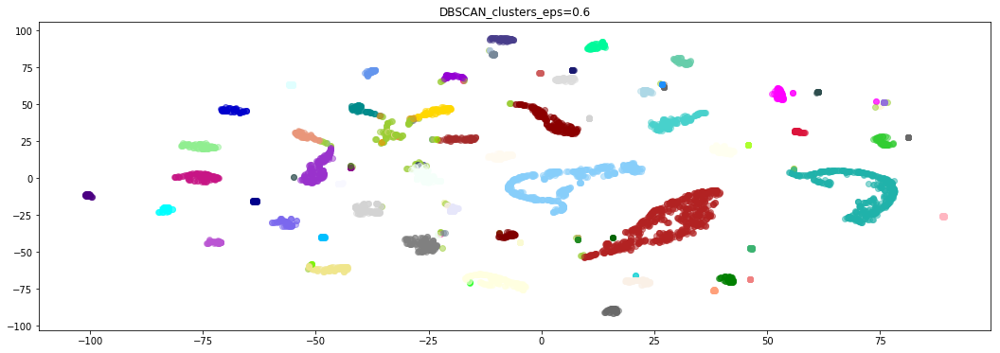

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,DBSCAN_clusters_eps=0.6
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,9
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,32
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,73
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,83


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
29,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002529.4+640631',b'http://xmm-catalog.irap.omp.eu/source/204123...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
74,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002551.2+640622',b'http://xmm-catalog.irap.omp.eu/source/200962...


4 cluster (#D2691E)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
35,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.3+640634',b'http://xmm-catalog.irap.omp.eu/source/205111...
48,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640617',b'http://xmm-catalog.irap.omp.eu/source/204123...


5 cluster (#FF7F50)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
57,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002540.0+641037',b'http://xmm-catalog.irap.omp.eu/source/204123...
77,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.3+640725',b'http://xmm-catalog.irap.omp.eu/source/200962...


6 cluster (#6495ED)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


7 cluster (#FFF8DC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
140,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022239.6+430207',b'http://xmm-catalog.irap.omp.eu/source/200029...


8 cluster (#DC143C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
154,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023224.2+201413',b'http://xmm-catalog.irap.omp.eu/source/206042...
155,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.5+200908',b'http://xmm-catalog.irap.omp.eu/source/206042...
156,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.7+201053',b'http://xmm-catalog.irap.omp.eu/source/206042...
157,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023229.1+201103',b'http://xmm-catalog.irap.omp.eu/source/206042...
158,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023230.4+201703',b'http://xmm-catalog.irap.omp.eu/source/206042...
159,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023231.1+201600',b'http://xmm-catalog.irap.omp.eu/source/206042...
160,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023233.0+201352',b'http://xmm-catalog.irap.omp.eu/source/206042...
161,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023237.5+202201',b'http://xmm-catalog.irap.omp.eu/source/206042...
162,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023240.2+202304',b'http://xmm-catalog.irap.omp.eu/source/206042...
163,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023243.3+202100',b'http://xmm-catalog.irap.omp.eu/source/206042...


9 cluster (#00FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
190,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,1,b'3XMM J024005.3+611247',b'http://xmm-catalog.irap.omp.eu/source/205059...
191,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024008.8+610723',b'http://xmm-catalog.irap.omp.eu/source/202072...
192,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024010.4+611144',b'http://xmm-catalog.irap.omp.eu/source/201124...
193,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024010.8+611213',b'http://xmm-catalog.irap.omp.eu/source/205059...
194,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024011.3+610803',b'http://xmm-catalog.irap.omp.eu/source/205059...
195,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024014.6+610913',b'http://xmm-catalog.irap.omp.eu/source/205059...
196,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024025.4+611525',b'http://xmm-catalog.irap.omp.eu/source/205059...
197,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024025.5+610840',b'http://xmm-catalog.irap.omp.eu/source/205059...
198,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024026.2+611436',b'http://xmm-catalog.irap.omp.eu/source/205059...
199,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024026.7+611716',b'http://xmm-catalog.irap.omp.eu/source/205059...


10 cluster (#00008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
236,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031611.0+411759',b'http://xmm-catalog.irap.omp.eu/source/201515...
237,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031613.8+411422',b'http://xmm-catalog.irap.omp.eu/source/201515...
238,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031614.1+412536',b'http://xmm-catalog.irap.omp.eu/source/201515...
239,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031617.9+411915',b'http://xmm-catalog.irap.omp.eu/source/201515...
240,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031618.0+411507',b'http://xmm-catalog.irap.omp.eu/source/201515...
241,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.3+412446',b'http://xmm-catalog.irap.omp.eu/source/201515...
242,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.5+411757',b'http://xmm-catalog.irap.omp.eu/source/201515...
243,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.6+411646',b'http://xmm-catalog.irap.omp.eu/source/201515...
244,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031621.8+411714',b'http://xmm-catalog.irap.omp.eu/source/201515...
245,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031631.1+412610',b'http://xmm-catalog.irap.omp.eu/source/201515...


11 cluster (#008B8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
266,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.3+412927',b'http://xmm-catalog.irap.omp.eu/source/200851...
267,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.7+413129',b'http://xmm-catalog.irap.omp.eu/source/200851...
268,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.0+412950',b'http://xmm-catalog.irap.omp.eu/source/203057...
269,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.5+413706',b'http://xmm-catalog.irap.omp.eu/source/203057...
270,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.8+412908',b'http://xmm-catalog.irap.omp.eu/source/200851...
271,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.2+412920',b'http://xmm-catalog.irap.omp.eu/source/203057...
272,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.5+413300',b'http://xmm-catalog.irap.omp.eu/source/200851...
273,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031926.8+412838',b'http://xmm-catalog.irap.omp.eu/source/203057...
274,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.3+413549',b'http://xmm-catalog.irap.omp.eu/source/200851...
275,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.4+412819',b'http://xmm-catalog.irap.omp.eu/source/200851...


12 cluster (#B8860B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
279,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.2+413107',b'http://xmm-catalog.irap.omp.eu/source/203057...
291,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031940.7+413218',b'http://xmm-catalog.irap.omp.eu/source/203057...
313,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J032000.0+413130',b'http://xmm-catalog.irap.omp.eu/source/200851...


13 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
283,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031933.4+412947',b'http://xmm-catalog.irap.omp.eu/source/200851...
293,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031941.5+413017',b'http://xmm-catalog.irap.omp.eu/source/203057...
301,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031947.5+413210',b'http://xmm-catalog.irap.omp.eu/source/203057...


14 cluster (#006400)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
332,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032015.2+185052',b'http://xmm-catalog.irap.omp.eu/source/203001...
335,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032016.4+185143',b'http://xmm-catalog.irap.omp.eu/source/203001...
340,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032018.1+184914',b'http://xmm-catalog.irap.omp.eu/source/203001...
341,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.6+184826',b'http://xmm-catalog.irap.omp.eu/source/203001...
342,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.9+185315',b'http://xmm-catalog.irap.omp.eu/source/203001...


15 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
343,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034851.9-115713',b'http://xmm-catalog.irap.omp.eu/source/200943...
344,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034852.2-115600',b'http://xmm-catalog.irap.omp.eu/source/200943...
345,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034919.1-120548',b'http://xmm-catalog.irap.omp.eu/source/200943...


16 cluster (#BDB76B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
347,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010625',b'http://xmm-catalog.irap.omp.eu/source/200943...
348,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010030',b'http://xmm-catalog.irap.omp.eu/source/200943...
349,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041631.0+005746',b'http://xmm-catalog.irap.omp.eu/source/201611...
350,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041633.6+010627',b'http://xmm-catalog.irap.omp.eu/source/200943...
351,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041641.5+011100',b'http://xmm-catalog.irap.omp.eu/source/201611...
352,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041644.8+011007',b'http://xmm-catalog.irap.omp.eu/source/200943...
355,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041656.6+005801',b'http://xmm-catalog.irap.omp.eu/source/200943...
356,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041702.2+011139',b'http://xmm-catalog.irap.omp.eu/source/201611...
357,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041711.9+005913',b'http://xmm-catalog.irap.omp.eu/source/201611...
358,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041716.1+010856',b'http://xmm-catalog.irap.omp.eu/source/201611...


17 cluster (#8B008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
361,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052402.0-693136',b'http://xmm-catalog.irap.omp.eu/source/201571...
362,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052407.1-693952',b'http://xmm-catalog.irap.omp.eu/source/201293...
364,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052419.2-693256',b'http://xmm-catalog.irap.omp.eu/source/202106...
365,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052426.2-693613',b'http://xmm-catalog.irap.omp.eu/source/201251...
367,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052437.8-694249',b'http://xmm-catalog.irap.omp.eu/source/206907...
368,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052441.9-693432',b'http://xmm-catalog.irap.omp.eu/source/201293...
369,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052442.1-694142',b'http://xmm-catalog.irap.omp.eu/source/206907...
370,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052443.0-693938',b'http://xmm-catalog.irap.omp.eu/source/201375...
371,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052444.0-694058',b'http://xmm-catalog.irap.omp.eu/source/206907...
372,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052449.2-693319',b'http://xmm-catalog.irap.omp.eu/source/201251...


18 cluster (#556B2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
374,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052450.8-693633',b'http://xmm-catalog.irap.omp.eu/source/206907...
375,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052454.7-693835',b'http://xmm-catalog.irap.omp.eu/source/204141...


19 cluster (#FF8C00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
376,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.5-693824',b'http://xmm-catalog.irap.omp.eu/source/201251...
383,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052459.1-693911',b'http://xmm-catalog.irap.omp.eu/source/201251...


20 cluster (#9932CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
384,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053403.9+215451',b'http://xmm-catalog.irap.omp.eu/source/204125...
385,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
387,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
389,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
391,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
393,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
395,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
397,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
399,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
401,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...


21 cluster (#8B0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
386,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
388,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
390,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
392,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
394,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
396,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
398,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
400,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
402,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...
404,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...


22 cluster (#E9967A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
762,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055010.9-321225',b'http://xmm-catalog.irap.omp.eu/source/201422...
763,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.5-322308',b'http://xmm-catalog.irap.omp.eu/source/201118...
764,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.6-321534',b'http://xmm-catalog.irap.omp.eu/source/201422...
765,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055016.8-321645',b'http://xmm-catalog.irap.omp.eu/source/201422...
766,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055017.4-322200',b'http://xmm-catalog.irap.omp.eu/source/201422...
767,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.0-321242',b'http://xmm-catalog.irap.omp.eu/source/201422...
768,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.4-321550',b'http://xmm-catalog.irap.omp.eu/source/201118...
769,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.1-321441',b'http://xmm-catalog.irap.omp.eu/source/201422...
770,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.6-321114',b'http://xmm-catalog.irap.omp.eu/source/201422...
771,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055020.5-322033',b'http://xmm-catalog.irap.omp.eu/source/201422...


23 cluster (#8FBC8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
797,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055039.8-321516',b'http://xmm-catalog.irap.omp.eu/source/201118...
799,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055041.1-321710',b'http://xmm-catalog.irap.omp.eu/source/201422...


24 cluster (#483D8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
834,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175211',b'http://xmm-catalog.irap.omp.eu/source/201111...
835,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175112',b'http://xmm-catalog.irap.omp.eu/source/201111...
836,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.9+174240',b'http://xmm-catalog.irap.omp.eu/source/201111...
837,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063328.2+173953',b'http://xmm-catalog.irap.omp.eu/source/201111...
838,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.0+174839',b'http://xmm-catalog.irap.omp.eu/source/201111...
839,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.1+174916',b'http://xmm-catalog.irap.omp.eu/source/201111...
840,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.8+174134',b'http://xmm-catalog.irap.omp.eu/source/205504...
841,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.2+175301',b'http://xmm-catalog.irap.omp.eu/source/201111...
842,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.9+175034',b'http://xmm-catalog.irap.omp.eu/source/201111...
843,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063332.0+174054',b'http://xmm-catalog.irap.omp.eu/source/201111...


25 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
890,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065043.3+250334',b'http://xmm-catalog.irap.omp.eu/source/200943...
891,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065046.3+250204',b'http://xmm-catalog.irap.omp.eu/source/200943...


26 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
893,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072131.2+712625',b'http://xmm-catalog.irap.omp.eu/source/201504...
894,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.2+712516',b'http://xmm-catalog.irap.omp.eu/source/201504...
895,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.7+712725',b'http://xmm-catalog.irap.omp.eu/source/201504...
896,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.3+712105',b'http://xmm-catalog.irap.omp.eu/source/200128...
897,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.6+712248',b'http://xmm-catalog.irap.omp.eu/source/201504...
898,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.8+711800',b'http://xmm-catalog.irap.omp.eu/source/201504...
899,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072146.0+712541',b'http://xmm-catalog.irap.omp.eu/source/201504...
900,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072147.0+712211',b'http://xmm-catalog.irap.omp.eu/source/200128...
901,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072148.5+712601',b'http://xmm-catalog.irap.omp.eu/source/201504...
902,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072149.3+712144',b'http://xmm-catalog.irap.omp.eu/source/200128...


27 cluster (#00CED1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
911,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083240.5-451222',b'http://xmm-catalog.irap.omp.eu/source/206720...
912,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083241.3-451401',b'http://xmm-catalog.irap.omp.eu/source/206720...


28 cluster (#9400D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
913,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095503.8+694329',b'http://xmm-catalog.irap.omp.eu/source/201122...
914,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.0+693600',b'http://xmm-catalog.irap.omp.eu/source/206578...
915,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.1+694442',b'http://xmm-catalog.irap.omp.eu/source/201122...
916,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.8+693720',b'http://xmm-catalog.irap.omp.eu/source/206578...
917,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095507.1+693701',b'http://xmm-catalog.irap.omp.eu/source/202060...
918,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.1+693549',b'http://xmm-catalog.irap.omp.eu/source/201122...
919,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.9+694330',b'http://xmm-catalog.irap.omp.eu/source/201122...
920,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095510.4+693954',b'http://xmm-catalog.irap.omp.eu/source/201122...
921,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095512.3+694639',b'http://xmm-catalog.irap.omp.eu/source/202060...
922,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095514.8+693613',b'http://xmm-catalog.irap.omp.eu/source/201122...


29 cluster (#FF1493)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
960,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095549.3+694224',b'http://xmm-catalog.irap.omp.eu/source/202060...
966,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.5+693939',b'http://xmm-catalog.irap.omp.eu/source/206578...
967,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.7+694233',b'http://xmm-catalog.irap.omp.eu/source/206578...


30 cluster (#00BFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
977,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095810.3+652720',b'http://xmm-catalog.irap.omp.eu/source/203025...
978,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095814.8+652801',b'http://xmm-catalog.irap.omp.eu/source/203025...
979,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095827.2+653540',b'http://xmm-catalog.irap.omp.eu/source/205024...
980,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095828.3+653424',b'http://xmm-catalog.irap.omp.eu/source/205024...
981,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095833.0+652835',b'http://xmm-catalog.irap.omp.eu/source/205024...
982,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095837.5+653505',b'http://xmm-catalog.irap.omp.eu/source/205024...
983,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095840.4+654057',b'http://xmm-catalog.irap.omp.eu/source/205024...
984,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+653449',b'http://xmm-catalog.irap.omp.eu/source/203025...
985,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+652848',b'http://xmm-catalog.irap.omp.eu/source/203025...
986,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.9+652711',b'http://xmm-catalog.irap.omp.eu/source/205024...


31 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1004,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101441.7+493104',b'http://xmm-catalog.irap.omp.eu/source/202063...
1005,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101451.2+492337',b'http://xmm-catalog.irap.omp.eu/source/202063...
1006,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.1+492522',b'http://xmm-catalog.irap.omp.eu/source/202063...
1007,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.4+493047',b'http://xmm-catalog.irap.omp.eu/source/202063...
1008,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101504.4+492653',b'http://xmm-catalog.irap.omp.eu/source/202063...
1009,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101508.0+493153',b'http://xmm-catalog.irap.omp.eu/source/202063...
1010,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101509.2+492738',b'http://xmm-catalog.irap.omp.eu/source/202063...
1011,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101514.5+493252',b'http://xmm-catalog.irap.omp.eu/source/202063...


32 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1012,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,1,b'3XMM J101826.8-585838',b'http://xmm-catalog.irap.omp.eu/source/206943...
1013,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101827.7-585348',b'http://xmm-catalog.irap.omp.eu/source/206943...
1014,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101828.5-585518',b'http://xmm-catalog.irap.omp.eu/source/206047...
1015,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101831.8-585524',b'http://xmm-catalog.irap.omp.eu/source/206943...
1016,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101832.7-585829',b'http://xmm-catalog.irap.omp.eu/source/206047...
1017,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101835.1-585013',b'http://xmm-catalog.irap.omp.eu/source/206047...
1018,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101835.4-585618',b'http://xmm-catalog.irap.omp.eu/source/206047...
1019,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101835.4-585722',b'http://xmm-catalog.irap.omp.eu/source/206943...
1020,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101836.1-585144',b'http://xmm-catalog.irap.omp.eu/source/206047...
1021,b'1FGL J1018.6-5856 ',b'HMB ',b'1FGL J1018.6-5856',b'bin',"[""b'2FGL J1019.0-5856'""]",['B0Ve'],2,0,b'3XMM J101837.5-590239',b'http://xmm-catalog.irap.omp.eu/source/206943...


33 cluster (#1E90FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1059,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110306.4-233533',b'http://xmm-catalog.irap.omp.eu/source/202059...
1060,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.1-232754',b'http://xmm-catalog.irap.omp.eu/source/202059...
1061,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.6-233621',b'http://xmm-catalog.irap.omp.eu/source/202059...
1062,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.1-233448',b'http://xmm-catalog.irap.omp.eu/source/202059...
1063,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.4-232239',b'http://xmm-catalog.irap.omp.eu/source/202059...
1064,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110327.9-233631',b'http://xmm-catalog.irap.omp.eu/source/202059...
1066,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110337.5-232223',b'http://xmm-catalog.irap.omp.eu/source/202059...
1068,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110338.4-232257',b'http://xmm-catalog.irap.omp.eu/source/202059...
1069,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110345.0-232220',b'http://xmm-catalog.irap.omp.eu/source/202059...
1070,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110346.7-232359',b'http://xmm-catalog.irap.omp.eu/source/202059...


34 cluster (#B22222)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1072,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+380539',b'http://xmm-catalog.irap.omp.eu/source/200992...
1073,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+381102',b'http://xmm-catalog.irap.omp.eu/source/201539...
1074,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.3+380832',b'http://xmm-catalog.irap.omp.eu/source/201589...
1075,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.6+380527',b'http://xmm-catalog.irap.omp.eu/source/201365...
1076,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.9+381512',b'http://xmm-catalog.irap.omp.eu/source/206709...
1077,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.1+380536',b'http://xmm-catalog.irap.omp.eu/source/204110...
1078,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.4+381536',b'http://xmm-catalog.irap.omp.eu/source/201589...
1079,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.6+380540',b'http://xmm-catalog.irap.omp.eu/source/201365...
1080,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+381101',b'http://xmm-catalog.irap.omp.eu/source/201539...
1081,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+380547',b'http://xmm-catalog.irap.omp.eu/source/201539...


35 cluster (#FFFAF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1699,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111843.3-612529',b'http://xmm-catalog.irap.omp.eu/source/201507...
1700,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111843.8-612328',b'http://xmm-catalog.irap.omp.eu/source/206727...
1701,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111846.3-612429',b'http://xmm-catalog.irap.omp.eu/source/201507...
1702,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111847.6-613351',b'http://xmm-catalog.irap.omp.eu/source/206727...
1703,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111850.1-612223',b'http://xmm-catalog.irap.omp.eu/source/206727...
1704,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111850.7-612133',b'http://xmm-catalog.irap.omp.eu/source/206727...
1705,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111851.5-612450',b'http://xmm-catalog.irap.omp.eu/source/201507...
1706,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111853.1-613345',b'http://xmm-catalog.irap.omp.eu/source/201507...
1707,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111853.5-613458',b'http://xmm-catalog.irap.omp.eu/source/201507...
1708,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111855.0-612354',b'http://xmm-catalog.irap.omp.eu/source/201507...


36 cluster (#228B22)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1762,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.1+700256',b'http://xmm-catalog.irap.omp.eu/source/200941...
1763,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.9+700903',b'http://xmm-catalog.irap.omp.eu/source/200941...
1765,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113627.4+700532',b'http://xmm-catalog.irap.omp.eu/source/200941...
1766,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113628.1+700431',b'http://xmm-catalog.irap.omp.eu/source/200941...
1767,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113631.4+700957',b'http://xmm-catalog.irap.omp.eu/source/200941...
1768,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113640.3+700542',b'http://xmm-catalog.irap.omp.eu/source/200941...


37 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1769,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121755.6+300026',b'http://xmm-catalog.irap.omp.eu/source/201091...
1770,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121819.6+300010',b'http://xmm-catalog.irap.omp.eu/source/201091...


38 cluster (#DCDCDC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1771,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122102.5+281609',b'http://xmm-catalog.irap.omp.eu/source/201048...
1772,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+280805',b'http://xmm-catalog.irap.omp.eu/source/201048...
1773,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+281040',b'http://xmm-catalog.irap.omp.eu/source/201048...
1774,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.4+280846',b'http://xmm-catalog.irap.omp.eu/source/201048...
1775,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.0+281518',b'http://xmm-catalog.irap.omp.eu/source/201048...
1776,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.9+281618',b'http://xmm-catalog.irap.omp.eu/source/201048...
1777,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122108.2+281215',b'http://xmm-catalog.irap.omp.eu/source/201048...
1778,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.5+282103',b'http://xmm-catalog.irap.omp.eu/source/205022...
1779,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.6+280954',b'http://xmm-catalog.irap.omp.eu/source/205022...
1780,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.9+281118',b'http://xmm-catalog.irap.omp.eu/source/201048...


39 cluster (#F8F8FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1783,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122112.6+300637',b'http://xmm-catalog.irap.omp.eu/source/201118...
1785,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.3+300537',b'http://xmm-catalog.irap.omp.eu/source/201118...
1786,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.4+300651',b'http://xmm-catalog.irap.omp.eu/source/201118...
1787,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122115.1+300558',b'http://xmm-catalog.irap.omp.eu/source/201118...
1791,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122117.1+300951',b'http://xmm-catalog.irap.omp.eu/source/201118...
1792,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122118.2+301543',b'http://xmm-catalog.irap.omp.eu/source/201118...
1794,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122120.2+301611',b'http://xmm-catalog.irap.omp.eu/source/201118...
1800,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122122.7+300932',b'http://xmm-catalog.irap.omp.eu/source/201118...
1801,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122124.2+301118',b'http://xmm-catalog.irap.omp.eu/source/201118...
1805,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122127.8+301438',b'http://xmm-catalog.irap.omp.eu/source/201118...


40 cluster (#FFD700)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1836,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.7+122645',b'http://xmm-catalog.irap.omp.eu/source/201141...
1837,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.8+123115',b'http://xmm-catalog.irap.omp.eu/source/205518...
1839,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122656',b'http://xmm-catalog.irap.omp.eu/source/202009...
1840,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122819',b'http://xmm-catalog.irap.omp.eu/source/202009...
1841,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122908',b'http://xmm-catalog.irap.omp.eu/source/202009...
1842,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122218',b'http://xmm-catalog.irap.omp.eu/source/205518...
1843,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122507',b'http://xmm-catalog.irap.omp.eu/source/202009...
1844,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.5+121755',b'http://xmm-catalog.irap.omp.eu/source/206032...
1845,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.9+122914',b'http://xmm-catalog.irap.omp.eu/source/201141...
1846,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123029.0+123128',b'http://xmm-catalog.irap.omp.eu/source/206032...


41 cluster (#DAA520)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1838,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.9+122101',b'http://xmm-catalog.irap.omp.eu/source/205518...
1864,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123038.9+123043',b'http://xmm-catalog.irap.omp.eu/source/206032...
1866,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123039.2+122458',b'http://xmm-catalog.irap.omp.eu/source/202009...
1870,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123041.3+122525',b'http://xmm-catalog.irap.omp.eu/source/202009...
1877,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123043.6+122618',b'http://xmm-catalog.irap.omp.eu/source/202009...
1883,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123046.3+122112',b'http://xmm-catalog.irap.omp.eu/source/202009...
1884,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123046.5+122551',b'http://xmm-catalog.irap.omp.eu/source/201141...
1886,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123047.6+122501',b'http://xmm-catalog.irap.omp.eu/source/201141...
1895,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123053.9+122702',b'http://xmm-catalog.irap.omp.eu/source/202009...
1896,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123054.5+123000',b'http://xmm-catalog.irap.omp.eu/source/201060...


42 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1851,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123031.3+122341',b'http://xmm-catalog.irap.omp.eu/source/205518...
1919,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123101.6+122335',b'http://xmm-catalog.irap.omp.eu/source/201141...


43 cluster (#008000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1949,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125543.1-054058',b'http://xmm-catalog.irap.omp.eu/source/205560...
1950,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125544.2-055341',b'http://xmm-catalog.irap.omp.eu/source/206516...
1951,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125545.0-055206',b'http://xmm-catalog.irap.omp.eu/source/206516...
1952,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125548.8-054447',b'http://xmm-catalog.irap.omp.eu/source/206516...
1953,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.1-054257',b'http://xmm-catalog.irap.omp.eu/source/205560...
1954,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.5-054829',b'http://xmm-catalog.irap.omp.eu/source/205560...
1955,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.2-055101',b'http://xmm-catalog.irap.omp.eu/source/205560...
1956,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-055359',b'http://xmm-catalog.irap.omp.eu/source/206516...
1957,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-054934',b'http://xmm-catalog.irap.omp.eu/source/205560...
1958,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125553.9-055230',b'http://xmm-catalog.irap.omp.eu/source/206516...


44 cluster (#ADFF2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2002,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130234.9-630754',b'http://xmm-catalog.irap.omp.eu/source/203023...
2003,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130242.1-631310',b'http://xmm-catalog.irap.omp.eu/source/203034...
2004,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130244.3-630716',b'http://xmm-catalog.irap.omp.eu/source/203034...
2005,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130245.6-631532',b'http://xmm-catalog.irap.omp.eu/source/203034...
2006,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130246.7-631503',b'http://xmm-catalog.irap.omp.eu/source/203034...
2007,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130247.2-630647',b'http://xmm-catalog.irap.omp.eu/source/203034...
2008,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.1-631353',b'http://xmm-catalog.irap.omp.eu/source/203034...
2009,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.4-631216',b'http://xmm-catalog.irap.omp.eu/source/203023...
2010,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.1-630715',b'http://xmm-catalog.irap.omp.eu/source/203023...
2011,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.4-630832',b'http://xmm-catalog.irap.omp.eu/source/203034...


45 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2017,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132459.9-430841',b'http://xmm-catalog.irap.omp.eu/source/207240...
2018,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132501.0-430643',b'http://xmm-catalog.irap.omp.eu/source/200936...
2019,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132502.7-430243',b'http://xmm-catalog.irap.omp.eu/source/200936...
2020,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132503.1-425623',b'http://xmm-catalog.irap.omp.eu/source/200936...
2021,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.5-430407',b'http://xmm-catalog.irap.omp.eu/source/200936...
2022,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.6-430426',b'http://xmm-catalog.irap.omp.eu/source/200936...
2023,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.8-430436',b'http://xmm-catalog.irap.omp.eu/source/200936...
2024,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.0-430133',b'http://xmm-catalog.irap.omp.eu/source/200936...
2025,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.7-430433',b'http://xmm-catalog.irap.omp.eu/source/207240...
2026,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.8-425539',b'http://xmm-catalog.irap.omp.eu/source/207240...


46 cluster (#F0FFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2074,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132524.4-430047',b'http://xmm-catalog.irap.omp.eu/source/200936...
2075,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132524.8-425948',b'http://xmm-catalog.irap.omp.eu/source/207240...
2079,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.2-430146',b'http://xmm-catalog.irap.omp.eu/source/200936...
2103,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.4-430025',b'http://xmm-catalog.irap.omp.eu/source/207240...
2104,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.7-430021',b'http://xmm-catalog.irap.omp.eu/source/207240...


47 cluster (#FF69B4)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2081,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.4-430005',b'http://xmm-catalog.irap.omp.eu/source/207240...
2082,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132526.4-430202',b'http://xmm-catalog.irap.omp.eu/source/207240...
2096,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132531.2-430039',b'http://xmm-catalog.irap.omp.eu/source/207240...


48 cluster (#CD5C5C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2148,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135611.5-642817',b'http://xmm-catalog.irap.omp.eu/source/206032...
2149,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.1-642434',b'http://xmm-catalog.irap.omp.eu/source/206032...
2150,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.5-642656',b'http://xmm-catalog.irap.omp.eu/source/206032...
2151,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135615.6-642325',b'http://xmm-catalog.irap.omp.eu/source/206032...
2152,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135619.8-642501',b'http://xmm-catalog.irap.omp.eu/source/203069...
2153,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.0-643226',b'http://xmm-catalog.irap.omp.eu/source/206032...
2154,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.6-642949',b'http://xmm-catalog.irap.omp.eu/source/206032...
2155,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135624.4-643101',b'http://xmm-catalog.irap.omp.eu/source/206032...
2156,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135628.7-642250',b'http://xmm-catalog.irap.omp.eu/source/203069...
2157,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135642.1-642400',b'http://xmm-catalog.irap.omp.eu/source/203069...


49 cluster (#4B0082)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2165,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141813.4-610150',b'http://xmm-catalog.irap.omp.eu/source/205557...
2166,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141815.0-605943',b'http://xmm-catalog.irap.omp.eu/source/205557...
2167,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141825.9-610019',b'http://xmm-catalog.irap.omp.eu/source/205557...
2168,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141826.7-605355',b'http://xmm-catalog.irap.omp.eu/source/205557...
2169,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605924',b'http://xmm-catalog.irap.omp.eu/source/201511...
2170,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605117',b'http://xmm-catalog.irap.omp.eu/source/205557...
2171,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141829.2-605849',b'http://xmm-catalog.irap.omp.eu/source/205557...
2172,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141831.7-605824',b'http://xmm-catalog.irap.omp.eu/source/201511...
2173,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141836.8-605907',b'http://xmm-catalog.irap.omp.eu/source/205557...
2174,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141837.8-605252',b'http://xmm-catalog.irap.omp.eu/source/205557...


50 cluster (#FFFFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2198,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142807.6+423631',b'http://xmm-catalog.irap.omp.eu/source/201118...
2199,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142808.0+424155',b'http://xmm-catalog.irap.omp.eu/source/201118...
2200,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142809.6+423329',b'http://xmm-catalog.irap.omp.eu/source/201118...
2201,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142811.5+424628',b'http://xmm-catalog.irap.omp.eu/source/201657...
2202,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142812.7+423726',b'http://xmm-catalog.irap.omp.eu/source/201118...
2203,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142813.4+423756',b'http://xmm-catalog.irap.omp.eu/source/201118...
2204,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142814.4+424055',b'http://xmm-catalog.irap.omp.eu/source/201118...
2205,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142815.4+424701',b'http://xmm-catalog.irap.omp.eu/source/203101...
2206,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142816.0+423604',b'http://xmm-catalog.irap.omp.eu/source/201118...
2207,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142818.2+424658',b'http://xmm-catalog.irap.omp.eu/source/201657...


51 cluster (#F0E68C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2285,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.0-590238',b'http://xmm-catalog.irap.omp.eu/source/203125...
2286,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.2-590213',b'http://xmm-catalog.irap.omp.eu/source/202070...
2287,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.3-590738',b'http://xmm-catalog.irap.omp.eu/source/202070...
2288,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.6-590230',b'http://xmm-catalog.irap.omp.eu/source/201281...
2289,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.9-590423',b'http://xmm-catalog.irap.omp.eu/source/203027...
2290,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151328.1-590747',b'http://xmm-catalog.irap.omp.eu/source/202070...
2291,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151329.2-590308',b'http://xmm-catalog.irap.omp.eu/source/203027...
2292,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.2-590358',b'http://xmm-catalog.irap.omp.eu/source/202070...
2293,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.9-590805',b'http://xmm-catalog.irap.omp.eu/source/202070...
2294,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151332.4-590123',b'http://xmm-catalog.irap.omp.eu/source/201281...


52 cluster (#E6E6FA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2302,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151335.7-591601',b'http://xmm-catalog.irap.omp.eu/source/201281...
2304,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151336.0-591303',b'http://xmm-catalog.irap.omp.eu/source/203125...
2305,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151337.2-591550',b'http://xmm-catalog.irap.omp.eu/source/203027...
2312,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.3-590838',b'http://xmm-catalog.irap.omp.eu/source/203027...
2314,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.5-590854',b'http://xmm-catalog.irap.omp.eu/source/202070...
2317,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.0-591143',b'http://xmm-catalog.irap.omp.eu/source/202070...
2320,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.7-590917',b'http://xmm-catalog.irap.omp.eu/source/203027...
2321,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.4-591543',b'http://xmm-catalog.irap.omp.eu/source/201281...
2323,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.8-591317',b'http://xmm-catalog.irap.omp.eu/source/203125...
2325,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.9-590935',b'http://xmm-catalog.irap.omp.eu/source/203027...


53 cluster (#FFF0F5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2337,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151346.0-590844',b'http://xmm-catalog.irap.omp.eu/source/202070...
2404,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151403.6-591007',b'http://xmm-catalog.irap.omp.eu/source/202070...
2414,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151412.0-591121',b'http://xmm-catalog.irap.omp.eu/source/202070...
2416,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151412.2-591114',b'http://xmm-catalog.irap.omp.eu/source/203027...


54 cluster (#7CFC00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2351,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151352.6-590821',b'http://xmm-catalog.irap.omp.eu/source/202070...
2361,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...
2369,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151357.2-590735',b'http://xmm-catalog.irap.omp.eu/source/203027...
2394,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151401.6-590950',b'http://xmm-catalog.irap.omp.eu/source/202070...


55 cluster (#FFFACD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2362,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...
2395,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151401.6-590950',b'http://xmm-catalog.irap.omp.eu/source/202070...


56 cluster (#ADD8E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2427,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.2+110501',b'http://xmm-catalog.irap.omp.eu/source/206569...
2428,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.7+110858',b'http://xmm-catalog.irap.omp.eu/source/200943...
2429,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.2+111432',b'http://xmm-catalog.irap.omp.eu/source/207277...
2430,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.4+111037',b'http://xmm-catalog.irap.omp.eu/source/200943...
2431,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.8+111609',b'http://xmm-catalog.irap.omp.eu/source/206569...
2432,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155519.1+111344',b'http://xmm-catalog.irap.omp.eu/source/200943...
2433,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155520.7+111756',b'http://xmm-catalog.irap.omp.eu/source/207277...
2434,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155521.2+111359',b'http://xmm-catalog.irap.omp.eu/source/207277...
2435,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155522.3+111804',b'http://xmm-catalog.irap.omp.eu/source/206569...
2436,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155523.4+111429',b'http://xmm-catalog.irap.omp.eu/source/207277...


57 cluster (#F08080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2466,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161606.4-505431',b'http://xmm-catalog.irap.omp.eu/source/201130...
2467,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161612.9-510027',b'http://xmm-catalog.irap.omp.eu/source/203023...
2468,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161617.2-505800',b'http://xmm-catalog.irap.omp.eu/source/203023...
2469,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161623.0-510045',b'http://xmm-catalog.irap.omp.eu/source/203023...
2470,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161628.1-505753',b'http://xmm-catalog.irap.omp.eu/source/203023...
2471,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161631.0-505750',b'http://xmm-catalog.irap.omp.eu/source/203023...
2472,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161634.4-510128',b'http://xmm-catalog.irap.omp.eu/source/203023...
2473,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.2-505238',b'http://xmm-catalog.irap.omp.eu/source/203023...
2474,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.4-505406',b'http://xmm-catalog.irap.omp.eu/source/201130...
2475,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161641.4-505514',b'http://xmm-catalog.irap.omp.eu/source/201130...


58 cluster (#E0FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2476,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162551.4-491717',b'http://xmm-catalog.irap.omp.eu/source/207419...
2477,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162553.1-490602',b'http://xmm-catalog.irap.omp.eu/source/207419...
2478,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162555.5-491256',b'http://xmm-catalog.irap.omp.eu/source/204032...
2479,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162556.8-490603',b'http://xmm-catalog.irap.omp.eu/source/204032...
2480,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162559.9-491150',b'http://xmm-catalog.irap.omp.eu/source/207419...
2481,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162601.8-491411',b'http://xmm-catalog.irap.omp.eu/source/204032...
2482,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162603.3-491034',b'http://xmm-catalog.irap.omp.eu/source/204032...
2483,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162604.1-491231',b'http://xmm-catalog.irap.omp.eu/source/207419...
2484,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162605.5-490902',b'http://xmm-catalog.irap.omp.eu/source/204032...
2485,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162608.7-491743',b'http://xmm-catalog.irap.omp.eu/source/204032...


59 cluster (#FAFAD2)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2505,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164000.3-463917',b'http://xmm-catalog.irap.omp.eu/source/203025...
2506,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164002.4-463200',b'http://xmm-catalog.irap.omp.eu/source/202063...
2507,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164004.1-463502',b'http://xmm-catalog.irap.omp.eu/source/202063...
2508,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164006.7-462914',b'http://xmm-catalog.irap.omp.eu/source/203025...
2509,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164012.7-463903',b'http://xmm-catalog.irap.omp.eu/source/202063...
2510,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164016.5-463631',b'http://xmm-catalog.irap.omp.eu/source/203025...
2511,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164017.7-464132',b'http://xmm-catalog.irap.omp.eu/source/202063...
2512,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164022.3-462838',b'http://xmm-catalog.irap.omp.eu/source/203025...
2513,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164035.9-463020',b'http://xmm-catalog.irap.omp.eu/source/203025...
2514,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164042.4-463154',b'http://xmm-catalog.irap.omp.eu/source/203025...


60 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2518,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165326.3+394547',b'http://xmm-catalog.irap.omp.eu/source/206525...
2519,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.2+394531',b'http://xmm-catalog.irap.omp.eu/source/206525...
2520,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.9+394708',b'http://xmm-catalog.irap.omp.eu/source/206525...
2521,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.3+394726',b'http://xmm-catalog.irap.omp.eu/source/206525...
2522,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.4+395120',b'http://xmm-catalog.irap.omp.eu/source/206525...
2523,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165330.0+394535',b'http://xmm-catalog.irap.omp.eu/source/206525...
2524,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.8+394608',b'http://xmm-catalog.irap.omp.eu/source/201130...
2525,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.9+394654',b'http://xmm-catalog.irap.omp.eu/source/206525...
2526,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165332.0+394238',b'http://xmm-catalog.irap.omp.eu/source/201130...
2527,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165333.6+394244',b'http://xmm-catalog.irap.omp.eu/source/201130...


61 cluster (#90EE90)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2614,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171305.7-394319',b'http://xmm-catalog.irap.omp.eu/source/207408...
2615,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171306.8-395047',b'http://xmm-catalog.irap.omp.eu/source/207408...
2616,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171307.7-393944',b'http://xmm-catalog.irap.omp.eu/source/207221...
2617,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.1-395025',b'http://xmm-catalog.irap.omp.eu/source/200936...
2618,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394252',b'http://xmm-catalog.irap.omp.eu/source/207221...
2619,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394536',b'http://xmm-catalog.irap.omp.eu/source/207408...
2620,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.2-394826',b'http://xmm-catalog.irap.omp.eu/source/207408...
2621,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.5-394422',b'http://xmm-catalog.irap.omp.eu/source/207408...
2622,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.9-394237',b'http://xmm-catalog.irap.omp.eu/source/207221...
2623,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171311.0-394524',b'http://xmm-catalog.irap.omp.eu/source/207408...


62 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2693,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171411.2-383255',b'http://xmm-catalog.irap.omp.eu/source/203065...
2694,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171415.2-383024',b'http://xmm-catalog.irap.omp.eu/source/203065...
2695,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171420.3-383023',b'http://xmm-catalog.irap.omp.eu/source/203065...
2696,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171428.5-383600',b'http://xmm-catalog.irap.omp.eu/source/203065...
2697,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171430.9-382838',b'http://xmm-catalog.irap.omp.eu/source/203065...
2698,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171434.5-383311',b'http://xmm-catalog.irap.omp.eu/source/203065...
2699,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171435.5-382912',b'http://xmm-catalog.irap.omp.eu/source/203065...
2700,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171441.0-382854',b'http://xmm-catalog.irap.omp.eu/source/203065...
2701,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171443.3-383343',b'http://xmm-catalog.irap.omp.eu/source/203065...
2702,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171444.2-383147',b'http://xmm-catalog.irap.omp.eu/source/203065...


63 cluster (#FFB6C1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2708,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171743.6-382226',b'http://xmm-catalog.irap.omp.eu/source/204019...
2709,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171750.9-383158',b'http://xmm-catalog.irap.omp.eu/source/204019...
2710,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171754.5-383132',b'http://xmm-catalog.irap.omp.eu/source/204019...
2711,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.4-382449',b'http://xmm-catalog.irap.omp.eu/source/204019...
2712,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.9-383141',b'http://xmm-catalog.irap.omp.eu/source/204019...
2713,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171807.0-382200',b'http://xmm-catalog.irap.omp.eu/source/204019...
2714,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171808.7-382604',b'http://xmm-catalog.irap.omp.eu/source/204019...
2715,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171811.9-381952',b'http://xmm-catalog.irap.omp.eu/source/204019...
2716,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171812.6-382252',b'http://xmm-catalog.irap.omp.eu/source/204019...
2717,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171813.6-382516',b'http://xmm-catalog.irap.omp.eu/source/204019...


64 cluster (#FFA07A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2728,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174443.3-301254',b'http://xmm-catalog.irap.omp.eu/source/204065...
2729,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174449.8-301758',b'http://xmm-catalog.irap.omp.eu/source/204065...
2732,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174453.9-300918',b'http://xmm-catalog.irap.omp.eu/source/204065...
2761,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.3-301744',b'http://xmm-catalog.irap.omp.eu/source/204065...
2762,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.4-300658',b'http://xmm-catalog.irap.omp.eu/source/204003...
2765,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.6-300937',b'http://xmm-catalog.irap.omp.eu/source/204065...
2768,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174459.3-300609',b'http://xmm-catalog.irap.omp.eu/source/204065...
2779,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174501.3-301157',b'http://xmm-catalog.irap.omp.eu/source/207483...
2789,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174502.4-301109',b'http://xmm-catalog.irap.omp.eu/source/204003...
2796,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174503.7-300843',b'http://xmm-catalog.irap.omp.eu/source/204065...


65 cluster (#20B2AA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2730,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.7-290659',b'http://xmm-catalog.irap.omp.eu/source/202026...
2731,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.8-290059',b'http://xmm-catalog.irap.omp.eu/source/206043...
2733,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.0-285926',b'http://xmm-catalog.irap.omp.eu/source/207242...
2734,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-285842',b'http://xmm-catalog.irap.omp.eu/source/201129...
2735,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-290112',b'http://xmm-catalog.irap.omp.eu/source/201113...
2736,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-285954',b'http://xmm-catalog.irap.omp.eu/source/205056...
2737,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-290552',b'http://xmm-catalog.irap.omp.eu/source/204024...
2738,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.1-291054',b'http://xmm-catalog.irap.omp.eu/source/204024...
2739,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-285752',b'http://xmm-catalog.irap.omp.eu/source/206946...
2740,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-290417',b'http://xmm-catalog.irap.omp.eu/source/201113...


66 cluster (#87CEFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2849,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.1-290404',b'http://xmm-catalog.irap.omp.eu/source/202026...
2852,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285706',b'http://xmm-catalog.irap.omp.eu/source/207436...
2854,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285742',b'http://xmm-catalog.irap.omp.eu/source/202026...
2856,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-290145',b'http://xmm-catalog.irap.omp.eu/source/202026...
2858,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.0-290223',b'http://xmm-catalog.irap.omp.eu/source/202026...
2860,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.6-290347',b'http://xmm-catalog.irap.omp.eu/source/202026...
2863,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.8-285935',b'http://xmm-catalog.irap.omp.eu/source/202026...
2865,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.9-285844',b'http://xmm-catalog.irap.omp.eu/source/201113...
2868,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.0-290229',b'http://xmm-catalog.irap.omp.eu/source/201113...
2869,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.1-285623',b'http://xmm-catalog.irap.omp.eu/source/201129...


67 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3304,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174540.0-290033',b'http://xmm-catalog.irap.omp.eu/source/204024...
3309,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174540.3-290101',b'http://xmm-catalog.irap.omp.eu/source/207901...


68 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3620,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174734.6-244557',b'http://xmm-catalog.irap.omp.eu/source/207441...
3621,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174735.3-244822',b'http://xmm-catalog.irap.omp.eu/source/207441...
3622,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174737.6-244858',b'http://xmm-catalog.irap.omp.eu/source/207441...
3623,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174740.0-245118',b'http://xmm-catalog.irap.omp.eu/source/207441...
3624,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174740.4-244809',b'http://xmm-catalog.irap.omp.eu/source/207441...
3625,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174744.0-244045',b'http://xmm-catalog.irap.omp.eu/source/207441...
3626,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174745.3-244114',b'http://xmm-catalog.irap.omp.eu/source/207441...
3627,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174753.3-244052',b'http://xmm-catalog.irap.omp.eu/source/207441...
3629,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174759.8-245323',b'http://xmm-catalog.irap.omp.eu/source/207441...
3630,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174800.3-244035',b'http://xmm-catalog.irap.omp.eu/source/207441...


69 cluster (#B0C4DE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3633,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174802.3-244844',b'http://xmm-catalog.irap.omp.eu/source/207441...
3636,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174809.5-244420',b'http://xmm-catalog.irap.omp.eu/source/207441...
3640,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174810.4-244758',b'http://xmm-catalog.irap.omp.eu/source/207441...


70 cluster (#FFFFE0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3652,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.4-240519',b'http://xmm-catalog.irap.omp.eu/source/205038...
3653,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-235843',b'http://xmm-catalog.irap.omp.eu/source/205038...
3654,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-240651',b'http://xmm-catalog.irap.omp.eu/source/205038...
3655,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.0-240912',b'http://xmm-catalog.irap.omp.eu/source/205038...
3656,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.2-240808',b'http://xmm-catalog.irap.omp.eu/source/205038...
3657,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.3-240514',b'http://xmm-catalog.irap.omp.eu/source/205038...
3658,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.5-240622',b'http://xmm-catalog.irap.omp.eu/source/205038...
3659,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.0-240734',b'http://xmm-catalog.irap.omp.eu/source/205038...
3660,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240903',b'http://xmm-catalog.irap.omp.eu/source/205038...
3661,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240839',b'http://xmm-catalog.irap.omp.eu/source/205038...


71 cluster (#00FF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3745,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180055.5-240518',b'http://xmm-catalog.irap.omp.eu/source/205038...
3789,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180116.3-240623',b'http://xmm-catalog.irap.omp.eu/source/205038...


72 cluster (#32CD32)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3805,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.5-124807',b'http://xmm-catalog.irap.omp.eu/source/206939...
3806,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.6-124559',b'http://xmm-catalog.irap.omp.eu/source/206939...
3807,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.8-124907',b'http://xmm-catalog.irap.omp.eu/source/206939...
3808,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181258.6-124910',b'http://xmm-catalog.irap.omp.eu/source/206939...
3809,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181259.0-124627',b'http://xmm-catalog.irap.omp.eu/source/206939...
3810,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181300.3-125008',b'http://xmm-catalog.irap.omp.eu/source/206939...
3811,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181300.6-124950',b'http://xmm-catalog.irap.omp.eu/source/206939...
3812,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181301.4-124754',b'http://xmm-catalog.irap.omp.eu/source/206939...
3813,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181301.7-124718',b'http://xmm-catalog.irap.omp.eu/source/206939...
3814,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181302.1-124618',b'http://xmm-catalog.irap.omp.eu/source/206939...


73 cluster (#FAF0E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3869,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,1,b'3XMM J182549.2-145024',b'http://xmm-catalog.irap.omp.eu/source/202029...
3870,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182550.5-145022',b'http://xmm-catalog.irap.omp.eu/source/201511...
3871,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.1-145125',b'http://xmm-catalog.irap.omp.eu/source/207429...
3872,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.3-145318',b'http://xmm-catalog.irap.omp.eu/source/202029...
3873,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182553.4-144946',b'http://xmm-catalog.irap.omp.eu/source/207429...
3874,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182555.9-144701',b'http://xmm-catalog.irap.omp.eu/source/205055...
3875,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.4-144544',b'http://xmm-catalog.irap.omp.eu/source/207429...
3876,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.7-144912',b'http://xmm-catalog.irap.omp.eu/source/205055...
3877,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.5-145410',b'http://xmm-catalog.irap.omp.eu/source/207429...
3878,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.8-145253',b'http://xmm-catalog.irap.omp.eu/source/207429...


74 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3931,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084810',b'http://xmm-catalog.irap.omp.eu/source/207232...
3932,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084639',b'http://xmm-catalog.irap.omp.eu/source/207232...
3933,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084609',b'http://xmm-catalog.irap.omp.eu/source/207232...
3934,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.2-084725',b'http://xmm-catalog.irap.omp.eu/source/207232...
3935,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183403.8-084700',b'http://xmm-catalog.irap.omp.eu/source/207430...
3936,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183405.9-084159',b'http://xmm-catalog.irap.omp.eu/source/207232...
3937,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183411.1-084530',b'http://xmm-catalog.irap.omp.eu/source/207232...
3938,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183412.0-083704',b'http://xmm-catalog.irap.omp.eu/source/207430...
3939,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183414.6-083501',b'http://xmm-catalog.irap.omp.eu/source/203025...
3940,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183416.0-084737',b'http://xmm-catalog.irap.omp.eu/source/207430...


75 cluster (#800000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4002,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184026.7-053800',b'http://xmm-catalog.irap.omp.eu/source/206048...
4003,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184027.3-053631',b'http://xmm-catalog.irap.omp.eu/source/206048...
4004,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053938',b'http://xmm-catalog.irap.omp.eu/source/206048...
4005,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053016',b'http://xmm-catalog.irap.omp.eu/source/206048...
4006,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.4-053831',b'http://xmm-catalog.irap.omp.eu/source/206900...
4007,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.9-052946',b'http://xmm-catalog.irap.omp.eu/source/206048...
4008,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.0-053833',b'http://xmm-catalog.irap.omp.eu/source/206048...
4009,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.2-053959',b'http://xmm-catalog.irap.omp.eu/source/206900...
4010,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.5-053918',b'http://xmm-catalog.irap.omp.eu/source/206048...
4011,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184032.5-053453',b'http://xmm-catalog.irap.omp.eu/source/206048...


76 cluster (#66CDAA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4054,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184801.9-014626',b'http://xmm-catalog.irap.omp.eu/source/206929...
4055,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184803.2-014330',b'http://xmm-catalog.irap.omp.eu/source/206929...
4056,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184805.2-013727',b'http://xmm-catalog.irap.omp.eu/source/202070...
4057,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184807.0-013454',b'http://xmm-catalog.irap.omp.eu/source/206929...
4058,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184808.5-014306',b'http://xmm-catalog.irap.omp.eu/source/206929...
4059,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.3-014616',b'http://xmm-catalog.irap.omp.eu/source/206929...
4060,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.6-013801',b'http://xmm-catalog.irap.omp.eu/source/206929...
4061,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184810.1-014708',b'http://xmm-catalog.irap.omp.eu/source/206929...
4062,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-013456',b'http://xmm-catalog.irap.omp.eu/source/202039...
4063,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-014424',b'http://xmm-catalog.irap.omp.eu/source/202038...


77 cluster (#0000CD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4109,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191029.9+090246',b'http://xmm-catalog.irap.omp.eu/source/207242...
4110,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.4+090237',b'http://xmm-catalog.irap.omp.eu/source/207242...
4111,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090029',b'http://xmm-catalog.irap.omp.eu/source/207242...
4112,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090832',b'http://xmm-catalog.irap.omp.eu/source/207242...
4113,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090434',b'http://xmm-catalog.irap.omp.eu/source/200841...
4114,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191031.9+090039',b'http://xmm-catalog.irap.omp.eu/source/207242...
4115,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.0+090518',b'http://xmm-catalog.irap.omp.eu/source/207242...
4116,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.1+090143',b'http://xmm-catalog.irap.omp.eu/source/207242...
4117,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.4+090427',b'http://xmm-catalog.irap.omp.eu/source/207242...
4118,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191033.0+090309',b'http://xmm-catalog.irap.omp.eu/source/207242...


78 cluster (#BA55D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4170,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192249.3+140821',b'http://xmm-catalog.irap.omp.eu/source/205546...
4171,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192250.8+141126',b'http://xmm-catalog.irap.omp.eu/source/205546...
4172,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.5+140155',b'http://xmm-catalog.irap.omp.eu/source/205546...
4173,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.7+140901',b'http://xmm-catalog.irap.omp.eu/source/205546...
4174,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192259.8+141346',b'http://xmm-catalog.irap.omp.eu/source/205546...
4175,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.0+140154',b'http://xmm-catalog.irap.omp.eu/source/205546...
4176,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.7+141147',b'http://xmm-catalog.irap.omp.eu/source/205546...
4177,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192303.6+140900',b'http://xmm-catalog.irap.omp.eu/source/205546...
4178,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192304.7+140807',b'http://xmm-catalog.irap.omp.eu/source/205546...
4179,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192305.3+141401',b'http://xmm-catalog.irap.omp.eu/source/205546...


79 cluster (#9370DB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4214,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200045.9+435435',b'http://xmm-catalog.irap.omp.eu/source/206531...
4215,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200051.8+435349',b'http://xmm-catalog.irap.omp.eu/source/206531...
4216,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200102.3+434729',b'http://xmm-catalog.irap.omp.eu/source/206531...
4217,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200103.7+434835',b'http://xmm-catalog.irap.omp.eu/source/206531...
4218,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200106.7+434726',b'http://xmm-catalog.irap.omp.eu/source/206531...
4220,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.0+434922',b'http://xmm-catalog.irap.omp.eu/source/206531...
4221,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.5+435333',b'http://xmm-catalog.irap.omp.eu/source/206531...
4222,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200115.2+435206',b'http://xmm-catalog.irap.omp.eu/source/206531...
4223,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+435525',b'http://xmm-catalog.irap.omp.eu/source/206531...
4224,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+434928',b'http://xmm-catalog.irap.omp.eu/source/206531...


80 cluster (#3CB371)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4230,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200859.1-484309',b'http://xmm-catalog.irap.omp.eu/source/202059...
4231,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200905.7-484326',b'http://xmm-catalog.irap.omp.eu/source/203040...
4232,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200911.3-484439',b'http://xmm-catalog.irap.omp.eu/source/203040...
4233,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200914.6-484359',b'http://xmm-catalog.irap.omp.eu/source/202059...
4234,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200915.8-485007',b'http://xmm-catalog.irap.omp.eu/source/203040...
4235,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.6-485002',b'http://xmm-catalog.irap.omp.eu/source/203040...
4236,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.7-485142',b'http://xmm-catalog.irap.omp.eu/source/203040...
4237,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200919.8-484738',b'http://xmm-catalog.irap.omp.eu/source/203040...
4238,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-485007',b'http://xmm-catalog.irap.omp.eu/source/202059...
4239,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-484754',b'http://xmm-catalog.irap.omp.eu/source/203040...


81 cluster (#7B68EE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4253,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.5+371244',b'http://xmm-catalog.irap.omp.eu/source/207446...
4254,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.6+370353',b'http://xmm-catalog.irap.omp.eu/source/207446...
4255,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201510.4+370832',b'http://xmm-catalog.irap.omp.eu/source/207446...
4256,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201511.3+371202',b'http://xmm-catalog.irap.omp.eu/source/207446...
4257,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201512.2+370328',b'http://xmm-catalog.irap.omp.eu/source/207446...
4258,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.4+371400',b'http://xmm-catalog.irap.omp.eu/source/207446...
4259,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.7+371146',b'http://xmm-catalog.irap.omp.eu/source/207446...
4260,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201517.9+370916',b'http://xmm-catalog.irap.omp.eu/source/207446...
4261,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201518.3+371246',b'http://xmm-catalog.irap.omp.eu/source/207446...
4262,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201520.6+370308',b'http://xmm-catalog.irap.omp.eu/source/207446...


82 cluster (#00FA9A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4319,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202038.6+365036',b'http://xmm-catalog.irap.omp.eu/source/204045...
4320,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202042.5+365021',b'http://xmm-catalog.irap.omp.eu/source/204045...
4321,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.0+364932',b'http://xmm-catalog.irap.omp.eu/source/204045...
4322,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.5+364727',b'http://xmm-catalog.irap.omp.eu/source/206740...
4323,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.1+365708',b'http://xmm-catalog.irap.omp.eu/source/204045...
4324,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.4+365154',b'http://xmm-catalog.irap.omp.eu/source/206740...
4325,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.7+365734',b'http://xmm-catalog.irap.omp.eu/source/204045...
4326,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.9+365204',b'http://xmm-catalog.irap.omp.eu/source/204045...
4327,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202048.6+365603',b'http://xmm-catalog.irap.omp.eu/source/206740...
4328,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202049.1+365750',b'http://xmm-catalog.irap.omp.eu/source/206740...


83 cluster (#48D1CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4378,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,1,b'3XMM J203145.8+412815',b'http://xmm-catalog.irap.omp.eu/source/203055...
4379,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.1+413121',b'http://xmm-catalog.irap.omp.eu/source/203055...
4380,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4381,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.0+412930',b'http://xmm-catalog.irap.omp.eu/source/203055...
4382,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.1+412510',b'http://xmm-catalog.irap.omp.eu/source/203055...
4383,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4384,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.7+412747',b'http://xmm-catalog.irap.omp.eu/source/203055...
4385,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.1+412422',b'http://xmm-catalog.irap.omp.eu/source/203055...
4386,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.5+412515',b'http://xmm-catalog.irap.omp.eu/source/207403...
4387,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203149.0+412825',b'http://xmm-catalog.irap.omp.eu/source/203055...


84 cluster (#C71585)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4518,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.0-301651',b'http://xmm-catalog.irap.omp.eu/source/201249...
4519,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.2-300725',b'http://xmm-catalog.irap.omp.eu/source/204117...
4520,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.3-301614',b'http://xmm-catalog.irap.omp.eu/source/204117...
4521,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.7-301523',b'http://xmm-catalog.irap.omp.eu/source/200809...
4522,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.2-301357',b'http://xmm-catalog.irap.omp.eu/source/201589...
4523,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.3-300725',b'http://xmm-catalog.irap.omp.eu/source/200809...
4524,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.9-300626',b'http://xmm-catalog.irap.omp.eu/source/201249...
4525,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215827.0-300814',b'http://xmm-catalog.irap.omp.eu/source/201249...
4526,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.2-301635',b'http://xmm-catalog.irap.omp.eu/source/200809...
4527,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.3-301447',b'http://xmm-catalog.irap.omp.eu/source/201249...


85 cluster (#191970)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4622,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.5+422150',b'http://xmm-catalog.irap.omp.eu/source/205043...
4623,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.8+422227',b'http://xmm-catalog.irap.omp.eu/source/205016...
4624,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220226.4+421105',b'http://xmm-catalog.irap.omp.eu/source/205016...
4625,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220233.2+422218',b'http://xmm-catalog.irap.omp.eu/source/205043...
4626,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220236.4+422217',b'http://xmm-catalog.irap.omp.eu/source/205043...
4627,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220238.3+422408',b'http://xmm-catalog.irap.omp.eu/source/205016...
4628,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220242.8+421700',b'http://xmm-catalog.irap.omp.eu/source/205016...
4629,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220243.2+421640',b'http://xmm-catalog.irap.omp.eu/source/205016...
4630,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.0+421103',b'http://xmm-catalog.irap.omp.eu/source/205016...
4631,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.9+422259',b'http://xmm-catalog.irap.omp.eu/source/205043...


86 cluster (#F5FFFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4638,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232300.9+584624',b'http://xmm-catalog.irap.omp.eu/source/200976...
4639,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.1+585544',b'http://xmm-catalog.irap.omp.eu/source/206504...
4640,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.6+585526',b'http://xmm-catalog.irap.omp.eu/source/201100...
4641,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232302.3+585319',b'http://xmm-catalog.irap.omp.eu/source/206504...
4642,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232303.1+584210',b'http://xmm-catalog.irap.omp.eu/source/204121...
4643,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232304.3+585345',b'http://xmm-catalog.irap.omp.eu/source/206504...
4644,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.2+584740',b'http://xmm-catalog.irap.omp.eu/source/200976...
4645,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.3+585257',b'http://xmm-catalog.irap.omp.eu/source/201100...
4646,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.7+584625',b'http://xmm-catalog.irap.omp.eu/source/200976...
4647,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232307.0+585506',b'http://xmm-catalog.irap.omp.eu/source/201100...


87 cluster (#FFE4E1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4653,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232309.8+584839',b'http://xmm-catalog.irap.omp.eu/source/200976...
4654,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232311.1+584853',b'http://xmm-catalog.irap.omp.eu/source/200976...
4725,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232332.8+584746',b'http://xmm-catalog.irap.omp.eu/source/200976...


88 cluster (#FFE4B5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4657,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232312.2+584906',b'http://xmm-catalog.irap.omp.eu/source/201100...
4674,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232315.6+584941',b'http://xmm-catalog.irap.omp.eu/source/200976...


89 cluster (#FFDEAD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4697,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232323.2+585014',b'http://xmm-catalog.irap.omp.eu/source/201100...
4729,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232334.8+584822',b'http://xmm-catalog.irap.omp.eu/source/206504...


90 cluster (#000080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4714,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232329.1+585027',b'http://xmm-catalog.irap.omp.eu/source/200976...
4740,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232339.3+584839',b'http://xmm-catalog.irap.omp.eu/source/201100...


91 cluster (#FDF5E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
13,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.3+640902',b'http://xmm-catalog.irap.omp.eu/source/200962...
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
36,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002532.0+640545',b'http://xmm-catalog.irap.omp.eu/source/203105...
39,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002533.3+640629',b'http://xmm-catalog.irap.omp.eu/source/203105...
47,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640556',b'http://xmm-catalog.irap.omp.eu/source/200962...
50,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002536.3+641106',b'http://xmm-catalog.irap.omp.eu/source/203105...
63,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002541.7+641029',b'http://xmm-catalog.irap.omp.eu/source/200962...
69,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002548.4+640922',b'http://xmm-catalog.irap.omp.eu/source/200962...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.067392,0.071344,3.321458e-03,0.037367,0.141978,0.0,0.130722,0.019919,0.006290,0.057896,0.438786,2.682750e-04,4.247683e-03,0.009834,7.957112e-03,0.002677
1,0.047389,0.050167,2.335564e-03,0.026276,0.099835,0.0,0.091921,0.014007,0.004423,0.040711,0.308543,5.885791e-03,8.100369e-02,0.144277,7.417006e-02,0.009057
2,0.040423,0.042793,1.992248e-03,0.022413,0.085160,0.0,0.078409,0.011948,0.003773,0.034727,0.263189,6.404134e-03,7.805630e-02,0.186096,1.303194e-01,0.014298
3,0.050172,0.053114,2.472747e-03,0.027819,0.105699,0.0,0.097320,0.014829,0.004683,0.043102,0.326666,3.059640e-03,4.608635e-02,0.110411,8.893691e-02,0.025629
4,0.054650,0.057855,2.693464e-03,0.030302,0.115134,0.0,0.106006,0.016153,0.005101,0.046949,0.355824,1.883696e-03,2.946135e-02,0.091500,6.286804e-02,0.023619
5,0.013000,0.013762,6.407013e-04,0.007208,0.027387,0.0,0.025216,0.003842,0.001213,0.011168,0.084641,7.933768e-03,1.468369e-01,0.319231,2.652782e-01,0.072642
6,0.006570,0.233511,3.495465e-01,0.086254,0.314931,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.479675e-04,1.935293e-03,0.002994,2.760834e-03,0.001350
7,0.192980,0.210491,1.451468e-01,0.229778,0.192631,0.0,0.021010,0.004995,0.001347,0.000320,0.000086,1.264486e-04,2.356105e-04,0.000253,2.526733e-04,0.000346
8,0.071846,0.057445,5.405265e-02,0.030314,0.116381,0.0,0.422603,0.089915,0.082572,0.028160,0.039339,1.965209e-04,7.097162e-04,0.001146,1.567371e-03,0.003753
9,0.014484,0.215966,3.307218e-01,0.099081,0.321947,0.0,0.010669,0.002270,0.002085,0.000711,0.000993,5.157969e-06,3.146228e-05,0.000139,2.929165e-04,0.000604


In [36]:
list_spectra_clusters, centers = print_clusters_structure_DBSCAN(spectra, spectrum_columns, other_names, spectra_distances, 0.6, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [37]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    gev_1FGL_Name = (list_spectra_clusters[i])['gev_1FGL_Name'].unique()
    s_MAIN_ID = (list_spectra_clusters[i])['s_MAIN_ID'].unique()
    print(gev_1FGL_Name)
    print(s_MAIN_ID)

0 cluster (#A52A2A)
["b'                  '"]
['[]']
1 cluster (#DEB887)
["b'                  '"]
['[]']
2 cluster (#5F9EA0)
["b'                  '"]
['[]']
3 cluster (#7FFF00)
["b'                  '"]
['[]']
4 cluster (#D2691E)
["b'                  '"]
['[]']
5 cluster (#FF7F50)
["b'                  '"]
['[]']
6 cluster (#6495ED)
["b'1FGL J0205.6+6449 '"]
['[]']
7 cluster (#FFF8DC)
["b'1FGL J0222.6+4302 '"]
['[]']
8 cluster (#DC143C)
["b'                  '"]
['[]']
9 cluster (#00FFFF)
["b'1FGL J0240.5+6113 '"]
['["b\'LS   I +61  303\'" "b\'LS   I +61  303\'"]']
10 cluster (#00008B)
["b'                  '"]
['[]']
11 cluster (#008B8B)
["b'1FGL J0319.7+4130 '"]
['[]']
12 cluster (#B8860B)
["b'1FGL J0319.7+4130 '"]
['[]']
13 cluster (#A9A9A9)
["b'1FGL J0319.7+4130 '"]
['[]']
14 cluster (#006400)
["b'1FGL J0319.7+1847 '"]
['[]']
15 cluster (#A9A9A9)
["b'                  '"]
['[]']
16 cluster (#BDB76B)
["b'1FGL J0416.8+0107 '"]
['[]']
17 cluster (#8B008B)
["b'                  '"]


* ### energy distance

In [38]:
# energy distance
metric_function = st.energy_distance
spectra_distances = pairwise_distances(spectra[spectrum_columns], metric=metric_function)

Clustering


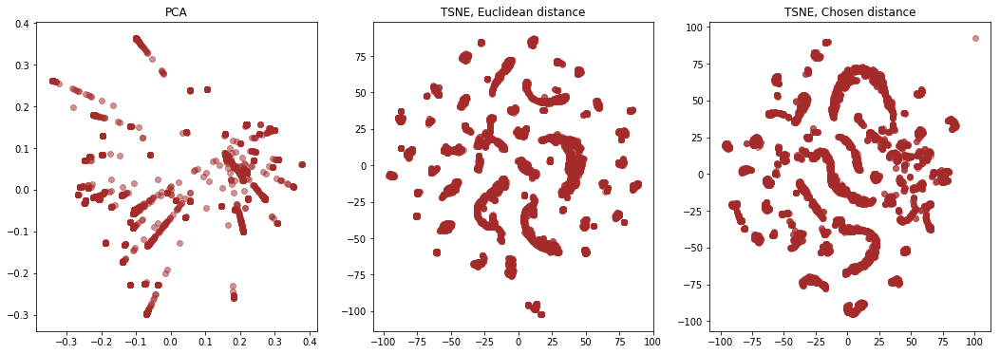

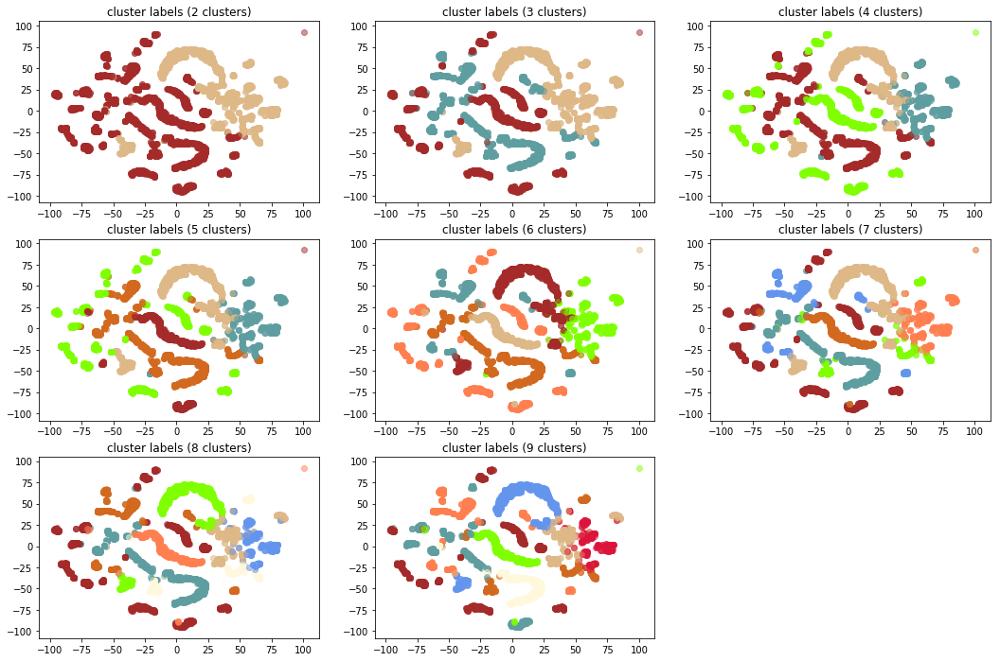

In [39]:
spectra_2D  = build_images_KMeans(spectra, spectrum_columns, spectra_distances, colors, TSNE_learning_rate=500, TSNE_n_iter=1500, TSNE_learning_rate2=300)

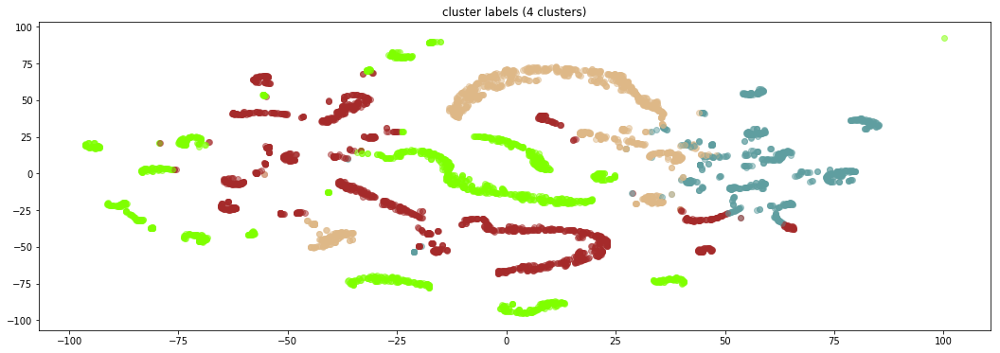

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,KMeans_clusters_4
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,3
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,3
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,1
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,3


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
114,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020537.8+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
279,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.2+413107',b'http://xmm-catalog.irap.omp.eu/source/203057...
288,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031938.2+413138',b'http://xmm-catalog.irap.omp.eu/source/200851...
295,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031942.8+412940',b'http://xmm-catalog.irap.omp.eu/source/200851...
305,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031952.8+413010',b'http://xmm-catalog.irap.omp.eu/source/200851...
313,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J032000.0+413130',b'http://xmm-catalog.irap.omp.eu/source/200851...
353,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041650.7+010610',b'http://xmm-catalog.irap.omp.eu/source/200943...
403,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...
498,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053418.8+220244',b'http://xmm-catalog.irap.omp.eu/source/203127...
543,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053428.5+220237',b'http://xmm-catalog.irap.omp.eu/source/203127...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
11,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.7+640440',b'http://xmm-catalog.irap.omp.eu/source/200962...
14,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.4+640932',b'http://xmm-catalog.irap.omp.eu/source/200962...
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
19,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640822',b'http://xmm-catalog.irap.omp.eu/source/200962...
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...
23,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.7+640658',b'http://xmm-catalog.irap.omp.eu/source/203105...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.108476,0.162035,0.261689,0.145309,0.200634,0.0,0.040768,0.015992,0.010363,0.009728,0.030474,0.000595,0.002123,0.002742,0.003248,0.005823
1,0.205831,0.138743,0.082980,0.167753,0.111194,0.0,0.170669,0.070670,0.025327,0.009682,0.002303,0.000659,0.001857,0.003194,0.003794,0.005342
2,0.145576,0.104535,0.070928,0.110831,0.094986,0.0,0.138412,0.077899,0.067533,0.054668,0.057493,0.004576,0.013259,0.021119,0.020885,0.017300
3,0.036323,0.279706,0.207205,0.150796,0.292329,0.0,0.008827,0.006263,0.004159,0.001565,0.000480,0.000170,0.000898,0.003872,0.003867,0.003540


In [40]:
list_spectra_clusters, centers = print_clusters_structure_KMeans(spectra, spectrum_columns, other_names, spectra_distances, 4, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [41]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    gev_1FGL_Name = (list_spectra_clusters[i])['gev_1FGL_Name'].unique()
    s_MAIN_ID = (list_spectra_clusters[i])['s_MAIN_ID'].unique()
    print(gev_1FGL_Name)
    print(s_MAIN_ID)

0 cluster (#A52A2A)
["b'                  '" "b'1FGL J0205.6+6449 '" "b'1FGL J0222.6+4302 '"
 "b'1FGL J0319.7+4130 '" "b'1FGL J0319.7+1847 '" "b'1FGL J0416.8+0107 '"
 "b'1FGL J0534.5+2200 '" "b'1FGL J0650.7+2503 '" "b'1FGL J0956.5+6938 '"
 "b'1FGL J1000.1+6539 '" "b'1FGL J1103.7-2329 '" "b'1FGL J1221.3+3008 '"
 "b'1FGL J1230.8+1223 '" "b'1FGL J1256.2-0547 '" "b'1FGL J1325.6-4300 '"
 "b'1FGL J1418.7-6057 '" "b'1FGL J1513.2-5904 '" "b'1FGL J1555.7+1111 '"
 "b'1FGL J1714.5-3830c'" "b'1FGL J1718.2-3825 '" "b'1FGL J1745.6-2900c'"
 "b'1FGL J1747.9-2448 '" "b'1FGL J1800.5-2359c'" "b'1FGL J1848.1-0145c'"
 "b'1FGL J1910.9+0906c'" "b'1FGL J1922.9+1411 '" "b'1FGL J2000.0+6508 '"
 "b'1FGL J2001.1+4351 '" "b'1FGL J2015.7+3708 '" "b'1FGL J2202.8+4216 '"
 "b'1FGL J2323.4+5849 '"]
['[]'
 '["b\'[CHP2004] J095549.8+693934\'" "b\'[MTK2001b] 8\'"\r\r\n "b\'[CHP2004] J095637.5+694137\'" "b\'CXOU J095601.7+694308\'"\r\r\n "b\'CXOU J095548.9+694010\'" "b\'CXOU J095527.1+693923\'"\r\r\n "b\'CXOU J095552.8+694

[0.2, 0.17, 0.14, 0.11, 0.08, 0.05, 0.02]


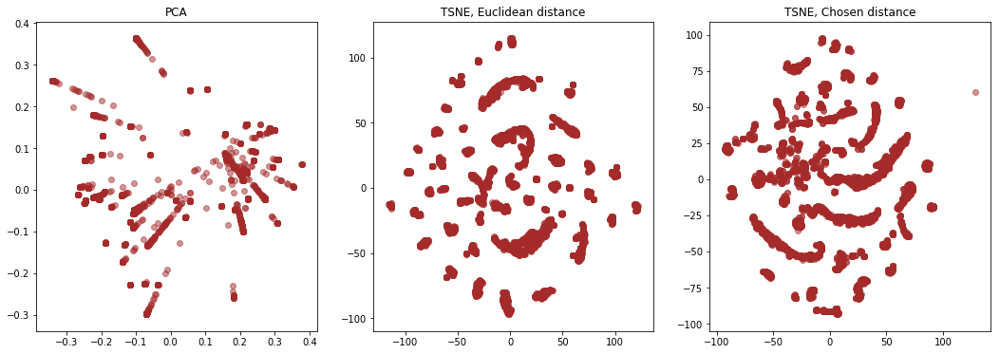

Clustering


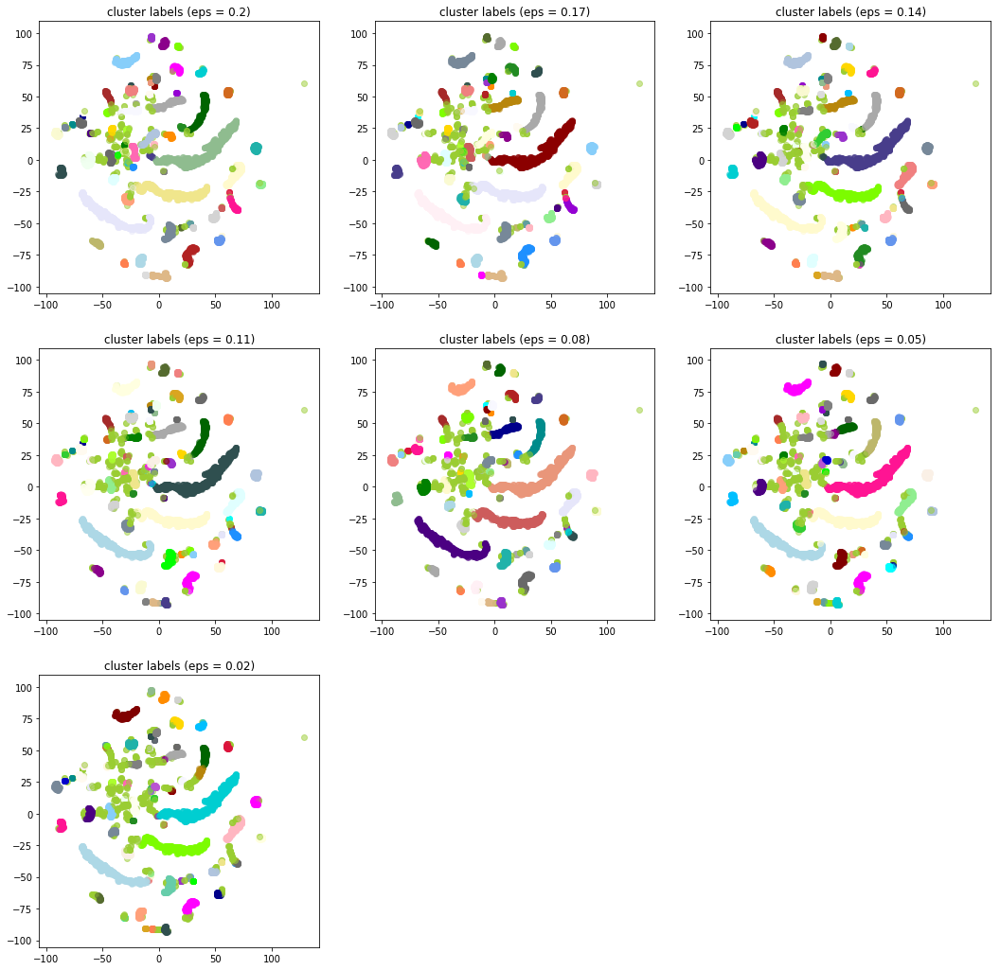

In [42]:
eps_l = [0.01 * i for i in range(20, 0, -3)]
print(eps_l)
spectra_2D = build_images_DBSCAN(spectra, spectrum_columns, spectra_distances, colors, eps_l=eps_l, TSNE_learning_rate=1000, TSNE_n_iter=1500, TSNE_learning_rate2=900)


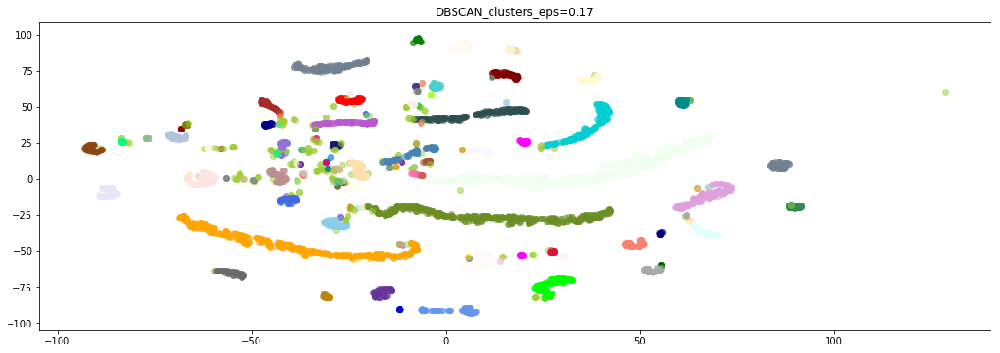

,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,...,gev_1FGL_Name,gev_CLASS1,gev_GLON,gev_GLAT,tev_fermi_names,tev_classes,tev_glat,tev_glon,marked,DBSCAN_clusters_eps=0.17
190,0.000000e+00,0.000000e+00,7.023552e-06,0.000000,0.000075,0.014498,0.216180,0.331050,0.099179,0.322267,...,b'1FGL J0240.5+6113 ',b'HMB ',135.678848,1.086277,b'',b'bin',1.086135,135.675278,1,11
1012,4.865135e-06,1.698195e-05,9.579073e-06,0.000002,0.000000,0.006512,0.225777,0.309700,0.088957,0.355722,...,b'1FGL J1018.6-5856 ',b'HMB ',284.351227,-1.690106,b'1FGL J1018.6-5856',b'bin',-1.779517,284.314087,1,6
3869,5.424061e-07,7.192430e-08,8.977810e-07,0.000023,0.000048,0.007597,0.117056,0.309327,0.034503,0.203525,...,b'1FGL J1826.2-1450 ',b'HMB ',16.885555,-1.293795,b'',b'bin',-1.289216,16.881586,1,109
4378,4.073749e-07,1.218059e-06,1.198334e-05,0.000053,0.000028,0.022407,0.362226,0.111720,0.253923,0.249629,...,b'1FGL J2032.2+4127 ',b'PSR ',80.218597,1.018827,b'',b'unid',1.111117,80.299477,1,122


0 cluster (#A52A2A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
0,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.0+640847',b'http://xmm-catalog.irap.omp.eu/source/200962...
1,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002515.3+640928',b'http://xmm-catalog.irap.omp.eu/source/200962...
2,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.3+640834',b'http://xmm-catalog.irap.omp.eu/source/205111...
3,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.4+640756',b'http://xmm-catalog.irap.omp.eu/source/200962...
4,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.8+641108',b'http://xmm-catalog.irap.omp.eu/source/204123...
5,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002516.9+640658',b'http://xmm-catalog.irap.omp.eu/source/204123...
6,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.3+640454',b'http://xmm-catalog.irap.omp.eu/source/205111...
8,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002518.1+640708',b'http://xmm-catalog.irap.omp.eu/source/200962...
9,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002520.7+640616',b'http://xmm-catalog.irap.omp.eu/source/203105...
10,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002523.6+640917',b'http://xmm-catalog.irap.omp.eu/source/203105...


1 cluster (#DEB887)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
18,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.8+640536',b'http://xmm-catalog.irap.omp.eu/source/203105...
2339,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151346.2-591015',b'http://xmm-catalog.irap.omp.eu/source/203027...


2 cluster (#5F9EA0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
20,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.4+640749',b'http://xmm-catalog.irap.omp.eu/source/200962...
22,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.6+640522',b'http://xmm-catalog.irap.omp.eu/source/205111...


3 cluster (#7FFF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
29,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002529.4+640631',b'http://xmm-catalog.irap.omp.eu/source/204123...
2327,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.9-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...


4 cluster (#D2691E)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
71,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002549.8+640545',b'http://xmm-catalog.irap.omp.eu/source/200962...
76,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.0+640913',b'http://xmm-catalog.irap.omp.eu/source/200962...
82,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002555.2+640641',b'http://xmm-catalog.irap.omp.eu/source/200962...


5 cluster (#FF7F50)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
78,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002552.9+640854',b'http://xmm-catalog.irap.omp.eu/source/200962...
84,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002556.7+640733',b'http://xmm-catalog.irap.omp.eu/source/203105...


6 cluster (#6495ED)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
87,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.3+644233',b'http://xmm-catalog.irap.omp.eu/source/201537...
88,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020507.7+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
89,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020508.2+644949',b'http://xmm-catalog.irap.omp.eu/source/201537...
90,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020509.6+644941',b'http://xmm-catalog.irap.omp.eu/source/201025...
91,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020512.6+644932',b'http://xmm-catalog.irap.omp.eu/source/201025...
92,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020513.3+644951',b'http://xmm-catalog.irap.omp.eu/source/201537...
93,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.0+644938',b'http://xmm-catalog.irap.omp.eu/source/201537...
94,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020514.3+644910',b'http://xmm-catalog.irap.omp.eu/source/201537...
95,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020518.2+644846',b'http://xmm-catalog.irap.omp.eu/source/201025...
96,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020520.8+644952',b'http://xmm-catalog.irap.omp.eu/source/201025...


7 cluster (#FFF8DC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
102,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020526.2+645017',b'http://xmm-catalog.irap.omp.eu/source/201537...
105,b'1FGL J0205.6+6449 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J020529.3+645029',b'http://xmm-catalog.irap.omp.eu/source/201025...


8 cluster (#DC143C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
131,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022216.1+425903',b'http://xmm-catalog.irap.omp.eu/source/200029...
132,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022222.2+425700',b'http://xmm-catalog.irap.omp.eu/source/200029...
133,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022225.5+430409',b'http://xmm-catalog.irap.omp.eu/source/200029...
134,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022228.7+425645',b'http://xmm-catalog.irap.omp.eu/source/200029...
135,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.1+430634',b'http://xmm-catalog.irap.omp.eu/source/200029...
136,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022230.9+430357',b'http://xmm-catalog.irap.omp.eu/source/200029...
137,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022232.7+430446',b'http://xmm-catalog.irap.omp.eu/source/200029...
138,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022236.7+425644',b'http://xmm-catalog.irap.omp.eu/source/200029...
139,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022238.8+430650',b'http://xmm-catalog.irap.omp.eu/source/200029...
141,b'1FGL J0222.6+4302 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J022242.7+430405',b'http://xmm-catalog.irap.omp.eu/source/200029...


9 cluster (#00FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
154,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023224.2+201413',b'http://xmm-catalog.irap.omp.eu/source/206042...
166,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023246.3+201815',b'http://xmm-catalog.irap.omp.eu/source/206042...
185,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023317.3+201245',b'http://xmm-catalog.irap.omp.eu/source/206042...


10 cluster (#00008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
155,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.5+200908',b'http://xmm-catalog.irap.omp.eu/source/206042...
156,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023227.7+201053',b'http://xmm-catalog.irap.omp.eu/source/206042...
157,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023229.1+201103',b'http://xmm-catalog.irap.omp.eu/source/206042...
158,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023230.4+201703',b'http://xmm-catalog.irap.omp.eu/source/206042...
159,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023231.1+201600',b'http://xmm-catalog.irap.omp.eu/source/206042...
160,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023233.0+201352',b'http://xmm-catalog.irap.omp.eu/source/206042...
161,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023237.5+202201',b'http://xmm-catalog.irap.omp.eu/source/206042...
162,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023240.2+202304',b'http://xmm-catalog.irap.omp.eu/source/206042...
163,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023243.3+202100',b'http://xmm-catalog.irap.omp.eu/source/206042...
164,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J023243.6+201201',b'http://xmm-catalog.irap.omp.eu/source/206042...


11 cluster (#008B8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
190,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,1,b'3XMM J024005.3+611247',b'http://xmm-catalog.irap.omp.eu/source/205059...
191,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024008.8+610723',b'http://xmm-catalog.irap.omp.eu/source/202072...
192,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024010.4+611144',b'http://xmm-catalog.irap.omp.eu/source/201124...
193,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024010.8+611213',b'http://xmm-catalog.irap.omp.eu/source/205059...
194,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024011.3+610803',b'http://xmm-catalog.irap.omp.eu/source/205059...
195,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024014.6+610913',b'http://xmm-catalog.irap.omp.eu/source/205059...
196,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024025.4+611525',b'http://xmm-catalog.irap.omp.eu/source/205059...
197,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024025.5+610840',b'http://xmm-catalog.irap.omp.eu/source/205059...
198,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024026.2+611436',b'http://xmm-catalog.irap.omp.eu/source/205059...
199,b'1FGL J0240.5+6113 ',b'HMB ',b'',b'bin',"[""b'LS I +61 303'"" ""b'LS I +61 303'""]",['B0Ve'],1,0,b'3XMM J024026.7+611716',b'http://xmm-catalog.irap.omp.eu/source/205059...


12 cluster (#B8860B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
236,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031611.0+411759',b'http://xmm-catalog.irap.omp.eu/source/201515...
237,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031613.8+411422',b'http://xmm-catalog.irap.omp.eu/source/201515...
238,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031614.1+412536',b'http://xmm-catalog.irap.omp.eu/source/201515...
240,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031618.0+411507',b'http://xmm-catalog.irap.omp.eu/source/201515...
241,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.3+412446',b'http://xmm-catalog.irap.omp.eu/source/201515...
242,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.5+411757',b'http://xmm-catalog.irap.omp.eu/source/201515...
243,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031619.6+411646',b'http://xmm-catalog.irap.omp.eu/source/201515...
244,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031621.8+411714',b'http://xmm-catalog.irap.omp.eu/source/201515...
245,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031631.1+412610',b'http://xmm-catalog.irap.omp.eu/source/201515...
246,b' ',b'rdg ',b'',b'hbl',[],[],0,0,b'3XMM J031637.1+412352',b'http://xmm-catalog.irap.omp.eu/source/201515...


13 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
266,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.3+412927',b'http://xmm-catalog.irap.omp.eu/source/200851...
268,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.0+412950',b'http://xmm-catalog.irap.omp.eu/source/203057...
269,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.5+413706',b'http://xmm-catalog.irap.omp.eu/source/203057...
270,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031923.8+412908',b'http://xmm-catalog.irap.omp.eu/source/200851...
271,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.2+412920',b'http://xmm-catalog.irap.omp.eu/source/203057...
273,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031926.8+412838',b'http://xmm-catalog.irap.omp.eu/source/203057...
274,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.3+413549',b'http://xmm-catalog.irap.omp.eu/source/200851...
275,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.4+412819',b'http://xmm-catalog.irap.omp.eu/source/200851...
278,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.0+413445',b'http://xmm-catalog.irap.omp.eu/source/203057...
284,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031934.4+412954',b'http://xmm-catalog.irap.omp.eu/source/203057...


14 cluster (#006400)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
267,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031921.7+413129',b'http://xmm-catalog.irap.omp.eu/source/200851...
272,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031924.5+413300',b'http://xmm-catalog.irap.omp.eu/source/200851...
280,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.5+413350',b'http://xmm-catalog.irap.omp.eu/source/200851...
282,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031932.4+412931',b'http://xmm-catalog.irap.omp.eu/source/203057...
285,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031935.3+412900',b'http://xmm-catalog.irap.omp.eu/source/200851...


15 cluster (#A9A9A9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
276,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031928.7+413323',b'http://xmm-catalog.irap.omp.eu/source/203057...
281,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031932.0+412954',b'http://xmm-catalog.irap.omp.eu/source/203057...
287,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031938.0+413050',b'http://xmm-catalog.irap.omp.eu/source/200851...
292,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031941.3+413203',b'http://xmm-catalog.irap.omp.eu/source/200851...


16 cluster (#BDB76B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
277,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031929.9+413141',b'http://xmm-catalog.irap.omp.eu/source/200851...
286,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031937.5+413128',b'http://xmm-catalog.irap.omp.eu/source/203057...


17 cluster (#8B008B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
279,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031931.2+413107',b'http://xmm-catalog.irap.omp.eu/source/203057...
291,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031940.7+413218',b'http://xmm-catalog.irap.omp.eu/source/203057...
313,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J032000.0+413130',b'http://xmm-catalog.irap.omp.eu/source/200851...


18 cluster (#556B2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
283,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031933.4+412947',b'http://xmm-catalog.irap.omp.eu/source/200851...
293,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031941.5+413017',b'http://xmm-catalog.irap.omp.eu/source/203057...
301,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031947.5+413210',b'http://xmm-catalog.irap.omp.eu/source/203057...


19 cluster (#FF8C00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
288,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031938.2+413138',b'http://xmm-catalog.irap.omp.eu/source/200851...
305,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031952.8+413010',b'http://xmm-catalog.irap.omp.eu/source/200851...


20 cluster (#9932CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
300,b'1FGL J0319.7+4130 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J031946.9+413226',b'http://xmm-catalog.irap.omp.eu/source/200851...
1878,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123044.3+122052',b'http://xmm-catalog.irap.omp.eu/source/201141...


21 cluster (#8B0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
332,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032015.2+185052',b'http://xmm-catalog.irap.omp.eu/source/203001...
335,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032016.4+185143',b'http://xmm-catalog.irap.omp.eu/source/203001...
340,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032018.1+184914',b'http://xmm-catalog.irap.omp.eu/source/203001...
341,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.6+184826',b'http://xmm-catalog.irap.omp.eu/source/203001...
342,b'1FGL J0319.7+1847 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J032019.9+185315',b'http://xmm-catalog.irap.omp.eu/source/203001...


22 cluster (#E9967A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
343,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034851.9-115713',b'http://xmm-catalog.irap.omp.eu/source/200943...
344,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034852.2-115600',b'http://xmm-catalog.irap.omp.eu/source/200943...
345,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J034919.1-120548',b'http://xmm-catalog.irap.omp.eu/source/200943...


23 cluster (#8FBC8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
347,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010625',b'http://xmm-catalog.irap.omp.eu/source/200943...
348,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041627.7+010030',b'http://xmm-catalog.irap.omp.eu/source/200943...
349,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041631.0+005746',b'http://xmm-catalog.irap.omp.eu/source/201611...
350,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041633.6+010627',b'http://xmm-catalog.irap.omp.eu/source/200943...
351,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041641.5+011100',b'http://xmm-catalog.irap.omp.eu/source/201611...
352,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041644.8+011007',b'http://xmm-catalog.irap.omp.eu/source/200943...
355,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041656.6+005801',b'http://xmm-catalog.irap.omp.eu/source/200943...
356,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041702.2+011139',b'http://xmm-catalog.irap.omp.eu/source/201611...
357,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041711.9+005913',b'http://xmm-catalog.irap.omp.eu/source/201611...
358,b'1FGL J0416.8+0107 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J041716.1+010856',b'http://xmm-catalog.irap.omp.eu/source/201611...


24 cluster (#483D8B)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
361,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052402.0-693136',b'http://xmm-catalog.irap.omp.eu/source/201571...
362,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052407.1-693952',b'http://xmm-catalog.irap.omp.eu/source/201293...
365,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052426.2-693613',b'http://xmm-catalog.irap.omp.eu/source/201251...
368,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052441.9-693432',b'http://xmm-catalog.irap.omp.eu/source/201293...
369,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052442.1-694142',b'http://xmm-catalog.irap.omp.eu/source/206907...
370,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052443.0-693938',b'http://xmm-catalog.irap.omp.eu/source/201375...
371,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052444.0-694058',b'http://xmm-catalog.irap.omp.eu/source/206907...
372,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052449.2-693319',b'http://xmm-catalog.irap.omp.eu/source/201251...
373,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052450.0-693455',b'http://xmm-catalog.irap.omp.eu/source/201293...


25 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
377,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052455.5-693902',b'http://xmm-catalog.irap.omp.eu/source/201573...
380,b' ',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J052458.0-693909',b'http://xmm-catalog.irap.omp.eu/source/201293...


26 cluster (#2F4F4F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
384,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053403.9+215451',b'http://xmm-catalog.irap.omp.eu/source/204125...
385,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
387,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
389,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
391,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
393,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
395,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
397,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
399,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
401,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...


27 cluster (#00CED1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
386,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.3+215533',b'http://xmm-catalog.irap.omp.eu/source/203127...
388,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053404.7+215710',b'http://xmm-catalog.irap.omp.eu/source/201537...
390,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.0+220802',b'http://xmm-catalog.irap.omp.eu/source/203127...
392,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.4+215617',b'http://xmm-catalog.irap.omp.eu/source/201609...
394,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.8+215838',b'http://xmm-catalog.irap.omp.eu/source/206111...
396,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215825',b'http://xmm-catalog.irap.omp.eu/source/204125...
398,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053405.9+215631',b'http://xmm-catalog.irap.omp.eu/source/206111...
400,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.0+220654',b'http://xmm-catalog.irap.omp.eu/source/203127...
402,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+215424',b'http://xmm-catalog.irap.omp.eu/source/201223...
404,b'1FGL J0534.5+2200 ',b'PSR ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...


28 cluster (#9400D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
403,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053406.1+220024',b'http://xmm-catalog.irap.omp.eu/source/206111...
626,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053444.2+220521',b'http://xmm-catalog.irap.omp.eu/source/206111...


29 cluster (#FF1493)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
519,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053422.4+215823',b'http://xmm-catalog.irap.omp.eu/source/203127...
551,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053429.6+220636',b'http://xmm-catalog.irap.omp.eu/source/201223...
563,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053430.9+215457',b'http://xmm-catalog.irap.omp.eu/source/201223...
573,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053432.0+215505',b'http://xmm-catalog.irap.omp.eu/source/201375...


30 cluster (#00BFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
610,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053440.7+220258',b'http://xmm-catalog.irap.omp.eu/source/203127...
618,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053441.9+215847',b'http://xmm-catalog.irap.omp.eu/source/203127...
688,b' ',b'PWN ',b'',b'psr',[],[],0,0,b'3XMM J053455.3+215841',b'http://xmm-catalog.irap.omp.eu/source/204125...


31 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
762,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055010.9-321225',b'http://xmm-catalog.irap.omp.eu/source/201422...
763,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.5-322308',b'http://xmm-catalog.irap.omp.eu/source/201118...
764,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055012.6-321534',b'http://xmm-catalog.irap.omp.eu/source/201422...
765,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055016.8-321645',b'http://xmm-catalog.irap.omp.eu/source/201422...
766,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055017.4-322200',b'http://xmm-catalog.irap.omp.eu/source/201422...
767,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055018.0-321242',b'http://xmm-catalog.irap.omp.eu/source/201422...
769,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.1-321441',b'http://xmm-catalog.irap.omp.eu/source/201422...
770,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055019.6-321114',b'http://xmm-catalog.irap.omp.eu/source/201422...
771,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055020.5-322033',b'http://xmm-catalog.irap.omp.eu/source/201422...
772,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055021.6-321648',b'http://xmm-catalog.irap.omp.eu/source/201118...


32 cluster (#696969)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
797,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055039.8-321516',b'http://xmm-catalog.irap.omp.eu/source/201118...
799,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055041.1-321710',b'http://xmm-catalog.irap.omp.eu/source/201422...


33 cluster (#1E90FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
805,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055042.9-321640',b'http://xmm-catalog.irap.omp.eu/source/202059...
4213,b'1FGL J2000.0+6508 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J195959.9+650854',b'http://xmm-catalog.irap.omp.eu/source/200943...


34 cluster (#B22222)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
807,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055044.6-321422',b'http://xmm-catalog.irap.omp.eu/source/201422...
810,b' ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J055046.3-321714',b'http://xmm-catalog.irap.omp.eu/source/201422...


35 cluster (#FFFAF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
834,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175211',b'http://xmm-catalog.irap.omp.eu/source/201111...
835,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.2+175112',b'http://xmm-catalog.irap.omp.eu/source/201111...
836,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063326.9+174240',b'http://xmm-catalog.irap.omp.eu/source/201111...
837,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063328.2+173953',b'http://xmm-catalog.irap.omp.eu/source/201111...
838,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.0+174839',b'http://xmm-catalog.irap.omp.eu/source/201111...
839,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.1+174916',b'http://xmm-catalog.irap.omp.eu/source/201111...
840,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063329.8+174134',b'http://xmm-catalog.irap.omp.eu/source/205504...
841,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.2+175301',b'http://xmm-catalog.irap.omp.eu/source/201111...
842,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063330.9+175034',b'http://xmm-catalog.irap.omp.eu/source/201111...
843,b'1FGL J0633.9+1746 ',b'PSR ',b'',"b'psr,pwn'",[],[],0,0,b'3XMM J063332.0+174054',b'http://xmm-catalog.irap.omp.eu/source/201111...


36 cluster (#228B22)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
890,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065043.3+250334',b'http://xmm-catalog.irap.omp.eu/source/200943...
891,b'1FGL J0650.7+2503 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J065046.3+250204',b'http://xmm-catalog.irap.omp.eu/source/200943...


37 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
893,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072131.2+712625',b'http://xmm-catalog.irap.omp.eu/source/201504...
894,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.2+712516',b'http://xmm-catalog.irap.omp.eu/source/201504...
895,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072135.7+712725',b'http://xmm-catalog.irap.omp.eu/source/201504...
896,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.3+712105',b'http://xmm-catalog.irap.omp.eu/source/200128...
897,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.6+712248',b'http://xmm-catalog.irap.omp.eu/source/201504...
898,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072139.8+711800',b'http://xmm-catalog.irap.omp.eu/source/201504...
899,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072146.0+712541',b'http://xmm-catalog.irap.omp.eu/source/201504...
900,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072147.0+712211',b'http://xmm-catalog.irap.omp.eu/source/200128...
901,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072148.5+712601',b'http://xmm-catalog.irap.omp.eu/source/201504...
902,b'1FGL J0721.9+7120 ',b'BLL ',b'',b'ibl',[],[],0,0,b'3XMM J072149.3+712144',b'http://xmm-catalog.irap.omp.eu/source/200128...


38 cluster (#DCDCDC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
911,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083240.5-451222',b'http://xmm-catalog.irap.omp.eu/source/206720...
912,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J083241.3-451401',b'http://xmm-catalog.irap.omp.eu/source/206720...


39 cluster (#F8F8FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
913,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095503.8+694329',b'http://xmm-catalog.irap.omp.eu/source/201122...
914,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.0+693600',b'http://xmm-catalog.irap.omp.eu/source/206578...
915,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.1+694442',b'http://xmm-catalog.irap.omp.eu/source/201122...
916,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095505.8+693720',b'http://xmm-catalog.irap.omp.eu/source/206578...
917,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095507.1+693701',b'http://xmm-catalog.irap.omp.eu/source/202060...
918,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.1+693549',b'http://xmm-catalog.irap.omp.eu/source/201122...
919,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095509.9+694330',b'http://xmm-catalog.irap.omp.eu/source/201122...
920,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095510.4+693954',b'http://xmm-catalog.irap.omp.eu/source/201122...
921,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095512.3+694639',b'http://xmm-catalog.irap.omp.eu/source/202060...
922,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095514.8+693613',b'http://xmm-catalog.irap.omp.eu/source/201122...


40 cluster (#FFD700)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
942,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095533.5+693425',b'http://xmm-catalog.irap.omp.eu/source/206578...
967,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.7+694233',b'http://xmm-catalog.irap.omp.eu/source/206578...


41 cluster (#DAA520)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
951,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095542.9+694227',b'http://xmm-catalog.irap.omp.eu/source/205605...
957,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095547.9+694202',b'http://xmm-catalog.irap.omp.eu/source/205601...
973,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095555.6+693915',b'http://xmm-catalog.irap.omp.eu/source/206578...


42 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
960,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095549.3+694224',b'http://xmm-catalog.irap.omp.eu/source/202060...
966,b'1FGL J0956.5+6938 ',b'sbg ',"b'1FGL J0956.5+6938,2FGL J0955.9+6936,3FGL J09...",b'galaxy',"[""b'[CHP2004] J095549.8+693934'"" ""b'[MTK2001b]...",['B0Ve'],2,0,b'3XMM J095551.5+693939',b'http://xmm-catalog.irap.omp.eu/source/206578...


43 cluster (#008000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
977,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095810.3+652720',b'http://xmm-catalog.irap.omp.eu/source/203025...
978,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095814.8+652801',b'http://xmm-catalog.irap.omp.eu/source/203025...
979,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095827.2+653540',b'http://xmm-catalog.irap.omp.eu/source/205024...
980,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095828.3+653424',b'http://xmm-catalog.irap.omp.eu/source/205024...
981,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095833.0+652835',b'http://xmm-catalog.irap.omp.eu/source/205024...
982,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095837.5+653505',b'http://xmm-catalog.irap.omp.eu/source/205024...
983,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095840.4+654057',b'http://xmm-catalog.irap.omp.eu/source/205024...
984,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+653449',b'http://xmm-catalog.irap.omp.eu/source/203025...
985,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.6+652848',b'http://xmm-catalog.irap.omp.eu/source/203025...
986,b'1FGL J1000.1+6539 ',b'bll ',b'',b'blazar',[],[],0,0,b'3XMM J095842.9+652711',b'http://xmm-catalog.irap.omp.eu/source/205024...


44 cluster (#ADFF2F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1004,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101441.7+493104',b'http://xmm-catalog.irap.omp.eu/source/202063...
1005,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101451.2+492337',b'http://xmm-catalog.irap.omp.eu/source/202063...
1006,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.1+492522',b'http://xmm-catalog.irap.omp.eu/source/202063...
1007,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101459.4+493047',b'http://xmm-catalog.irap.omp.eu/source/202063...
1008,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101504.4+492653',b'http://xmm-catalog.irap.omp.eu/source/202063...
1009,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101508.0+493153',b'http://xmm-catalog.irap.omp.eu/source/202063...
1010,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101509.2+492738',b'http://xmm-catalog.irap.omp.eu/source/202063...
1011,b'1FGL J1015.1+4927 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J101514.5+493252',b'http://xmm-catalog.irap.omp.eu/source/202063...


45 cluster (#808080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1059,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110306.4-233533',b'http://xmm-catalog.irap.omp.eu/source/202059...
1060,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.1-232754',b'http://xmm-catalog.irap.omp.eu/source/202059...
1061,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110312.6-233621',b'http://xmm-catalog.irap.omp.eu/source/202059...
1062,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.1-233448',b'http://xmm-catalog.irap.omp.eu/source/202059...
1063,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110319.4-232239',b'http://xmm-catalog.irap.omp.eu/source/202059...
1064,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110327.9-233631',b'http://xmm-catalog.irap.omp.eu/source/202059...
1066,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110337.5-232223',b'http://xmm-catalog.irap.omp.eu/source/202059...
1068,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110338.4-232257',b'http://xmm-catalog.irap.omp.eu/source/202059...
1069,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110345.0-232220',b'http://xmm-catalog.irap.omp.eu/source/202059...
1070,b'1FGL J1103.7-2329 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J110346.7-232359',b'http://xmm-catalog.irap.omp.eu/source/202059...


46 cluster (#F0FFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1072,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+380539',b'http://xmm-catalog.irap.omp.eu/source/200992...
1073,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110359.7+381102',b'http://xmm-catalog.irap.omp.eu/source/201539...
1074,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.3+380832',b'http://xmm-catalog.irap.omp.eu/source/201589...
1075,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.6+380527',b'http://xmm-catalog.irap.omp.eu/source/201365...
1076,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110400.9+381512',b'http://xmm-catalog.irap.omp.eu/source/206709...
1077,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.1+380536',b'http://xmm-catalog.irap.omp.eu/source/204110...
1078,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.4+381536',b'http://xmm-catalog.irap.omp.eu/source/201589...
1079,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.6+380540',b'http://xmm-catalog.irap.omp.eu/source/201365...
1080,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+381101',b'http://xmm-catalog.irap.omp.eu/source/201539...
1081,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110401.8+380547',b'http://xmm-catalog.irap.omp.eu/source/201539...


47 cluster (#FF69B4)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1281,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110420.7+381358',b'http://xmm-catalog.irap.omp.eu/source/204110...
1335,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110424.3+381258',b'http://xmm-catalog.irap.omp.eu/source/201539...
1338,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110424.6+381319',b'http://xmm-catalog.irap.omp.eu/source/201589...
1353,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110425.8+381143',b'http://xmm-catalog.irap.omp.eu/source/201365...
1359,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110426.4+381247',b'http://xmm-catalog.irap.omp.eu/source/201539...
1378,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110427.6+381303',b'http://xmm-catalog.irap.omp.eu/source/201589...
1395,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110428.4+381237',b'http://xmm-catalog.irap.omp.eu/source/204110...
1443,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110432.7+381112',b'http://xmm-catalog.irap.omp.eu/source/204110...


48 cluster (#CD5C5C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1313,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110422.7+380959',b'http://xmm-catalog.irap.omp.eu/source/204110...
1317,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110423.1+381052',b'http://xmm-catalog.irap.omp.eu/source/201589...
1326,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110423.7+381254',b'http://xmm-catalog.irap.omp.eu/source/201365...
1345,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110425.2+381153',b'http://xmm-catalog.irap.omp.eu/source/201365...
1396,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110428.5+381134',b'http://xmm-catalog.irap.omp.eu/source/205609...
1402,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110429.4+381138',b'http://xmm-catalog.irap.omp.eu/source/206563...
1438,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110432.2+381121',b'http://xmm-catalog.irap.omp.eu/source/206563...
1470,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110435.1+381331',b'http://xmm-catalog.irap.omp.eu/source/201365...


49 cluster (#4B0082)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1323,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110423.4+381157',b'http://xmm-catalog.irap.omp.eu/source/201365...
1405,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110429.7+381257',b'http://xmm-catalog.irap.omp.eu/source/201589...


50 cluster (#FFFFF0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1341,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110424.7+381117',b'http://xmm-catalog.irap.omp.eu/source/200992...
1432,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110431.8+381352',b'http://xmm-catalog.irap.omp.eu/source/201365...


51 cluster (#F0E68C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1350,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110425.7+381201',b'http://xmm-catalog.irap.omp.eu/source/201589...
1392,b'1FGL J1104.4+3812 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J110428.0+381140',b'http://xmm-catalog.irap.omp.eu/source/201365...


52 cluster (#E6E6FA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1699,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111843.3-612529',b'http://xmm-catalog.irap.omp.eu/source/201507...
1700,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111843.8-612328',b'http://xmm-catalog.irap.omp.eu/source/206727...
1701,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111846.3-612429',b'http://xmm-catalog.irap.omp.eu/source/201507...
1702,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111847.6-613351',b'http://xmm-catalog.irap.omp.eu/source/206727...
1703,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111850.1-612223',b'http://xmm-catalog.irap.omp.eu/source/206727...
1704,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111850.7-612133',b'http://xmm-catalog.irap.omp.eu/source/206727...
1705,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111851.5-612450',b'http://xmm-catalog.irap.omp.eu/source/201507...
1706,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111853.1-613345',b'http://xmm-catalog.irap.omp.eu/source/201507...
1707,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111853.5-613458',b'http://xmm-catalog.irap.omp.eu/source/201507...
1708,b'1FGL J1119.4-6127c',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J111855.0-612354',b'http://xmm-catalog.irap.omp.eu/source/201507...


53 cluster (#FFF0F5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1762,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113610.1+700256',b'http://xmm-catalog.irap.omp.eu/source/200941...
1765,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113627.4+700532',b'http://xmm-catalog.irap.omp.eu/source/200941...
1766,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113628.1+700431',b'http://xmm-catalog.irap.omp.eu/source/200941...
1768,b'1FGL J1136.6+7009 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J113640.3+700542',b'http://xmm-catalog.irap.omp.eu/source/200941...


54 cluster (#7CFC00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1769,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121755.6+300026',b'http://xmm-catalog.irap.omp.eu/source/201091...
1770,b'1FGL J1217.7+3007 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J121819.6+300010',b'http://xmm-catalog.irap.omp.eu/source/201091...


55 cluster (#FFFACD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1771,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122102.5+281609',b'http://xmm-catalog.irap.omp.eu/source/201048...
1772,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+280805',b'http://xmm-catalog.irap.omp.eu/source/201048...
1773,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.3+281040',b'http://xmm-catalog.irap.omp.eu/source/201048...
1774,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122103.4+280846',b'http://xmm-catalog.irap.omp.eu/source/201048...
1775,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.0+281518',b'http://xmm-catalog.irap.omp.eu/source/201048...
1776,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122107.9+281618',b'http://xmm-catalog.irap.omp.eu/source/201048...
1777,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122108.2+281215',b'http://xmm-catalog.irap.omp.eu/source/201048...
1778,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.5+282103',b'http://xmm-catalog.irap.omp.eu/source/205022...
1779,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.6+280954',b'http://xmm-catalog.irap.omp.eu/source/205022...
1780,b'1FGL J1221.5+2814 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J122109.9+281118',b'http://xmm-catalog.irap.omp.eu/source/201048...


56 cluster (#ADD8E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1783,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122112.6+300637',b'http://xmm-catalog.irap.omp.eu/source/201118...
1785,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.3+300537',b'http://xmm-catalog.irap.omp.eu/source/201118...
1786,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122114.4+300651',b'http://xmm-catalog.irap.omp.eu/source/201118...
1787,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122115.1+300558',b'http://xmm-catalog.irap.omp.eu/source/201118...
1792,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122118.2+301543',b'http://xmm-catalog.irap.omp.eu/source/201118...
1794,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122120.2+301611',b'http://xmm-catalog.irap.omp.eu/source/201118...
1805,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122127.8+301438',b'http://xmm-catalog.irap.omp.eu/source/201118...
1806,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122128.7+301513',b'http://xmm-catalog.irap.omp.eu/source/201118...
1823,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122144.3+300547',b'http://xmm-catalog.irap.omp.eu/source/201118...
1829,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122148.8+300416',b'http://xmm-catalog.irap.omp.eu/source/201118...


57 cluster (#F08080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1800,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122122.7+300932',b'http://xmm-catalog.irap.omp.eu/source/201118...
1801,b'1FGL J1221.3+3008 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J122124.2+301118',b'http://xmm-catalog.irap.omp.eu/source/201118...


58 cluster (#E0FFFF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1836,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.7+122645',b'http://xmm-catalog.irap.omp.eu/source/201141...
1839,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122656',b'http://xmm-catalog.irap.omp.eu/source/202009...
1840,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122819',b'http://xmm-catalog.irap.omp.eu/source/202009...
1841,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123027.9+122908',b'http://xmm-catalog.irap.omp.eu/source/202009...
1842,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122218',b'http://xmm-catalog.irap.omp.eu/source/205518...
1843,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.2+122507',b'http://xmm-catalog.irap.omp.eu/source/202009...
1844,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.5+121755',b'http://xmm-catalog.irap.omp.eu/source/206032...
1845,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123028.9+122914',b'http://xmm-catalog.irap.omp.eu/source/201141...
1846,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123029.0+123128',b'http://xmm-catalog.irap.omp.eu/source/206032...
1847,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123029.4+122503',b'http://xmm-catalog.irap.omp.eu/source/201141...


59 cluster (#FAFAD2)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1837,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.8+123115',b'http://xmm-catalog.irap.omp.eu/source/205518...
1854,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123032.9+121731',b'http://xmm-catalog.irap.omp.eu/source/205518...
1856,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123035.1+122717',b'http://xmm-catalog.irap.omp.eu/source/202009...
1859,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123037.3+122035',b'http://xmm-catalog.irap.omp.eu/source/202009...
1906,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123058.7+121736',b'http://xmm-catalog.irap.omp.eu/source/201141...
1912,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123100.3+121744',b'http://xmm-catalog.irap.omp.eu/source/202009...
1941,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123119.3+122422',b'http://xmm-catalog.irap.omp.eu/source/201141...
1942,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123120.7+123114',b'http://xmm-catalog.irap.omp.eu/source/206032...


60 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1838,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123026.9+122101',b'http://xmm-catalog.irap.omp.eu/source/205518...
1896,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123054.5+123000',b'http://xmm-catalog.irap.omp.eu/source/201060...


61 cluster (#90EE90)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1851,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123031.3+122341',b'http://xmm-catalog.irap.omp.eu/source/205518...
1919,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123101.6+122335',b'http://xmm-catalog.irap.omp.eu/source/201141...


62 cluster (#D3D3D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1866,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123039.2+122458',b'http://xmm-catalog.irap.omp.eu/source/202009...
1884,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123046.5+122551',b'http://xmm-catalog.irap.omp.eu/source/201141...


63 cluster (#FFB6C1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1867,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123039.7+122448',b'http://xmm-catalog.irap.omp.eu/source/201141...
1890,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123049.3+122100',b'http://xmm-catalog.irap.omp.eu/source/202009...
1894,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123053.7+122034',b'http://xmm-catalog.irap.omp.eu/source/202009...


64 cluster (#FFA07A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1869,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123040.9+122918',b'http://xmm-catalog.irap.omp.eu/source/201060...
1916,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123100.8+121911',b'http://xmm-catalog.irap.omp.eu/source/201141...


65 cluster (#20B2AA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1870,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123041.3+122525',b'http://xmm-catalog.irap.omp.eu/source/202009...
1877,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123043.6+122618',b'http://xmm-catalog.irap.omp.eu/source/202009...
1883,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123046.3+122112',b'http://xmm-catalog.irap.omp.eu/source/202009...
1897,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123054.5+122131',b'http://xmm-catalog.irap.omp.eu/source/201141...
1898,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123055.0+121808',b'http://xmm-catalog.irap.omp.eu/source/202009...
1945,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123122.3+122936',b'http://xmm-catalog.irap.omp.eu/source/205518...


66 cluster (#87CEFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1873,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123042.8+122551',b'http://xmm-catalog.irap.omp.eu/source/202009...
1887,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123047.6+122740',b'http://xmm-catalog.irap.omp.eu/source/202009...


67 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1875,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123043.1+122236',b'http://xmm-catalog.irap.omp.eu/source/202009...
1923,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123104.2+122851',b'http://xmm-catalog.irap.omp.eu/source/201060...


68 cluster (#778899)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1901,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123056.1+122240',b'http://xmm-catalog.irap.omp.eu/source/201141...
1943,b'1FGL J1230.8+1223 ',b'rdg ',b'',b'fri',[],[],0,0,b'3XMM J123122.1+121735',b'http://xmm-catalog.irap.omp.eu/source/205518...


69 cluster (#B0C4DE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
1949,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125543.1-054058',b'http://xmm-catalog.irap.omp.eu/source/205560...
1950,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125544.2-055341',b'http://xmm-catalog.irap.omp.eu/source/206516...
1951,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125545.0-055206',b'http://xmm-catalog.irap.omp.eu/source/206516...
1952,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125548.8-054447',b'http://xmm-catalog.irap.omp.eu/source/206516...
1953,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.1-054257',b'http://xmm-catalog.irap.omp.eu/source/205560...
1954,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125551.5-054829',b'http://xmm-catalog.irap.omp.eu/source/205560...
1955,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.2-055101',b'http://xmm-catalog.irap.omp.eu/source/205560...
1956,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-055359',b'http://xmm-catalog.irap.omp.eu/source/206516...
1957,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125552.6-054934',b'http://xmm-catalog.irap.omp.eu/source/205560...
1958,b'1FGL J1256.2-0547 ',b'FSRQ ',b'',b'fsrq',[],[],0,0,b'3XMM J125553.9-055230',b'http://xmm-catalog.irap.omp.eu/source/206516...


70 cluster (#FFFFE0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2002,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130234.9-630754',b'http://xmm-catalog.irap.omp.eu/source/203023...
2003,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130242.1-631310',b'http://xmm-catalog.irap.omp.eu/source/203034...
2004,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130244.3-630716',b'http://xmm-catalog.irap.omp.eu/source/203034...
2005,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130245.6-631532',b'http://xmm-catalog.irap.omp.eu/source/203034...
2006,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130246.7-631503',b'http://xmm-catalog.irap.omp.eu/source/203034...
2007,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130247.2-630647',b'http://xmm-catalog.irap.omp.eu/source/203034...
2008,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.1-631353',b'http://xmm-catalog.irap.omp.eu/source/203034...
2009,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130249.4-631216',b'http://xmm-catalog.irap.omp.eu/source/203023...
2010,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.1-630715',b'http://xmm-catalog.irap.omp.eu/source/203023...
2011,b' ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J130253.4-630832',b'http://xmm-catalog.irap.omp.eu/source/203034...


71 cluster (#00FF00)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2017,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132459.9-430841',b'http://xmm-catalog.irap.omp.eu/source/207240...
2018,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132501.0-430643',b'http://xmm-catalog.irap.omp.eu/source/200936...
2019,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132502.7-430243',b'http://xmm-catalog.irap.omp.eu/source/200936...
2020,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132503.1-425623',b'http://xmm-catalog.irap.omp.eu/source/200936...
2021,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.5-430407',b'http://xmm-catalog.irap.omp.eu/source/200936...
2022,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.6-430426',b'http://xmm-catalog.irap.omp.eu/source/200936...
2023,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132504.8-430436',b'http://xmm-catalog.irap.omp.eu/source/200936...
2024,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.0-430133',b'http://xmm-catalog.irap.omp.eu/source/200936...
2025,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.7-430433',b'http://xmm-catalog.irap.omp.eu/source/207240...
2026,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132505.8-425539',b'http://xmm-catalog.irap.omp.eu/source/207240...


72 cluster (#32CD32)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2103,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.4-430025',b'http://xmm-catalog.irap.omp.eu/source/207240...
2104,b'1FGL J1325.6-4300 ',b'RDG ',b'',b'fri',[],[],0,0,b'3XMM J132533.7-430021',b'http://xmm-catalog.irap.omp.eu/source/207240...


73 cluster (#FAF0E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2148,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135611.5-642817',b'http://xmm-catalog.irap.omp.eu/source/206032...
2149,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.1-642434',b'http://xmm-catalog.irap.omp.eu/source/206032...
2150,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135612.5-642656',b'http://xmm-catalog.irap.omp.eu/source/206032...
2151,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135615.6-642325',b'http://xmm-catalog.irap.omp.eu/source/206032...
2152,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135619.8-642501',b'http://xmm-catalog.irap.omp.eu/source/203069...
2153,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.0-643226',b'http://xmm-catalog.irap.omp.eu/source/206032...
2154,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135621.6-642949',b'http://xmm-catalog.irap.omp.eu/source/206032...
2155,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135624.4-643101',b'http://xmm-catalog.irap.omp.eu/source/206032...
2156,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135628.7-642250',b'http://xmm-catalog.irap.omp.eu/source/203069...
2157,b' ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J135642.1-642400',b'http://xmm-catalog.irap.omp.eu/source/203069...


74 cluster (#FF00FF)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2165,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141813.4-610150',b'http://xmm-catalog.irap.omp.eu/source/205557...
2166,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141815.0-605943',b'http://xmm-catalog.irap.omp.eu/source/205557...
2167,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141825.9-610019',b'http://xmm-catalog.irap.omp.eu/source/205557...
2168,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141826.7-605355',b'http://xmm-catalog.irap.omp.eu/source/205557...
2169,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605924',b'http://xmm-catalog.irap.omp.eu/source/201511...
2170,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141827.8-605117',b'http://xmm-catalog.irap.omp.eu/source/205557...
2171,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141829.2-605849',b'http://xmm-catalog.irap.omp.eu/source/205557...
2172,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141831.7-605824',b'http://xmm-catalog.irap.omp.eu/source/201511...
2173,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141836.8-605907',b'http://xmm-catalog.irap.omp.eu/source/205557...
2174,b'1FGL J1418.7-6057 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J141837.8-605252',b'http://xmm-catalog.irap.omp.eu/source/205557...


75 cluster (#800000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2198,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142807.6+423631',b'http://xmm-catalog.irap.omp.eu/source/201118...
2199,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142808.0+424155',b'http://xmm-catalog.irap.omp.eu/source/201118...
2200,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142809.6+423329',b'http://xmm-catalog.irap.omp.eu/source/201118...
2201,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142811.5+424628',b'http://xmm-catalog.irap.omp.eu/source/201657...
2202,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142812.7+423726',b'http://xmm-catalog.irap.omp.eu/source/201118...
2203,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142813.4+423756',b'http://xmm-catalog.irap.omp.eu/source/201118...
2204,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142814.4+424055',b'http://xmm-catalog.irap.omp.eu/source/201118...
2205,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142815.4+424701',b'http://xmm-catalog.irap.omp.eu/source/203101...
2206,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142816.0+423604',b'http://xmm-catalog.irap.omp.eu/source/201118...
2207,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142818.2+424658',b'http://xmm-catalog.irap.omp.eu/source/201657...


76 cluster (#66CDAA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2224,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142826.0+424112',b'http://xmm-catalog.irap.omp.eu/source/201118...
2266,b'1FGL J1428.7+4239 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J142902.7+424642',b'http://xmm-catalog.irap.omp.eu/source/203101...


77 cluster (#0000CD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2270,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145903.3-605941',b'http://xmm-catalog.irap.omp.eu/source/206550...
2271,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145903.3-605401',b'http://xmm-catalog.irap.omp.eu/source/206550...
2272,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145904.4-610008',b'http://xmm-catalog.irap.omp.eu/source/206550...
2273,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145908.9-605531',b'http://xmm-catalog.irap.omp.eu/source/206550...
2274,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145919.7-605500',b'http://xmm-catalog.irap.omp.eu/source/206550...
2275,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145920.1-605350',b'http://xmm-catalog.irap.omp.eu/source/206550...
2276,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145928.0-605122',b'http://xmm-catalog.irap.omp.eu/source/206550...
2277,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145930.0-605318',b'http://xmm-catalog.irap.omp.eu/source/206550...
2278,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145933.2-605415',b'http://xmm-catalog.irap.omp.eu/source/206550...
2279,b'1FGL J1459.4-6053 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J145936.4-605115',b'http://xmm-catalog.irap.omp.eu/source/206550...


78 cluster (#BA55D3)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2285,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.0-590238',b'http://xmm-catalog.irap.omp.eu/source/203125...
2286,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.2-590213',b'http://xmm-catalog.irap.omp.eu/source/202070...
2287,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.3-590738',b'http://xmm-catalog.irap.omp.eu/source/202070...
2288,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.6-590230',b'http://xmm-catalog.irap.omp.eu/source/201281...
2289,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151327.9-590423',b'http://xmm-catalog.irap.omp.eu/source/203027...
2290,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151328.1-590747',b'http://xmm-catalog.irap.omp.eu/source/202070...
2291,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151329.2-590308',b'http://xmm-catalog.irap.omp.eu/source/203027...
2292,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.2-590358',b'http://xmm-catalog.irap.omp.eu/source/202070...
2293,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151330.9-590805',b'http://xmm-catalog.irap.omp.eu/source/202070...
2294,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151332.4-590123',b'http://xmm-catalog.irap.omp.eu/source/201281...


79 cluster (#9370DB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2302,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151335.7-591601',b'http://xmm-catalog.irap.omp.eu/source/201281...
2304,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151336.0-591303',b'http://xmm-catalog.irap.omp.eu/source/203125...
2305,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151337.2-591550',b'http://xmm-catalog.irap.omp.eu/source/203027...
2312,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.3-590838',b'http://xmm-catalog.irap.omp.eu/source/203027...
2314,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151341.5-590854',b'http://xmm-catalog.irap.omp.eu/source/202070...
2317,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.0-591143',b'http://xmm-catalog.irap.omp.eu/source/202070...
2320,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151342.7-590917',b'http://xmm-catalog.irap.omp.eu/source/203027...
2321,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.4-591543',b'http://xmm-catalog.irap.omp.eu/source/201281...
2323,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.8-591317',b'http://xmm-catalog.irap.omp.eu/source/203125...
2325,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151343.9-590935',b'http://xmm-catalog.irap.omp.eu/source/203027...


80 cluster (#3CB371)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2351,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151352.6-590821',b'http://xmm-catalog.irap.omp.eu/source/202070...
2361,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...
2369,b'1FGL J1513.2-5904 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J151357.2-590735',b'http://xmm-catalog.irap.omp.eu/source/203027...


81 cluster (#7B68EE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2352,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151352.6-590821',b'http://xmm-catalog.irap.omp.eu/source/202070...
2362,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151355.7-590844',b'http://xmm-catalog.irap.omp.eu/source/203027...
2395,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151401.6-590950',b'http://xmm-catalog.irap.omp.eu/source/202070...


82 cluster (#00FA9A)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2404,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151403.6-591007',b'http://xmm-catalog.irap.omp.eu/source/202070...
2412,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151410.6-591107',b'http://xmm-catalog.irap.omp.eu/source/202070...
2414,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151412.0-591121',b'http://xmm-catalog.irap.omp.eu/source/202070...
2416,b'1FGL J1514.7-5917 ',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J151412.2-591114',b'http://xmm-catalog.irap.omp.eu/source/203027...


83 cluster (#48D1CC)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2427,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.2+110501',b'http://xmm-catalog.irap.omp.eu/source/206569...
2428,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155516.7+110858',b'http://xmm-catalog.irap.omp.eu/source/200943...
2429,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.2+111432',b'http://xmm-catalog.irap.omp.eu/source/207277...
2430,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.4+111037',b'http://xmm-catalog.irap.omp.eu/source/200943...
2431,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155517.8+111609',b'http://xmm-catalog.irap.omp.eu/source/206569...
2432,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155519.1+111344',b'http://xmm-catalog.irap.omp.eu/source/200943...
2433,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155520.7+111756',b'http://xmm-catalog.irap.omp.eu/source/207277...
2434,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155521.2+111359',b'http://xmm-catalog.irap.omp.eu/source/207277...
2435,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155522.3+111804',b'http://xmm-catalog.irap.omp.eu/source/206569...
2436,b'1FGL J1555.7+1111 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J155523.4+111429',b'http://xmm-catalog.irap.omp.eu/source/207277...


84 cluster (#C71585)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2466,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161606.4-505431',b'http://xmm-catalog.irap.omp.eu/source/201130...
2467,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161612.9-510027',b'http://xmm-catalog.irap.omp.eu/source/203023...
2468,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161617.2-505800',b'http://xmm-catalog.irap.omp.eu/source/203023...
2469,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161623.0-510045',b'http://xmm-catalog.irap.omp.eu/source/203023...
2470,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161628.1-505753',b'http://xmm-catalog.irap.omp.eu/source/203023...
2471,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161631.0-505750',b'http://xmm-catalog.irap.omp.eu/source/203023...
2472,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161634.4-510128',b'http://xmm-catalog.irap.omp.eu/source/203023...
2473,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.2-505238',b'http://xmm-catalog.irap.omp.eu/source/203023...
2474,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161638.4-505406',b'http://xmm-catalog.irap.omp.eu/source/201130...
2475,b'1FGL J1617.5-5105c',b'PWN ',b'',b'pwn',[],[],0,0,b'3XMM J161641.4-505514',b'http://xmm-catalog.irap.omp.eu/source/201130...


85 cluster (#191970)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2476,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162551.4-491717',b'http://xmm-catalog.irap.omp.eu/source/207419...
2477,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162553.1-490602',b'http://xmm-catalog.irap.omp.eu/source/207419...
2478,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162555.5-491256',b'http://xmm-catalog.irap.omp.eu/source/204032...
2479,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162556.8-490603',b'http://xmm-catalog.irap.omp.eu/source/204032...
2480,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162559.9-491150',b'http://xmm-catalog.irap.omp.eu/source/207419...
2481,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162601.8-491411',b'http://xmm-catalog.irap.omp.eu/source/204032...
2482,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162603.3-491034',b'http://xmm-catalog.irap.omp.eu/source/204032...
2483,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162604.1-491231',b'http://xmm-catalog.irap.omp.eu/source/207419...
2484,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162605.5-490902',b'http://xmm-catalog.irap.omp.eu/source/204032...
2485,b'1FGL J1626.0-4917c',b' ',b'',b'unid',[],[],0,0,b'3XMM J162608.7-491743',b'http://xmm-catalog.irap.omp.eu/source/204032...


86 cluster (#F5FFFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2505,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164000.3-463917',b'http://xmm-catalog.irap.omp.eu/source/203025...
2506,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164002.4-463200',b'http://xmm-catalog.irap.omp.eu/source/202063...
2507,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164004.1-463502',b'http://xmm-catalog.irap.omp.eu/source/202063...
2508,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164006.7-462914',b'http://xmm-catalog.irap.omp.eu/source/203025...
2509,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164012.7-463903',b'http://xmm-catalog.irap.omp.eu/source/202063...
2510,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164016.5-463631',b'http://xmm-catalog.irap.omp.eu/source/203025...
2511,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164017.7-464132',b'http://xmm-catalog.irap.omp.eu/source/202063...
2512,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164022.3-462838',b'http://xmm-catalog.irap.omp.eu/source/203025...
2513,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164035.9-463020',b'http://xmm-catalog.irap.omp.eu/source/203025...
2514,b'1FGL J1640.8-4634c',b'spp ',b'',b'pwn',[],[],0,0,b'3XMM J164042.4-463154',b'http://xmm-catalog.irap.omp.eu/source/203025...


87 cluster (#FFE4E1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2518,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165326.3+394547',b'http://xmm-catalog.irap.omp.eu/source/206525...
2519,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.2+394531',b'http://xmm-catalog.irap.omp.eu/source/206525...
2520,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165327.9+394708',b'http://xmm-catalog.irap.omp.eu/source/206525...
2521,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.3+394726',b'http://xmm-catalog.irap.omp.eu/source/206525...
2522,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165328.4+395120',b'http://xmm-catalog.irap.omp.eu/source/206525...
2523,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165330.0+394535',b'http://xmm-catalog.irap.omp.eu/source/206525...
2524,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.8+394608',b'http://xmm-catalog.irap.omp.eu/source/201130...
2525,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165331.9+394654',b'http://xmm-catalog.irap.omp.eu/source/206525...
2526,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165332.0+394238',b'http://xmm-catalog.irap.omp.eu/source/201130...
2527,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165333.6+394244',b'http://xmm-catalog.irap.omp.eu/source/201130...


88 cluster (#FFE4B5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2558,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165347.7+394518',b'http://xmm-catalog.irap.omp.eu/source/201130...
2576,b'1FGL J1653.9+3945 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J165354.1+394450',b'http://xmm-catalog.irap.omp.eu/source/201130...


89 cluster (#FFDEAD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2614,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171305.7-394319',b'http://xmm-catalog.irap.omp.eu/source/207408...
2615,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171306.8-395047',b'http://xmm-catalog.irap.omp.eu/source/207408...
2616,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171307.7-393944',b'http://xmm-catalog.irap.omp.eu/source/207221...
2617,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.1-395025',b'http://xmm-catalog.irap.omp.eu/source/200936...
2618,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394252',b'http://xmm-catalog.irap.omp.eu/source/207221...
2619,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171308.8-394536',b'http://xmm-catalog.irap.omp.eu/source/207408...
2620,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.2-394826',b'http://xmm-catalog.irap.omp.eu/source/207408...
2621,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.5-394422',b'http://xmm-catalog.irap.omp.eu/source/207408...
2622,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171310.9-394237',b'http://xmm-catalog.irap.omp.eu/source/207221...
2623,b'1FGL J1711.7-3944c',b'SNR ',b'',b'snr',[],[],0,0,b'3XMM J171311.0-394524',b'http://xmm-catalog.irap.omp.eu/source/207408...


90 cluster (#000080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2693,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171411.2-383255',b'http://xmm-catalog.irap.omp.eu/source/203065...
2694,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171415.2-383024',b'http://xmm-catalog.irap.omp.eu/source/203065...
2696,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171428.5-383600',b'http://xmm-catalog.irap.omp.eu/source/203065...
2697,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171430.9-382838',b'http://xmm-catalog.irap.omp.eu/source/203065...
2698,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171434.5-383311',b'http://xmm-catalog.irap.omp.eu/source/203065...
2699,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171435.5-382912',b'http://xmm-catalog.irap.omp.eu/source/203065...
2700,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171441.0-382854',b'http://xmm-catalog.irap.omp.eu/source/203065...
2701,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171443.3-383343',b'http://xmm-catalog.irap.omp.eu/source/203065...
2702,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171444.2-383147',b'http://xmm-catalog.irap.omp.eu/source/203065...
2703,b'1FGL J1714.5-3830c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J171445.4-383012',b'http://xmm-catalog.irap.omp.eu/source/203065...


91 cluster (#FDF5E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2708,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171743.6-382226',b'http://xmm-catalog.irap.omp.eu/source/204019...
2709,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171750.9-383158',b'http://xmm-catalog.irap.omp.eu/source/204019...
2710,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171754.5-383132',b'http://xmm-catalog.irap.omp.eu/source/204019...
2711,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.4-382449',b'http://xmm-catalog.irap.omp.eu/source/204019...
2712,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171804.9-383141',b'http://xmm-catalog.irap.omp.eu/source/204019...
2713,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171807.0-382200',b'http://xmm-catalog.irap.omp.eu/source/204019...
2714,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171808.7-382604',b'http://xmm-catalog.irap.omp.eu/source/204019...
2715,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171811.9-381952',b'http://xmm-catalog.irap.omp.eu/source/204019...
2716,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171812.6-382252',b'http://xmm-catalog.irap.omp.eu/source/204019...
2717,b'1FGL J1718.2-3825 ',b'PSR ',b'',b'pwn',[],[],0,0,b'3XMM J171813.6-382516',b'http://xmm-catalog.irap.omp.eu/source/204019...


92 cluster (#808000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2728,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174443.3-301254',b'http://xmm-catalog.irap.omp.eu/source/204065...
2729,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174449.8-301758',b'http://xmm-catalog.irap.omp.eu/source/204065...
2732,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174453.9-300918',b'http://xmm-catalog.irap.omp.eu/source/204065...
2761,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.3-301744',b'http://xmm-catalog.irap.omp.eu/source/204065...
2762,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.4-300658',b'http://xmm-catalog.irap.omp.eu/source/204003...
2765,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174458.6-300937',b'http://xmm-catalog.irap.omp.eu/source/204065...
2768,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174459.3-300609',b'http://xmm-catalog.irap.omp.eu/source/204065...
2779,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174501.3-301157',b'http://xmm-catalog.irap.omp.eu/source/207483...
2789,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174502.4-301109',b'http://xmm-catalog.irap.omp.eu/source/204003...
2796,b' ',b'spp ',b'',"b'unid,snr,mc'",[],[],0,0,b'3XMM J174503.7-300843',b'http://xmm-catalog.irap.omp.eu/source/204065...


93 cluster (#6B8E23)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2730,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.7-290659',b'http://xmm-catalog.irap.omp.eu/source/202026...
2731,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174453.8-290059',b'http://xmm-catalog.irap.omp.eu/source/206043...
2733,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.0-285926',b'http://xmm-catalog.irap.omp.eu/source/207242...
2734,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-285842',b'http://xmm-catalog.irap.omp.eu/source/201129...
2735,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.1-290112',b'http://xmm-catalog.irap.omp.eu/source/201113...
2736,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-285954',b'http://xmm-catalog.irap.omp.eu/source/205056...
2737,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174454.2-290552',b'http://xmm-catalog.irap.omp.eu/source/204024...
2738,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.1-291054',b'http://xmm-catalog.irap.omp.eu/source/204024...
2739,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-285752',b'http://xmm-catalog.irap.omp.eu/source/206946...
2740,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174455.2-290417',b'http://xmm-catalog.irap.omp.eu/source/201113...


94 cluster (#FFA500)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
2849,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.1-290404',b'http://xmm-catalog.irap.omp.eu/source/202026...
2852,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285706',b'http://xmm-catalog.irap.omp.eu/source/207436...
2854,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-285742',b'http://xmm-catalog.irap.omp.eu/source/202026...
2856,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174511.8-290145',b'http://xmm-catalog.irap.omp.eu/source/202026...
2858,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.0-290223',b'http://xmm-catalog.irap.omp.eu/source/202026...
2860,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.6-290347',b'http://xmm-catalog.irap.omp.eu/source/202026...
2863,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.8-285935',b'http://xmm-catalog.irap.omp.eu/source/202026...
2865,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174512.9-285844',b'http://xmm-catalog.irap.omp.eu/source/201113...
2868,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.0-290229',b'http://xmm-catalog.irap.omp.eu/source/201113...
2869,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174513.1-285623',b'http://xmm-catalog.irap.omp.eu/source/201129...


95 cluster (#FF4500)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3166,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174532.4-290115',b'http://xmm-catalog.irap.omp.eu/source/207622...
3235,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174535.4-290131',b'http://xmm-catalog.irap.omp.eu/source/205056...


96 cluster (#DA70D6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3167,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174532.4-290115',b'http://xmm-catalog.irap.omp.eu/source/207622...
3236,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174535.4-290131',b'http://xmm-catalog.irap.omp.eu/source/205056...


97 cluster (#EEE8AA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3176,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.0-285939',b'http://xmm-catalog.irap.omp.eu/source/201129...
3375,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174543.9-290048',b'http://xmm-catalog.irap.omp.eu/source/207901...


98 cluster (#98FB98)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3177,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.0-285939',b'http://xmm-catalog.irap.omp.eu/source/201129...
3376,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174543.9-290048',b'http://xmm-catalog.irap.omp.eu/source/207901...


99 cluster (#AFEEEE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3184,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.3-290103',b'http://xmm-catalog.irap.omp.eu/source/205062...
3192,b' ',b' ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.8-290208',b'http://xmm-catalog.irap.omp.eu/source/205110...


100 cluster (#DB7093)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3185,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.3-290103',b'http://xmm-catalog.irap.omp.eu/source/205062...
3193,b'1FGL J1745.6-2900c',b'spp ',b'',b'unid',"[""b'SSTGC 519103'"" ""b'SSTGC 519103'"" ""b'GCIRS ...",['Be' 'B' 'B' 'O'],1,0,b'3XMM J174533.8-290208',b'http://xmm-catalog.irap.omp.eu/source/205110...


101 cluster (#FFEFD5)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3620,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174734.6-244557',b'http://xmm-catalog.irap.omp.eu/source/207441...
3621,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174735.3-244822',b'http://xmm-catalog.irap.omp.eu/source/207441...
3622,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174737.6-244858',b'http://xmm-catalog.irap.omp.eu/source/207441...
3624,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174740.4-244809',b'http://xmm-catalog.irap.omp.eu/source/207441...
3625,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174744.0-244045',b'http://xmm-catalog.irap.omp.eu/source/207441...
3626,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174745.3-244114',b'http://xmm-catalog.irap.omp.eu/source/207441...
3627,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174753.3-244052',b'http://xmm-catalog.irap.omp.eu/source/207441...
3629,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174759.8-245323',b'http://xmm-catalog.irap.omp.eu/source/207441...
3630,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174800.3-244035',b'http://xmm-catalog.irap.omp.eu/source/207441...
3631,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174801.7-245357',b'http://xmm-catalog.irap.omp.eu/source/207441...


102 cluster (#FFDAB9)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3632,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174802.1-244050',b'http://xmm-catalog.irap.omp.eu/source/207441...
3637,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174809.6-245303',b'http://xmm-catalog.irap.omp.eu/source/207441...


103 cluster (#CD853F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3633,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174802.3-244844',b'http://xmm-catalog.irap.omp.eu/source/207441...
3636,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174809.5-244420',b'http://xmm-catalog.irap.omp.eu/source/207441...


104 cluster (#FFC0CB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3634,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174804.7-244649',b'http://xmm-catalog.irap.omp.eu/source/207441...
3643,b'1FGL J1747.9-2448 ',b'glc ',b'',"b'unid,gc'",[],[],0,0,b'3XMM J174812.4-244636',b'http://xmm-catalog.irap.omp.eu/source/207441...


105 cluster (#DDA0DD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3652,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.4-240519',b'http://xmm-catalog.irap.omp.eu/source/205038...
3653,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-235843',b'http://xmm-catalog.irap.omp.eu/source/205038...
3654,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180024.6-240651',b'http://xmm-catalog.irap.omp.eu/source/205038...
3655,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.0-240912',b'http://xmm-catalog.irap.omp.eu/source/205038...
3656,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180025.2-240808',b'http://xmm-catalog.irap.omp.eu/source/205038...
3657,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.3-240514',b'http://xmm-catalog.irap.omp.eu/source/205038...
3658,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180026.5-240622',b'http://xmm-catalog.irap.omp.eu/source/205038...
3659,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.0-240734',b'http://xmm-catalog.irap.omp.eu/source/205038...
3660,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240903',b'http://xmm-catalog.irap.omp.eu/source/205038...
3661,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180027.2-240839',b'http://xmm-catalog.irap.omp.eu/source/205038...


106 cluster (#B0E0E6)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3674,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180031.7-240509',b'http://xmm-catalog.irap.omp.eu/source/205038...
3748,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180055.8-240714',b'http://xmm-catalog.irap.omp.eu/source/205038...
3792,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180117.0-240429',b'http://xmm-catalog.irap.omp.eu/source/205038...


107 cluster (#800080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3745,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180055.5-240518',b'http://xmm-catalog.irap.omp.eu/source/205038...
3789,b'1FGL J1800.5-2359c',b' ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J180116.3-240623',b'http://xmm-catalog.irap.omp.eu/source/205038...


108 cluster (#663399)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3805,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.5-124807',b'http://xmm-catalog.irap.omp.eu/source/206939...
3806,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.6-124559',b'http://xmm-catalog.irap.omp.eu/source/206939...
3807,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181256.8-124907',b'http://xmm-catalog.irap.omp.eu/source/206939...
3808,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181258.6-124910',b'http://xmm-catalog.irap.omp.eu/source/206939...
3809,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181259.0-124627',b'http://xmm-catalog.irap.omp.eu/source/206939...
3810,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181300.3-125008',b'http://xmm-catalog.irap.omp.eu/source/206939...
3811,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181300.6-124950',b'http://xmm-catalog.irap.omp.eu/source/206939...
3812,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181301.4-124754',b'http://xmm-catalog.irap.omp.eu/source/206939...
3813,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181301.7-124718',b'http://xmm-catalog.irap.omp.eu/source/206939...
3814,b'1FGL J1813.3-1246 ',b'PSR ',b'',b'unid',[],[],0,0,b'3XMM J181302.1-124618',b'http://xmm-catalog.irap.omp.eu/source/206939...


109 cluster (#FF0000)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3869,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,1,b'3XMM J182549.2-145024',b'http://xmm-catalog.irap.omp.eu/source/202029...
3870,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182550.5-145022',b'http://xmm-catalog.irap.omp.eu/source/201511...
3871,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.1-145125',b'http://xmm-catalog.irap.omp.eu/source/207429...
3872,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182551.3-145318',b'http://xmm-catalog.irap.omp.eu/source/202029...
3873,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182553.4-144946',b'http://xmm-catalog.irap.omp.eu/source/207429...
3874,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182555.9-144701',b'http://xmm-catalog.irap.omp.eu/source/205055...
3875,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.4-144544',b'http://xmm-catalog.irap.omp.eu/source/207429...
3876,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182556.7-144912',b'http://xmm-catalog.irap.omp.eu/source/205055...
3877,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.5-145410',b'http://xmm-catalog.irap.omp.eu/source/207429...
3878,b'1FGL J1826.2-1450 ',b'HMB ',b'',b'bin',"[""b'V* V479 Sct'""]",['B0Ve'],1,0,b'3XMM J182557.8-145253',b'http://xmm-catalog.irap.omp.eu/source/207429...


110 cluster (#BC8F8F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
3931,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084810',b'http://xmm-catalog.irap.omp.eu/source/207232...
3932,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084639',b'http://xmm-catalog.irap.omp.eu/source/207232...
3933,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.1-084609',b'http://xmm-catalog.irap.omp.eu/source/207232...
3934,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183402.2-084725',b'http://xmm-catalog.irap.omp.eu/source/207232...
3935,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183403.8-084700',b'http://xmm-catalog.irap.omp.eu/source/207430...
3936,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183405.9-084159',b'http://xmm-catalog.irap.omp.eu/source/207232...
3937,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183411.1-084530',b'http://xmm-catalog.irap.omp.eu/source/207232...
3938,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183412.0-083704',b'http://xmm-catalog.irap.omp.eu/source/207430...
3939,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183414.6-083501',b'http://xmm-catalog.irap.omp.eu/source/203025...
3940,b'1FGL J1834.3-0842c',b'snr ',b'',b'unid',[],[],0,0,b'3XMM J183416.0-084737',b'http://xmm-catalog.irap.omp.eu/source/207430...


111 cluster (#4169E1)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4002,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184026.7-053800',b'http://xmm-catalog.irap.omp.eu/source/206048...
4003,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184027.3-053631',b'http://xmm-catalog.irap.omp.eu/source/206048...
4004,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053938',b'http://xmm-catalog.irap.omp.eu/source/206048...
4005,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184028.0-053016',b'http://xmm-catalog.irap.omp.eu/source/206048...
4006,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.4-053831',b'http://xmm-catalog.irap.omp.eu/source/206900...
4007,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184029.9-052946',b'http://xmm-catalog.irap.omp.eu/source/206048...
4008,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.0-053833',b'http://xmm-catalog.irap.omp.eu/source/206048...
4009,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.2-053959',b'http://xmm-catalog.irap.omp.eu/source/206900...
4010,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184031.5-053918',b'http://xmm-catalog.irap.omp.eu/source/206048...
4011,b' ',b'PWN ',b'',b'unid',"[""b'LS IV -05 11'"" ""b'[KRL2007b] 332'""]",['B' 'B0Ve'],1,0,b'3XMM J184032.5-053453',b'http://xmm-catalog.irap.omp.eu/source/206048...


112 cluster (#8B4513)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4054,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184801.9-014626',b'http://xmm-catalog.irap.omp.eu/source/206929...
4055,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184803.2-014330',b'http://xmm-catalog.irap.omp.eu/source/206929...
4056,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184805.2-013727',b'http://xmm-catalog.irap.omp.eu/source/202070...
4057,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184807.0-013454',b'http://xmm-catalog.irap.omp.eu/source/206929...
4058,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184808.5-014306',b'http://xmm-catalog.irap.omp.eu/source/206929...
4059,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.3-014616',b'http://xmm-catalog.irap.omp.eu/source/206929...
4060,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184809.6-013801',b'http://xmm-catalog.irap.omp.eu/source/206929...
4061,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184810.1-014708',b'http://xmm-catalog.irap.omp.eu/source/206929...
4062,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-013456',b'http://xmm-catalog.irap.omp.eu/source/202039...
4063,b'1FGL J1848.1-0145c',b' ',b'',b'unid',[],[],0,0,b'3XMM J184812.8-014424',b'http://xmm-catalog.irap.omp.eu/source/202038...


113 cluster (#FA8072)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4109,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191029.9+090246',b'http://xmm-catalog.irap.omp.eu/source/207242...
4110,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.4+090237',b'http://xmm-catalog.irap.omp.eu/source/207242...
4111,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090029',b'http://xmm-catalog.irap.omp.eu/source/207242...
4112,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090832',b'http://xmm-catalog.irap.omp.eu/source/207242...
4113,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191030.6+090434',b'http://xmm-catalog.irap.omp.eu/source/200841...
4114,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191031.9+090039',b'http://xmm-catalog.irap.omp.eu/source/207242...
4115,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.0+090518',b'http://xmm-catalog.irap.omp.eu/source/207242...
4116,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.1+090143',b'http://xmm-catalog.irap.omp.eu/source/207242...
4117,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191032.4+090427',b'http://xmm-catalog.irap.omp.eu/source/207242...
4118,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191033.0+090309',b'http://xmm-catalog.irap.omp.eu/source/207242...


114 cluster (#F4A460)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4142,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191103.2+090658',b'http://xmm-catalog.irap.omp.eu/source/200841...
4156,b'1FGL J1910.9+0906c',b'snr ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J191112.1+090607',b'http://xmm-catalog.irap.omp.eu/source/200841...


115 cluster (#2E8B57)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4170,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192249.3+140821',b'http://xmm-catalog.irap.omp.eu/source/205546...
4171,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192250.8+141126',b'http://xmm-catalog.irap.omp.eu/source/205546...
4172,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.5+140155',b'http://xmm-catalog.irap.omp.eu/source/205546...
4173,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192254.7+140901',b'http://xmm-catalog.irap.omp.eu/source/205546...
4174,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192259.8+141346',b'http://xmm-catalog.irap.omp.eu/source/205546...
4175,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.0+140154',b'http://xmm-catalog.irap.omp.eu/source/205546...
4176,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192300.7+141147',b'http://xmm-catalog.irap.omp.eu/source/205546...
4177,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192303.6+140900',b'http://xmm-catalog.irap.omp.eu/source/205546...
4178,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192304.7+140807',b'http://xmm-catalog.irap.omp.eu/source/205546...
4179,b'1FGL J1922.9+1411 ',b'SNR ',b'',"b'snr,mc'",[],[],0,0,b'3XMM J192305.3+141401',b'http://xmm-catalog.irap.omp.eu/source/205546...


116 cluster (#FFF5EE)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4214,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200045.9+435435',b'http://xmm-catalog.irap.omp.eu/source/206531...
4215,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200051.8+435349',b'http://xmm-catalog.irap.omp.eu/source/206531...
4216,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200102.3+434729',b'http://xmm-catalog.irap.omp.eu/source/206531...
4217,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200103.7+434835',b'http://xmm-catalog.irap.omp.eu/source/206531...
4218,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200106.7+434726',b'http://xmm-catalog.irap.omp.eu/source/206531...
4220,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.0+434922',b'http://xmm-catalog.irap.omp.eu/source/206531...
4221,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200114.5+435333',b'http://xmm-catalog.irap.omp.eu/source/206531...
4222,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200115.2+435206',b'http://xmm-catalog.irap.omp.eu/source/206531...
4223,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+435525',b'http://xmm-catalog.irap.omp.eu/source/206531...
4224,b'1FGL J2001.1+4351 ',b'bll ',b'',b'ibl',[],[],0,0,b'3XMM J200117.1+434928',b'http://xmm-catalog.irap.omp.eu/source/206531...


117 cluster (#A0522D)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4230,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200859.1-484309',b'http://xmm-catalog.irap.omp.eu/source/202059...
4231,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200905.7-484326',b'http://xmm-catalog.irap.omp.eu/source/203040...
4232,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200911.3-484439',b'http://xmm-catalog.irap.omp.eu/source/203040...
4233,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200914.6-484359',b'http://xmm-catalog.irap.omp.eu/source/202059...
4234,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200915.8-485007',b'http://xmm-catalog.irap.omp.eu/source/203040...
4236,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.7-485142',b'http://xmm-catalog.irap.omp.eu/source/203040...
4237,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200919.8-484738',b'http://xmm-catalog.irap.omp.eu/source/203040...
4238,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-485007',b'http://xmm-catalog.irap.omp.eu/source/202059...
4239,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200920.5-484754',b'http://xmm-catalog.irap.omp.eu/source/203040...
4240,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200921.6-484816',b'http://xmm-catalog.irap.omp.eu/source/203040...


118 cluster (#C0C0C0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4235,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200918.6-485002',b'http://xmm-catalog.irap.omp.eu/source/203040...
4242,b'1FGL J2009.5-4849 ',b'BLL ',b'',b'hbl',[],[],0,0,b'3XMM J200923.4-485120',b'http://xmm-catalog.irap.omp.eu/source/203040...


119 cluster (#87CEEB)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4253,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.5+371244',b'http://xmm-catalog.irap.omp.eu/source/207446...
4254,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201509.6+370353',b'http://xmm-catalog.irap.omp.eu/source/207446...
4255,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201510.4+370832',b'http://xmm-catalog.irap.omp.eu/source/207446...
4256,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201511.3+371202',b'http://xmm-catalog.irap.omp.eu/source/207446...
4257,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201512.2+370328',b'http://xmm-catalog.irap.omp.eu/source/207446...
4258,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.4+371400',b'http://xmm-catalog.irap.omp.eu/source/207446...
4259,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201513.7+371146',b'http://xmm-catalog.irap.omp.eu/source/207446...
4260,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201517.9+370916',b'http://xmm-catalog.irap.omp.eu/source/207446...
4261,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201518.3+371246',b'http://xmm-catalog.irap.omp.eu/source/207446...
4262,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201520.6+370308',b'http://xmm-catalog.irap.omp.eu/source/207446...


120 cluster (#6A5ACD)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4269,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201528.7+371059',b'http://xmm-catalog.irap.omp.eu/source/207446...
4283,b'1FGL J2015.7+3708 ',b'FSRQ ',b'',"b'pwn,snr'",[],[],0,0,b'3XMM J201536.9+371122',b'http://xmm-catalog.irap.omp.eu/source/207446...


121 cluster (#708090)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4319,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202038.6+365036',b'http://xmm-catalog.irap.omp.eu/source/204045...
4320,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202042.5+365021',b'http://xmm-catalog.irap.omp.eu/source/204045...
4321,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.0+364932',b'http://xmm-catalog.irap.omp.eu/source/204045...
4322,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202043.5+364727',b'http://xmm-catalog.irap.omp.eu/source/206740...
4323,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.1+365708',b'http://xmm-catalog.irap.omp.eu/source/204045...
4324,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202044.4+365154',b'http://xmm-catalog.irap.omp.eu/source/206740...
4325,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.7+365734',b'http://xmm-catalog.irap.omp.eu/source/204045...
4326,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202047.9+365204',b'http://xmm-catalog.irap.omp.eu/source/204045...
4327,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202048.6+365603',b'http://xmm-catalog.irap.omp.eu/source/206740...
4328,b'1FGL J2021.0+3651 ',b'PSR ',b'',"b'pwn,unid'",[],[],0,0,b'3XMM J202049.1+365750',b'http://xmm-catalog.irap.omp.eu/source/206740...


122 cluster (#708090)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4378,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,1,b'3XMM J203145.8+412815',b'http://xmm-catalog.irap.omp.eu/source/203055...
4379,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.1+413121',b'http://xmm-catalog.irap.omp.eu/source/203055...
4380,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203146.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4381,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.0+412930',b'http://xmm-catalog.irap.omp.eu/source/203055...
4382,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.1+412510',b'http://xmm-catalog.irap.omp.eu/source/203055...
4383,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.5+412448',b'http://xmm-catalog.irap.omp.eu/source/203055...
4384,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203147.7+412747',b'http://xmm-catalog.irap.omp.eu/source/203055...
4385,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.1+412422',b'http://xmm-catalog.irap.omp.eu/source/203055...
4386,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203148.5+412515',b'http://xmm-catalog.irap.omp.eu/source/207403...
4387,b'1FGL J2032.2+4127 ',b'PSR ',b'',b'unid',"[""b'[MT91] 213'"" ""b'Schulte 21'""]",['B0Ve'],1,0,b'3XMM J203149.0+412825',b'http://xmm-catalog.irap.omp.eu/source/203055...


123 cluster (#FFFAFA)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4518,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.0-301651',b'http://xmm-catalog.irap.omp.eu/source/201249...
4519,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.2-300725',b'http://xmm-catalog.irap.omp.eu/source/204117...
4520,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.3-301614',b'http://xmm-catalog.irap.omp.eu/source/204117...
4521,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215824.7-301523',b'http://xmm-catalog.irap.omp.eu/source/200809...
4522,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.2-301357',b'http://xmm-catalog.irap.omp.eu/source/201589...
4523,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.3-300725',b'http://xmm-catalog.irap.omp.eu/source/200809...
4524,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215825.9-300626',b'http://xmm-catalog.irap.omp.eu/source/201249...
4525,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215827.0-300814',b'http://xmm-catalog.irap.omp.eu/source/201249...
4526,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.2-301635',b'http://xmm-catalog.irap.omp.eu/source/200809...
4527,b'1FGL J2158.8-3013 ',b'bll ',b'',b'hbl',[],[],0,0,b'3XMM J215828.3-301447',b'http://xmm-catalog.irap.omp.eu/source/201249...


124 cluster (#00FF7F)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4622,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.5+422150',b'http://xmm-catalog.irap.omp.eu/source/205043...
4623,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220218.8+422227',b'http://xmm-catalog.irap.omp.eu/source/205016...
4624,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220226.4+421105',b'http://xmm-catalog.irap.omp.eu/source/205016...
4625,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220233.2+422218',b'http://xmm-catalog.irap.omp.eu/source/205043...
4626,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220236.4+422217',b'http://xmm-catalog.irap.omp.eu/source/205043...
4627,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220238.3+422408',b'http://xmm-catalog.irap.omp.eu/source/205016...
4630,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.0+421103',b'http://xmm-catalog.irap.omp.eu/source/205016...
4631,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220254.9+422259',b'http://xmm-catalog.irap.omp.eu/source/205043...
4632,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220310.0+421327',b'http://xmm-catalog.irap.omp.eu/source/205016...
4633,b'1FGL J2202.8+4216 ',b'BLL ',b'',b'lbl',[],[],0,0,b'3XMM J220310.0+421339',b'http://xmm-catalog.irap.omp.eu/source/205016...


125 cluster (#4682B4)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4638,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232300.9+584624',b'http://xmm-catalog.irap.omp.eu/source/200976...
4639,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.1+585544',b'http://xmm-catalog.irap.omp.eu/source/206504...
4640,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232301.6+585526',b'http://xmm-catalog.irap.omp.eu/source/201100...
4641,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232302.3+585319',b'http://xmm-catalog.irap.omp.eu/source/206504...
4642,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232303.1+584210',b'http://xmm-catalog.irap.omp.eu/source/204121...
4643,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232304.3+585345',b'http://xmm-catalog.irap.omp.eu/source/206504...
4644,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.2+584740',b'http://xmm-catalog.irap.omp.eu/source/200976...
4645,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.3+585257',b'http://xmm-catalog.irap.omp.eu/source/201100...
4646,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232306.7+584625',b'http://xmm-catalog.irap.omp.eu/source/200976...
4647,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232307.0+585506',b'http://xmm-catalog.irap.omp.eu/source/201100...


126 cluster (#D2B48C)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4649,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232308.0+584844',b'http://xmm-catalog.irap.omp.eu/source/204121...
4652,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232309.4+584852',b'http://xmm-catalog.irap.omp.eu/source/204121...
4658,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232312.3+584930',b'http://xmm-catalog.irap.omp.eu/source/200976...
4662,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232313.1+584808',b'http://xmm-catalog.irap.omp.eu/source/200976...
4670,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232314.8+584949',b'http://xmm-catalog.irap.omp.eu/source/200976...
4676,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232316.4+585008',b'http://xmm-catalog.irap.omp.eu/source/200976...
4682,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232317.7+584732',b'http://xmm-catalog.irap.omp.eu/source/200976...
4689,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232320.2+584722',b'http://xmm-catalog.irap.omp.eu/source/200976...
4694,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232322.0+585022',b'http://xmm-catalog.irap.omp.eu/source/200976...
4707,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232326.2+584802',b'http://xmm-catalog.irap.omp.eu/source/200976...


127 cluster (#008080)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4691,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232320.5+585026',b'http://xmm-catalog.irap.omp.eu/source/200976...
4759,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232347.0+585010',b'http://xmm-catalog.irap.omp.eu/source/201100...
4769,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232351.1+585228',b'http://xmm-catalog.irap.omp.eu/source/201100...


128 cluster (#D8BFD8)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4714,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232329.1+585027',b'http://xmm-catalog.irap.omp.eu/source/200976...
4739,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232338.2+584802',b'http://xmm-catalog.irap.omp.eu/source/200976...
4740,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232339.3+584839',b'http://xmm-catalog.irap.omp.eu/source/201100...


129 cluster (#FF6347)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
4722,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232331.9+584748',b'http://xmm-catalog.irap.omp.eu/source/200976...
4733,b'1FGL J2323.4+5849 ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J232336.1+584735',b'http://xmm-catalog.irap.omp.eu/source/201375...


130 cluster (#40E0D0)


,gev_1FGL_Name,gev_CLASS1,tev_fermi_names,tev_classes,s_MAIN_ID,s_class,s_simbad,marked,xmm_IAUNAME,xmm_WEBPAGE_URL
7,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002517.5+640506',b'http://xmm-catalog.irap.omp.eu/source/200962...
13,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002524.3+640902',b'http://xmm-catalog.irap.omp.eu/source/200962...
16,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002525.5+640546',b'http://xmm-catalog.irap.omp.eu/source/200962...
21,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002526.5+640508',b'http://xmm-catalog.irap.omp.eu/source/200962...
33,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002530.9+641006',b'http://xmm-catalog.irap.omp.eu/source/203105...
34,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.1+641114',b'http://xmm-catalog.irap.omp.eu/source/200962...
35,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002531.3+640634',b'http://xmm-catalog.irap.omp.eu/source/205111...
36,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002532.0+640545',b'http://xmm-catalog.irap.omp.eu/source/203105...
39,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002533.3+640629',b'http://xmm-catalog.irap.omp.eu/source/203105...
47,b' ',b'snr ',b'',b'snr',[],[],0,0,b'3XMM J002535.3+640556',b'http://xmm-catalog.irap.omp.eu/source/200962...


centroids:


,gev_nuFnu10000_100000,gev_nuFnu1000_3000,gev_nuFnu100_300,gev_nuFnu3000_10000,gev_nuFnu300_1000,gev_nuFnu30_100,tev_0.3TeV,tev_1TeV,tev_3TeV,tev_10TeV,tev_30TeV,xmm_SC_EP_1_FLUX,xmm_SC_EP_2_FLUX,xmm_SC_EP_3_FLUX,xmm_SC_EP_4_FLUX,xmm_SC_EP_5_FLUX
0,0.067905,0.071886,0.003347,0.037651,0.143058,0.0,0.131717,0.020071,0.006338,0.058336,0.442124,1.808135e-04,0.002709,0.006797,0.006150,0.001730
1,0.095512,0.050655,0.010487,0.054380,0.066450,0.0,0.195389,0.068638,0.050596,0.053944,0.177946,3.067265e-03,0.038125,0.074382,0.043069,0.017361
2,0.040423,0.042793,0.001992,0.022413,0.085160,0.0,0.078409,0.011948,0.003773,0.034727,0.263189,6.404134e-03,0.078056,0.186096,0.130319,0.014298
3,0.093375,0.049041,0.010307,0.053177,0.063677,0.0,0.191115,0.067488,0.049862,0.052469,0.169729,2.819831e-03,0.042889,0.075907,0.053829,0.024314
4,0.064796,0.068595,0.003194,0.035928,0.136509,0.0,0.125687,0.019152,0.006048,0.055666,0.421884,4.919939e-04,0.013624,0.022249,0.017662,0.008516
5,0.062149,0.065793,0.003063,0.034460,0.130931,0.0,0.120551,0.018369,0.005801,0.053391,0.404645,6.228368e-04,0.008520,0.030131,0.040312,0.021262
6,0.006551,0.229779,0.328693,0.087879,0.337562,0.0,0.001786,0.001102,0.000861,0.001145,0.002289,3.771125e-05,0.000556,0.000757,0.000642,0.000360
7,0.006237,0.221679,0.331836,0.081884,0.298975,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.028915e-03,0.011476,0.020337,0.018526,0.008019
8,0.193147,0.210673,0.145272,0.229977,0.192797,0.0,0.021028,0.005000,0.001348,0.000320,0.000086,2.036382e-05,0.000064,0.000090,0.000092,0.000085
9,0.069909,0.055896,0.052595,0.029496,0.113243,0.0,0.411208,0.087491,0.080345,0.027401,0.038278,1.161020e-03,0.003808,0.005701,0.006442,0.017026


In [43]:
list_spectra_clusters, centers = print_clusters_structure_DBSCAN(spectra, spectrum_columns, other_names, spectra_distances, 0.17, colors, spectra_2D)
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    display(list_spectra_clusters[i])
print("centroids:")
display(centers)

In [44]:
for i in range(len(list_spectra_clusters)):
    print("{} cluster ({})".format(i, colors[i]))
    gev_1FGL_Name = (list_spectra_clusters[i])['gev_1FGL_Name'].unique()
    s_MAIN_ID = (list_spectra_clusters[i])['s_MAIN_ID'].unique()
    print(gev_1FGL_Name)
    print(s_MAIN_ID)

0 cluster (#A52A2A)
["b'                  '"]
['[]']
1 cluster (#DEB887)
["b'                  '" "b'1FGL J1514.7-5917 '"]
['[]']
2 cluster (#5F9EA0)
["b'                  '"]
['[]']
3 cluster (#7FFF00)
["b'                  '" "b'1FGL J1514.7-5917 '"]
['[]']
4 cluster (#D2691E)
["b'                  '"]
['[]']
5 cluster (#FF7F50)
["b'                  '"]
['[]']
6 cluster (#6495ED)
["b'1FGL J0205.6+6449 '" "b'1FGL J1018.6-5856 '"]
['[]' '["b\'2FGL J1019.0-5856\'"]']
7 cluster (#FFF8DC)
["b'1FGL J0205.6+6449 '"]
['[]']
8 cluster (#DC143C)
["b'1FGL J0222.6+4302 '"]
['[]']
9 cluster (#00FFFF)
["b'                  '"]
['[]']
10 cluster (#00008B)
["b'                  '"]
['[]']
11 cluster (#008B8B)
["b'1FGL J0240.5+6113 '"]
['["b\'LS   I +61  303\'" "b\'LS   I +61  303\'"]']
12 cluster (#B8860B)
["b'                  '"]
['[]']
13 cluster (#A9A9A9)
["b'1FGL J0319.7+4130 '"]
['[]']
14 cluster (#006400)
["b'1FGL J0319.7+4130 '"]
['[]']
15 cluster (#A9A9A9)
["b'1FGL J0319.7+4130 '"]
['[]']


["b'1FGL J1230.8+1223 '"]
['[]']
69 cluster (#B0C4DE)
["b'1FGL J1256.2-0547 '"]
['[]']
70 cluster (#FFFFE0)
["b'                  '"]
['[]']
71 cluster (#00FF00)
["b'1FGL J1325.6-4300 '"]
['[]']
72 cluster (#32CD32)
["b'1FGL J1325.6-4300 '"]
['[]']
73 cluster (#FAF0E6)
["b'                  '"]
['[]']
74 cluster (#FF00FF)
["b'1FGL J1418.7-6057 '"]
['[]']
75 cluster (#800000)
["b'1FGL J1428.7+4239 '"]
['[]']
76 cluster (#66CDAA)
["b'1FGL J1428.7+4239 '"]
['[]']
77 cluster (#0000CD)
["b'1FGL J1459.4-6053 '"]
['[]']
78 cluster (#BA55D3)
["b'1FGL J1513.2-5904 '"]
['[]']
79 cluster (#9370DB)
["b'1FGL J1514.7-5917 '"]
['[]']
80 cluster (#3CB371)
["b'1FGL J1513.2-5904 '"]
['[]']
81 cluster (#7B68EE)
["b'1FGL J1514.7-5917 '"]
['[]']
82 cluster (#00FA9A)
["b'1FGL J1514.7-5917 '"]
['[]']
83 cluster (#48D1CC)
["b'1FGL J1555.7+1111 '"]
['[]']
84 cluster (#C71585)
["b'1FGL J1617.5-5105c'"]
['[]']
85 cluster (#191970)
["b'1FGL J1626.0-4917c'"]
['[]']
86 cluster (#F5FFFA)
["b'1FGL J1640.8-4634c'"]
['